In [1]:
import tempfile  # make a temporary directory for files
import os  # interact with the filesystem
import urllib.request  # grad data from internet
import tarfile  # extract files from tar
from subprocess import Popen, PIPE, STDOUT  # enable calling commandline

import matplotlib.pyplot as plt  # manipulate figures
import seaborn as sns  # display results
import pandas as pd   # manipulate tabular data
import nibabel as nib  # load the beta maps in python
from nilearn import plotting  # plot nifti images
import numpy as np

The atlas data came from a recently published parcellation
<https://www.ncbi.nlm.nih.gov/pubmed/28981612>_ in a publically accessible github repository.

In [2]:
# atlas github repo for reference:
"""https://github.com/ThomasYeoLab/CBIG/raw/master/stable_projects/\
brain_parcellation/Schaefer2018_LocalGlobal/Parcellations/MNI/"""

data_dir = '/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration'

In [12]:
# https://stackoverflow.com/questions/9727673/list-directory-tree-structure-in-python
def list_files(startpath):
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print('{}{}/'.format(indent, os.path.basename(root)))
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print('{}{}'.format(subindent, f))


list_files(data_dir)

localizer_beta_series_all_run_exploration/
    dataset_description.json
    scan_time.csv
    translation_movement_explore.csv
    translation_movement_explore_rand.csv
    translation_movement_test.csv
    translation_movement_test_rand.csv
    derivatives/
        dataset_description.json
        fmriprep/
            desc-aseg_dseg.tsv
            desc-aparcaseg_dseg.tsv
            sub-033.html
            dataset_description.json
            fMRIPrep.sqlite
            logs/
                CITATION.md
                CITATION.html
                CITATION.tex
                CITATION.bib
            sub-033/
                func/
                    sub-033_task-boldRun5_run-1_desc-confounds_regressors.tsv
                    sub-033_task-boldRun5_run-1_desc-confounds_regressors.json
                    sub-033_task-boldRun6_run-1_desc-confounds_regressors.tsv
                    sub-033_task-boldRun6_run-1_desc-confounds_regressors.json
                    sub-033_task-rest_run-

                    sub-022_task-boldRun4_run-1_desc-confounds_regressors.tsv
                    sub-022_task-boldRun4_run-1_desc-confounds_regressors.json
                    sub-022_task-boldRun1_run-1_desc-confounds_regressors.tsv
                    sub-022_task-boldRun1_run-1_desc-confounds_regressors.json
                    sub-022_task-boldEx2_run-2_desc-confounds_regressors.tsv
                    sub-022_task-boldEx2_run-2_desc-confounds_regressors.json
                    sub-022_task-boldRun5_run-1_space-fsaverage5_hemi-L.func.gii
                    sub-022_task-boldRun5_run-1_space-fsaverage5_hemi-R.func.gii
                    sub-022_task-boldRun4_run-1_space-fsaverage5_hemi-R.func.gii
                    sub-022_task-boldRun4_run-1_space-fsaverage5_hemi-L.func.gii
                    sub-022_task-rest_run-1_space-fsaverage5_hemi-L.func.gii
                    sub-022_task-rest_run-1_space-fsaverage5_hemi-R.func.gii
                    sub-022_task-boldRun3_run-1_space

                    sub-020_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
                    sub-020_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-aseg_dseg.nii.gz
                    sub-020_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-aseg_dseg.nii.gz
                    sub-020_task-boldRun1_run-1_space-MNI152NLin2009cAsym_desc-aseg_dseg.nii.gz
                    sub-020_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
                    sub-020_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-aseg_dseg.nii.gz
                    sub-020_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
                    sub-020_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
                    sub-020_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-aseg_dseg.nii.gz
                    sub-020_task-boldRun1_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
               

                    sub-037_task-boldEx2_run-1_desc-bbregister_bold.svg
                    sub-037_task-boldRun3_run-1_desc-rois_bold.svg
                    sub-037_task-boldRun3_run-1_desc-compcorvar_bold.svg
                    sub-037_task-boldEx2_run-1_desc-sdc_bold.svg
                    sub-037_task-boldRun3_run-1_desc-confoundcorr_bold.svg
                    sub-037_task-boldRun3_run-1_desc-carpetplot_bold.svg
                    sub-037_task-boldEx2_run-1_desc-rois_bold.svg
                    sub-037_task-boldEx2_run-1_desc-compcorvar_bold.svg
                    sub-037_task-boldEx2_run-1_desc-confoundcorr_bold.svg
                    sub-037_task-boldEx2_run-1_desc-carpetplot_bold.svg
                    sub-037_task-boldRun5_run-1_desc-rois_bold.svg
                    sub-037_task-boldRun5_run-1_desc-compcorvar_bold.svg
                    sub-037_task-boldRun5_run-1_desc-confoundcorr_bold.svg
                    sub-037_task-boldRun5_run-1_desc-carpetplot_bold.svg
   

                    sub-046_task-boldEx_run-1_desc-compcorvar_bold.svg
                    sub-046_task-boldEx_run-1_desc-confoundcorr_bold.svg
                    sub-046_task-boldRun1_run-1_desc-rois_bold.svg
                    sub-046_task-boldEx_run-1_desc-rois_bold.svg
                    sub-046_task-boldEx2_run-1_desc-compcorvar_bold.svg
                    sub-046_task-boldEx2_run-1_desc-rois_bold.svg
                    sub-046_task-boldEx2_run-1_desc-confoundcorr_bold.svg
                    sub-046_space-MNI152NLin2009cAsym_T1w.svg
                    sub-046_task-boldRun2_run-1_desc-carpetplot_bold.svg
                    sub-046_task-boldRun4_run-1_desc-carpetplot_bold.svg
                    sub-046_task-boldRun6_run-1_desc-carpetplot_bold.svg
                    sub-046_task-boldRun5_run-1_desc-carpetplot_bold.svg
                    sub-046_task-boldRun3_run-1_desc-carpetplot_bold.svg
                    sub-046_task-boldRun1_run-1_desc-carpetplot_bold.svg
            

                    sub-056_task-boldRun4_run-1_desc-carpetplot_bold.svg
                    sub-056_task-boldRun5_run-1_desc-carpetplot_bold.svg
                    sub-056_task-rest_run-1_desc-carpetplot_bold.svg
                    sub-056_task-boldRun1_run-1_desc-carpetplot_bold.svg
                    sub-056_task-boldRun3_run-1_desc-carpetplot_bold.svg
                    sub-056_task-boldEx2_run-1_desc-carpetplot_bold.svg
                    sub-056_task-boldEx_run-1_desc-carpetplot_bold.svg
            sub-057/
                anat/
                    sub-057_desc-preproc_T1w.nii.gz
                    sub-057_desc-preproc_T1w.json
                    sub-057_from-fsnative_to-T1w_mode-image_xfm.txt
                    sub-057_from-T1w_to-fsnative_mode-image_xfm.txt
                    sub-057_desc-aparcaseg_dseg.nii.gz
                    sub-057_desc-aseg_dseg.nii.gz
                    sub-057_desc-brain_mask.nii.gz
                    sub-057_desc-brain_mask.json
          

                    sub-065_task-boldEx_run-1_space-MNI152NLin2009cAsym_boldref.nii.gz
                    sub-065_task-boldEx2_run-1_space-MNI152NLin2009cAsym_boldref.nii.gz
                figures/
                    sub-065_task-boldEx2_run-1_desc-fieldmap_bold.svg
                    sub-065_task-boldRun4_run-1_desc-fieldmap_bold.svg
                    sub-065_task-boldRun4_run-1_desc-bbregister_bold.svg
                    sub-065_task-boldEx2_run-1_desc-bbregister_bold.svg
                    sub-065_task-boldEx2_run-1_desc-sdc_bold.svg
                    sub-065_task-boldRun4_run-1_desc-sdc_bold.svg
                    sub-065_task-boldRun4_run-1_desc-compcorvar_bold.svg
                    sub-065_task-boldRun4_run-1_desc-confoundcorr_bold.svg
                    sub-065_task-boldRun4_run-1_desc-rois_bold.svg
                    sub-065_dseg.svg
                    sub-065_space-MNI152NLin2009cAsym_T1w.svg
                    sub-065_task-boldRun4_run-1_desc-carpetplot_bold.

            sub-074/
                anat/
                    sub-074_from-fsnative_to-T1w_mode-image_xfm.txt
                    sub-074_from-T1w_to-fsnative_mode-image_xfm.txt
                    sub-074_desc-preproc_T1w.json
                    sub-074_desc-brain_mask.json
                    sub-074_hemi-L_pial.surf.gii
                    sub-074_hemi-R_inflated.surf.gii
                    sub-074_hemi-R_midthickness.surf.gii
                    sub-074_hemi-R_pial.surf.gii
                    sub-074_hemi-R_smoothwm.surf.gii
                    sub-074_hemi-L_inflated.surf.gii
                    sub-074_hemi-L_smoothwm.surf.gii
                    sub-074_hemi-L_midthickness.surf.gii
                    sub-074_from-T1w_to-MNI152NLin2009cAsym_mode-image_xfm.h5
                    sub-074_from-MNI152NLin2009cAsym_to-T1w_mode-image_xfm.h5
                    sub-074_space-MNI152NLin2009cAsym_desc-preproc_T1w.json
                    sub-074_space-MNI152NLin2009cAsym_desc-brain_m

                    sub-082_task-rest_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz
                    sub-082_task-rest_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.json
                    sub-082_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
                    sub-082_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz
                    sub-082_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.json
                    sub-082_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
                    sub-082_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-aseg_dseg.nii.gz
                    sub-082_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz
                    sub-082_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.json
                    sub-082_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-aseg_dseg.nii.gz
                    sub-082_task-boldR

                    sub-091_task-boldRun1_run-1_desc-confoundcorr_bold.svg
                    sub-091_task-boldEx_run-1_desc-compcorvar_bold.svg
                    sub-091_task-boldEx_run-1_desc-confoundcorr_bold.svg
                    sub-091_task-boldEx_run-1_desc-rois_bold.svg
                    sub-091_task-boldEx2_run-1_desc-rois_bold.svg
                    sub-091_task-boldEx2_run-1_desc-compcorvar_bold.svg
                    sub-091_task-boldEx2_run-1_desc-confoundcorr_bold.svg
                    sub-091_space-MNI152NLin2009cAsym_T1w.svg
                    sub-091_task-boldRun5_run-1_desc-carpetplot_bold.svg
                    sub-091_task-rest_run-1_desc-carpetplot_bold.svg
                    sub-091_task-boldRun6_run-1_desc-carpetplot_bold.svg
                    sub-091_task-boldRun4_run-1_desc-carpetplot_bold.svg
                    sub-091_task-boldRun3_run-1_desc-carpetplot_bold.svg
                    sub-091_task-boldRun2_run-1_desc-carpetplot_bold.svg
        

                    sub-100_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz
                    sub-100_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.json
                    sub-100_task-boldRun6_run-1_space-MNI152NLin2009cAsym_boldref.nii.gz
                    sub-100_task-rest_run-1_space-MNI152NLin2009cAsym_boldref.nii.gz
                    sub-100_task-boldRun4_run-1_space-MNI152NLin2009cAsym_boldref.nii.gz
                    sub-100_task-boldRun3_run-1_space-MNI152NLin2009cAsym_boldref.nii.gz
                    sub-100_task-boldRun2_run-1_space-MNI152NLin2009cAsym_boldref.nii.gz
                    sub-100_task-boldEx_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz
                    sub-100_task-boldEx_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.json
                    sub-100_task-boldEx_run-2_space-MNI152NLin2009cAsym_boldref.nii.gz
                    sub-100_task-boldEx2_run-1_space-MNI152NLin2009cAsym_desc-prepro

                figures/
                    sub-109_task-boldEx2_run-1_desc-fieldmap_bold.svg
                    sub-109_task-boldEx_run-1_desc-fieldmap_bold.svg
                    sub-109_task-boldRun2_run-1_desc-fieldmap_bold.svg
                    sub-109_task-boldRun1_run-1_desc-fieldmap_bold.svg
                    sub-109_task-boldRun3_run-1_desc-fieldmap_bold.svg
                    sub-109_task-boldRun4_run-1_desc-fieldmap_bold.svg
                    sub-109_task-boldRun5_run-1_desc-fieldmap_bold.svg
                    sub-109_task-boldRun6_run-1_desc-fieldmap_bold.svg
                    sub-109_task-rest_run-1_desc-fieldmap_bold.svg
                    sub-109_desc-reconall_T1w.svg
                    sub-109_task-boldRun5_run-1_desc-bbregister_bold.svg
                    sub-109_task-boldRun4_run-1_desc-bbregister_bold.svg
                    sub-109_task-boldRun6_run-1_desc-bbregister_bold.svg
                    sub-109_task-boldRun2_run-1_desc-bbregister_bold.svg
 

                                        _0x8de9fefe55272428321c7ee1257a29bc.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig1.pklz
                                        _0x17d710a05ef50adb7fc06e3a23fc097c.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig2.pklz
                                        _0xfe414208684b889c61c931eac958f9ba.json
                                        _report/
                              

                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0x6e735b3ef6f344b391f9a270df5a5dc9.json
                                        _report/
                                            report.rst
                                    _censor_volumes2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes2.pklz
                                        _0xf07e2dea28a69f18984b0a31fb2a171f.json
                                        _report/
                                            report.rst
                                    _censor_volumes3/
                                        _node.pklz
                                        _inputs.pklz
                  

                                    _censor_volumes3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes3.pklz
                                        _0x89aaaaec78ff71ab8935aa13e9da8543.json
                                        _report/
                                            report.rst
                            check_beta_series_list/
                                _node.pklz
                                _inputs.pklz
                                result_check_beta_series_list.pklz
                                _0x2e7f5379a6b1580eb3190a455b0cf3f7.json
                                _report/
                                    report.rst
                            ds_correlation_fig/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_fig.pklz
                     

                                        _report/
                                            report.rst
                            ds_correlation_matrix/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_matrix.pklz
                                _0x76377eefc1b59f78ea64c5fdab74e9f3.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_matrix0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix0.pklz
                                        _0x97d771c9a749c116c0d10320b03c06cc.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix1/
  

                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0x018285ebdb6c5e78e24c58025c495e32.json
                                        _report/
                                            report.rst
                                    _censor_volumes3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes3.pklz
                                        _0xdc68d2a966257ee638e9772f2bf0aac4.json
                                        _report/
                                            report.rst
                                    _censor_volumes2/
                  

                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes0.pklz
                                        _0x61757033cd362a47073890f33d1f1770.json
                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0x6a2cf01d0221a16262b8c556ca6b8f73.json
                                        _report/
                                            report.rst
                                    _censor_volumes2/
                                        _node.pklz
                              

                                        _report/
                                            report.rst
                                    _ds_correlation_fig1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig1.pklz
                                        _0xba7c4c15fbca2286e82e445e31dfb482.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig2.pklz
                                        _0xa0a9f79df981218c0ca1efbad92fc362.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig3

                                        _report/
                                            report.rst
                                    _ds_correlation_fig2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig2.pklz
                                        _0xac0d3cbfea929433d38ace2c8362f031.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig3.pklz
                                        _0x24dc509c694dc65e4305d219bb13c818.json
                                        _report/
                                            report.rst
                            ds_correlation_matrix/
     

                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes0.pklz
                                        _0xd3a87f74359d4e181b29ee41dc0a69d5.json
                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0xa0373c81eb3ac7cb3a1cf1bec029689d.json
                                        _report/
                                            report.rst
                                    _censor_vol

                                        _report/
                                            report.rst
                                    _censor_volumes3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes3.pklz
                                        _0xe0e2f6c4f498d2017158e2d3528a79f1.json
                                        _report/
                                            report.rst
                            check_beta_series_list/
                                _node.pklz
                                _inputs.pklz
                                result_check_beta_series_list.pklz
                                _0x442fbc93f211adeefd58592b191df9bb.json
                                _report/
                                    report.rst
                            ds_correlation_fig/
                                _node.pklz
                         

                                        _report/
                                            report.rst
                            ds_correlation_matrix/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_matrix.pklz
                                _0xd980193bc91324e61934cc59c61a8c05.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_matrix0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix0.pklz
                                        _0xbf27d9f141558a5497aebc1f6f637962.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix1/
  

                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_matrix0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix0.pklz
                                        _0xca3432ec17b4d7f6bdffcf2a29319609.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix1.pklz
                                        _0xd13ae170b29b3f5a4afd6848e62a86aa.json
                                        _report/
                                            report.rst
                   

                            censor_volumes/
                                _node.pklz
                                _inputs.pklz
                                result_censor_volumes.pklz
                                _0x964a593ea569ff428faf09d9cf2db9f8.json
                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes0.pklz
                                        _0xe921802df10910fafb5e0bf37502dbb8.json
                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                     

                                        _0xeef0c354e0662791dd1157e8443fd258.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig1.pklz
                                        _0x4ea36070aeb6a2ce51fa950719c70f6f.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig2.pklz
                                        _0x36e810b79743190f83cd98a3d3d668de.json
                                        _report/
                              

                                        _report/
                                            report.rst
                                    _ds_betaseries_file2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file2.pklz
                                        _0xa5930efd458e3f407a470e249fea27b0.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file3.pklz
                                        _0x5b6a7bd42e9b592b2fc5871259b61dea.json
                                        _report/
                                            report.rst
                            censor_volumes/
            

                                    _ds_betaseries_file3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file3.pklz
                                        _0x6083d54cb69981536aab3394e9678f83.json
                                        _report/
                                            report.rst
                            censor_volumes/
                                _node.pklz
                                _inputs.pklz
                                result_censor_volumes.pklz
                                _0x1d74a93608e24841575a110f6ede9299.json
                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                             

                                    _report/
                                        report.rst
                            ed4f61eea207f5c90a4834dfb2ddeac68d8e0eec/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-N_betaseries.nii.gz
                                    desc-E_betaseries.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0x4c7d23699711f4674732fb0b7394af4d.json
                                    desc-N_betaseries_censored.nii.gz
                                    desc-E_betaseries_censored.nii.gz
                                    desc-W_betaseries_censored.nii.gz
                               

                                    _ds_correlation_fig2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig2.pklz
                                        _0xd833f3241ac76fc24e03b4d4c36261a9.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig3.pklz
                                        _0xc2fe9136deced6f2f23f454c11f7d0a9.json
                                        _report/
                                            report.rst
                            ds_correlation_matrix/
                                _node.pklz
                                _inputs.pklz
                     

                                    _report/
                                        report.rst
                            dec1ea3daf9a984ee19c83703108c49ffba1253d/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-E_betaseries.nii.gz
                                    desc-N_betaseries.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0xe0066465077e8002856f7945d941d060.json
                                    desc-N_betaseries_censored.nii.gz
                                    desc-E_betaseries_censored.nii.gz
                                    desc-W_betaseries_censored.nii.gz
                               

                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0xf2cb39b7e9a58a1e02757e37280e2339.json
                                        _report/
                                            report.rst
                                    _censor_volumes2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes2.pklz
                                        _0x98905772ed5c6cef1f3ca55570fb72b0.json
                                        _report/
                                            report.rst
                                    _censor_volumes3/
                                        _node.pklz
                                        _inputs.pklz
                  

                                        _report/
                                            report.rst
                                    _ds_betaseries_file2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file2.pklz
                                        _0x6dbfb9fbd9b87df87fe656db5276449b.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file3.pklz
                                        _0x9c21cd2e62a6548e3d3d1a64523257a9.json
                                        _report/
                                            report.rst
                            censor_volumes/
            

                                _report/
                                    report.rst
                                mapflow/
                                    _ds_betaseries_file0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file0.pklz
                                        _0x5f437089658fb783ed624e44ef49d706.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file1.pklz
                                        _0x5ad2f576d7ffdc1d277ace5f483b3037.json
                                        _report/
                                            report.rst
                               

                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig0.pklz
                                        _0x3ea3446690f026c481add07aaffb065f.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig1.pklz
                                        _0xe12e46365666705c7a4ae14e37f1906c.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig2/
                                        _node.pklz
          

                                _report/
                                    report.rst
                                mapflow/
                                    _ds_betaseries_file0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file0.pklz
                                        _0x8b097de8f35eefb23f93712539d52a7f.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file1.pklz
                                        _0x8d87ffff1490e45bd9128c2ba93bff45.json
                                        _report/
                                            report.rst
                               

                            9a8abcbda385d6bc6fb53987ca0d6597631b43af/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-E_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    desc-N_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0x15a633c008fde25edfebee82fae58a86.json
                                    desc-S_betaseries_censored.nii.gz
                                    desc-N_betaseries_censored.nii.gz
                                    desc-E_betaseries_censored.nii.gz
                                    desc-W_betaseries_censored.nii.gz
                                    _report/
            

                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig0.pklz
                                        _0x5311e8d2a62276fca5c2df6e5e0aacf4.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig1.pklz
                                        _0x2e1e6d5c48fd65bc3189d42b3929df10.json
                                        _report/
                                            report.rst
                               

                                    _report/
                                        report.rst
                            b5bf33bcadad4366d85cc804949aa36a86915ffd/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    desc-N_betaseries.nii.gz
                                    desc-E_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0xb6a2a973c875d2d47e29e08e95023601.json
                                    desc-W_betaseries_censored.nii.gz
                                    desc-S_betaseries_censored.nii.gz
                                    desc-N_betaseries_censored.nii.gz
                               

                                    _ds_correlation_matrix2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix2.pklz
                                        _0x746bd6a2c1fbc8105fe00c451d876e66.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix3.pklz
                                        _0x74fc7925c638ba3ee2593e1534cc07b7.json
                                        _report/
                                            report.rst
                        baebfbf2568e35640ce8961b897eb8ab8086088d/
                            ds_betaseries_file/
                                _n

                                    _report/
                                        report.rst
                            8a3b1c2807a1ba0566ad318f940d708824a7ce3c/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-E_betaseries.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    desc-N_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0x7267486e23e7cec33c89c4726b9de0b4.json
                                    desc-E_betaseries_censored.nii.gz
                                    desc-N_betaseries_censored.nii.gz
                                    desc-W_betaseries_censored.nii.gz
                               

                                    _ds_correlation_fig3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig3.pklz
                                        _0xc403756704cbfd4a8138b1ea93a37a67.json
                                        _report/
                                            report.rst
                            ds_correlation_matrix/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_matrix.pklz
                                _0xc6e77f38ae42ca607a48d3267b410c05.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_matrix0/
                                        _node.pklz
                                        _inputs.pklz
        

                                    _report/
                                        report.rst
                            7c61648c4579fb412dffb84f9dfb994557d731de/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-W_betaseries.nii.gz
                                    desc-E_betaseries.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-N_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0xc83340e73394a573fef1fce9875edd4c.json
                                    desc-W_betaseries_censored.nii.gz
                                    desc-S_betaseries_censored.nii.gz
                                    desc-N_betaseries_censored.nii.gz
                               

                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0xdb706bf1c4def14fb4d37c57467e1dd7.json
                                        _report/
                                            report.rst
                                    _censor_volumes2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes2.pklz
                                        _0x58667e661644a57e22840cc35449d867.json
                                        _report/
                                            report.rst
                                    _censor_volumes3/
                  

                                        _report/
                                            report.rst
                            check_beta_series_list/
                                _node.pklz
                                _inputs.pklz
                                result_check_beta_series_list.pklz
                                _0x1b1bd7604bf3f8af720075c746c00a34.json
                                _report/
                                    report.rst
                            ds_correlation_fig/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_fig.pklz
                                _0xd7219cc98a729895a6261c8d7e560660.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                  

                            check_beta_series_list/
                                _node.pklz
                                _inputs.pklz
                                result_check_beta_series_list.pklz
                                _0x53840f6e3b540522939e048f9d47cf05.json
                                _report/
                                    report.rst
                            ds_correlation_fig/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_fig.pklz
                                _0xf57950deb7fc2ae34e08bf03b9930d3d.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig0.p

                            check_beta_series_list/
                                _node.pklz
                                _inputs.pklz
                                result_check_beta_series_list.pklz
                                _0x118f3a82e3c7fbcee36f2e0dec9b518d.json
                                _report/
                                    report.rst
                            ds_correlation_fig/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_fig.pklz
                                _0xfb638be1bf090f36dd483d5700ab0879.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig0.p

                                        _report/
                                            report.rst
                                    _ds_correlation_matrix1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix1.pklz
                                        _0x3483648cd8c15b171defe012e98c16ef.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix2.pklz
                                        _0xcc63b735bffc24a8cfe8edb97e95d1c7.json
                                        _report/
                                            report.rst
                                    _ds_corr

                                        _report/
                                            report.rst
                                    _ds_betaseries_file3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file3.pklz
                                        _0x8a968c1fbd660d2287078991c2a2840a.json
                                        _report/
                                            report.rst
                            censor_volumes/
                                _node.pklz
                                _inputs.pklz
                                result_censor_volumes.pklz
                                _0xa19f05bb32f6a216c5c1668b5d778b88.json
                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                             

                                    _ds_betaseries_file0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file0.pklz
                                        _0xdd3247ad5e1735037b31136420d75753.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file1.pklz
                                        _0xfcc20e6b059b0c5e4efa9627446eb49b.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file2/
                                        _node.pklz
                                        _inputs.pkl

                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0x61feed4bbba20f711e7369455e094bc5.json
                                        _report/
                                            report.rst
                                    _censor_volumes2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes2.pklz
                                        _0xb2d5683f68cd6ba544156a393677b864.json
                                        _report/
                                            report.rst
                                    _censor_volumes3/
                  

                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes0.pklz
                                        _0x95a2ffb03b82965e6b5aafb636264db4.json
                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0xb429849d9959b0a397a4424bbaddfd7d.json
                                        _report/
                                            report.rst
                                    _censor_vol

                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-N_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-E_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0x13ddc9cbcee0df56dac8820889a3e902.json
                                    desc-N_betaseries_censored.nii.gz
                                    desc-W_betaseries_censored.nii.gz
                                    desc-S_betaseries_censored.nii.gz
                                    desc-E_betaseries_censored.nii.gz
                                    _report/
                                        report.rst
                            2a0

                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_matrix0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix0.pklz
                                        _0x33c8381c3c4ebd4c730380bbc8c19132.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix1.pklz
                                        _0x32eb85064bde5bffb48191cc161f4c23.json
                                        _report/
                                            report.rst
                   

                                    result_atlas_corr_node.pklz
                                    _0x62f881717bb313c062ceb6dc2bcfb6fb.json
                                    _report/
                                        report.rst
                                    mapflow/
                                        _atlas_corr_node0/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-N_correlation.tsv
                                            desc-N_correlation.svg
                                            result__atlas_corr_node0.pklz
                                            _0xd2f4f84f8ecebcf0e64267343591657f.json
                                            _report/
                                                report.rst
                                        _atlas_corr_node2/
                                            _node.pklz
                            

                    sub-019_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-E_correlation.svg
                    sub-019_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-S_correlation.svg
                    sub-019_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-W_correlation.svg
                    sub-019_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-E_correlation.tsv
                    sub-019_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-N_correlation.tsv
                    sub-019_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-S_correlation.tsv
                    sub-019_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-W_correlation.tsv
                    sub-019_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-W_correlation.svg
                    sub-019_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-S_correlation.svg
                    sub-019_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-N_correlation.svg
                    sub-019_ta

            sub-043/
                func/
                    sub-043_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-E_betaseries.nii.gz
                    sub-043_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-N_betaseries.nii.gz
                    sub-043_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-W_betaseries.nii.gz
                    sub-043_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-S_betaseries.nii.gz
                    sub-043_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-E_betaseries.nii.gz
                    sub-043_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-N_betaseries.nii.gz
                    sub-043_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-S_betaseries.nii.gz
                    sub-043_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-W_betaseries.nii.gz
                    sub-043_task-boldRun4_run-2_space-MNI152NLin2009cAsym_desc-N_betaseries.nii.gz
                    sub-043_task-boldRun4_run-2_space-MNI152NLin20

    results/
        translation_old/
            translation_movement_explore.csv
            translation_movement_explore_rand.csv
            translation_movement_explore_rand_sub5.csv
            translation_movement_explore_rand_sub14.csv
            translation_movement_explore_sub5.csv
            translation_movement_test.csv
            translation_movement_test_rand.csv
            translation_movement_explore_sub14.csv


# Manipulate events file so it satifies assumptions

In [6]:
events_file = os.path.join(data_dir,
                        
                           "sub-002",
                           "func",
#                            "sub-043_task-boldRun6_run-1_events.tsv")
                           "sub-002_task-boldEx_run-1_events.tsv")
events_df = pd.read_csv(events_file, sep='\t', na_values="n/a")
# events_df = pd.read_csv(events_file, engine='python', sep=',') 
print(events_df.head())

    onset trial_type  duration
0   1.368          E     4.487
1   6.939          N     3.953
2  12.209          W     3.436
3  17.679          S     4.137
4  23.049          W     2.435


In [7]:
events_df.to_csv(events_file, sep="\t", na_rep="n/a", index=False)

# read atlas file

In [3]:
atlas_txt = os.path.join(data_dir,
                         "derivatives",
                         "data",
                         "Schaefer2018_100Parcels_17Networks_order.txt")
#                          "HarvardOxford:HarvardOxford-sub-maxprob-thr25-2mm.txt")
#                          "AAL3v1.nii.txt")
# atlas_df = pd.read_csv(atlas_txt, sep="\t", header=None)
atlas_df = pd.read_csv(atlas_txt, delim_whitespace=True, header=None)
print(atlas_df.head())

   0                                 1    2   3    4  5
0  1     17Networks_LH_VisCent_ExStr_1  120  18  136  0
1  2     17Networks_LH_VisCent_ExStr_2  120  18  137  0
2  3   17Networks_LH_VisCent_Striate_1  120  18  138  0
3  4     17Networks_LH_VisCent_ExStr_3  120  18  139  0
4  5  17Networks_LH_VisPeri_ExStrInf_1  255   0    2  0


In [4]:
# colnames = ['index', 'regions']
# atlas_tsv = pd.DataFrame(np.zeros((len(atlas_df), len(colnames))), columns = colnames)

# counter = 1
# for i in range(len(atlas_df)):
#     atlas_tsv.iloc[i,0] = str(counter)
#     atlas_tsv.iloc[i,1] = str.split(atlas_df.iloc[i,0], " ")[1]
#     counter += 1
    
# str_name = data_dir + "/derivatives"+ "/data" + '/AAL3v1.tsv'
# atlas_tsv.to_csv(str_name, sep="\t", index=False)

In [5]:
atlas_df.drop([2,3,4,5 ], axis='columns', inplace=True)
print(atlas_df.head())

   0                                 1
0  1     17Networks_LH_VisCent_ExStr_1
1  2     17Networks_LH_VisCent_ExStr_2
2  3   17Networks_LH_VisCent_Striate_1
3  4     17Networks_LH_VisCent_ExStr_3
4  5  17Networks_LH_VisPeri_ExStrInf_1


In [6]:
atlas_df.rename({0: 'index', 1: 'regions'}, axis='columns', inplace=True)
print(atlas_df.head())

   index                           regions
0      1     17Networks_LH_VisCent_ExStr_1
1      2     17Networks_LH_VisCent_ExStr_2
2      3   17Networks_LH_VisCent_Striate_1
3      4     17Networks_LH_VisCent_ExStr_3
4      5  17Networks_LH_VisPeri_ExStrInf_1


In [7]:
atlas_df.replace(regex={'7Networks_(.*)': '\\1'}, inplace=True)
print(atlas_df.head())

   index                 regions
0      1     1LH_VisCent_ExStr_1
1      2     1LH_VisCent_ExStr_2
2      3   1LH_VisCent_Striate_1
3      4     1LH_VisCent_ExStr_3
4      5  1LH_VisPeri_ExStrInf_1


In [8]:
atlas_tsv = atlas_txt.replace(".txt", ".tsv")
atlas_df.to_csv(atlas_tsv, sep="\t", index=False)

# Run nibs

In [10]:
out_dir = os.path.join(data_dir, "derivatives")
work_dir = os.path.join(out_dir, "work")
atlas_mni_file = os.path.join(data_dir,
                              "derivatives",
                              "data",
                              "Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz")
#                              "HarvardOxford-sub-maxprob-thr25-1mm.nii.gz")
#                               "AAL3v1.nii.gz")
# --participant-label 002 \
cmd = """\
nibs -c WhiteMatter CSF \
--estimator lsa \
--hrf-model glover \
-w {work_dir} \
-a {atlas_mni_file} \
-l {atlas_tsv} \
{bids_dir} \
fmriprep   \
{out_dir} \
participant
""".format(atlas_mni_file=atlas_mni_file,
           atlas_tsv=atlas_tsv,
           bids_dir=os.path.join(data_dir),
           out_dir=out_dir,
           work_dir=work_dir)

# Since we cannot run bash commands inside this tutorial
# we are printing the actual bash command so you can see it
# in the output
print("The Example Command:\n", cmd)

# call nibs
p = Popen(cmd, shell=True, stdout=PIPE, stderr=STDOUT)

while True:
    line = p.stdout.readline()
    if not line:
        break
    print(line)

The Example Command:
 nibs -c WhiteMatter CSF --estimator lsa --hrf-model glover -w /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work -a /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz -l /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order.tsv /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration fmriprep   /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives participant

b'210221-00:04:07,475 nipype.utils INFO:\n'
b'\t Running nipype version 1.4.2 (latest: 1.5.1)\n'
b'Found resting state bold run, skipping\n'
b'Found resting state bold run, skipping\n'
b'Found resting state bold run, skipping\n'
b'Found resting state bold run, skipping\n'
b'Found resti

b'210221-00:45:17,149 nipype.workflow INFO:\n'
b'\t [Job 238] Cached (nibetaseries_participant_wf.single_subject018_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:17,355 nipype.workflow INFO:\n'
b'\t [Job 245] Cached (nibetaseries_participant_wf.single_subject018_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:17,602 nipype.workflow INFO:\n'
b'\t [Job 252] Cached (nibetaseries_participant_wf.single_subject018_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:17,839 nipype.workflow INFO:\n'
b'\t [Job 259] Cached (nibetaseries_participant_wf.single_subject018_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:18,8 nipype.workflow INFO:\n'
b'\t [Job 266] Cached (nibetaseries_participant_wf.single_subject019_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:18,178 nipype.workflow INFO:\n'
b'\t [Job 273] Cached (nibetaseries_participant_wf.single_subject019_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:18,384 nipype.workflow INFO:\n'
b'\t [Job 280] Cached (nibetase

b'210221-00:45:30,658 nipype.workflow INFO:\n'
b'\t [Job 609] Cached (nibetaseries_participant_wf.single_subject025_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:30,832 nipype.workflow INFO:\n'
b'\t [Job 616] Cached (nibetaseries_participant_wf.single_subject025_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:31,22 nipype.workflow INFO:\n'
b'\t [Job 623] Cached (nibetaseries_participant_wf.single_subject025_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:31,196 nipype.workflow INFO:\n'
b'\t [Job 630] Cached (nibetaseries_participant_wf.single_subject025_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:31,381 nipype.workflow INFO:\n'
b'\t [Job 637] Cached (nibetaseries_participant_wf.single_subject025_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:31,626 nipype.workflow INFO:\n'
b'\t [Job 644] Cached (nibetaseries_participant_wf.single_subject025_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:31,869 nipype.workflow INFO:\n'
b'\t [Job 651] Cached (nibetas

b'210221-00:45:48,135 nipype.workflow INFO:\n'
b'\t [Job 973] Cached (nibetaseries_participant_wf.single_subject036_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:48,402 nipype.workflow INFO:\n'
b'\t [Job 980] Cached (nibetaseries_participant_wf.single_subject036_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:48,669 nipype.workflow INFO:\n'
b'\t [Job 987] Cached (nibetaseries_participant_wf.single_subject036_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:48,878 nipype.workflow INFO:\n'
b'\t [Job 994] Cached (nibetaseries_participant_wf.single_subject039_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:49,71 nipype.workflow INFO:\n'
b'\t [Job 1001] Cached (nibetaseries_participant_wf.single_subject039_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:49,285 nipype.workflow INFO:\n'
b'\t [Job 1008] Cached (nibetaseries_participant_wf.single_subject039_wf.betaseries_wf.betaseries_node).\n'
b'210221-00:45:49,477 nipype.workflow INFO:\n'
b'\t [Job 1015] Cached (nibe

b'210221-00:45:57,227 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:45:57,330 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:45:57,369 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:45:57,390 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:45:57,466 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:45:57,470 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:45:57,475 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:45:57,508 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:45:57,536 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_fil

b'210221-00:45:59,344 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:45:59,357 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject002_wf.ds_betaseries_file" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/33d5fb129b1d3bc264fac93e23bba419679b2986/ds_betaseries_file".\n'
b'210221-00:45:59,361 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject002_wf.ds_betaseries_file" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/1f8454b36ed750d3894dc8b49b09a1da1fe41401/ds_betaseries_file".\n'
b'210221-00:45:59,366 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject002_wf.ds_betaseries_file" in "/mnt/ch

b'210221-00:45:59,594 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:45:59,596 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/c353a2e42145cb02496af621090cd9d3cc980bc8/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:45:59,598 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:45:59,612 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:45:59,647 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:45:59,648 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_s

b'210221-00:46:01,10 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:46:01,66 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:01,179 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:01,186 nipype.workflow INFO:\n'
b'\t [Job 1166] Completed (_censor_volumes0).\n'
b'210221-00:46:01,187 nipype.workflow INFO:\n'
b'\t [Job 1167] Completed (_censor_volumes1).\n'
b'210221-00:46:01,188 nipype.workflow INFO:\n'
b'\t [Job 1176] Completed (_censor_volumes2).\n'
b'210221-00:46:01,188 nipype.workflow INFO:\n'
b'\t [Job 1177] Completed (_censor_volumes3).\n'
b'210221-00:46:01,189 nipype.workflow INFO:\n'
b'\t [Job 1182] Completed (_censor_volumes0).\n'
b'210221-00:46:01,190 nipype.workflow INFO:\n'
b'\t [Job 1185] Completed (_censor_volumes3).\n'
b'210221-00:46:01,190 nipype.workflow INFO:\n'
b'\t [Job 1190] Completed (_censor_volumes0).\n'
b'210221-00:46:01,191 nipype.workflow INFO:\n'
b'\t [Job 

b'210221-00:46:01,417 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:01,418 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:01,459 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/674ff7871016f0e4cef7d861b001a590bab226fb/ds_betaseries_file/mapflow/_ds_betaseries_file3".\n'
b'210221-00:46:01,481 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/674ff7871016f0e4cef7d861b001a590bab226fb/censor_volumes/mapflow/_censor_volumes0".\n

b'210221-00:46:03,330 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject002_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/33d5fb129b1d3bc264fac93e23bba419679b2986/check_beta_series_list".\n'
b'210221-00:46:03,332 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject002_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/1f8454b36ed750d3894dc8b49b09a1da1fe41401/check_beta_series_list".\n'
b'210221-00:46:03,333 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject002_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_expl

b'210221-00:46:03,537 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/a6a23dd0fe3617056447d37b65e7c0e7de9c6955/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:03,577 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/a6a23dd0fe3617056447d37b65e7c0e7de9c6955/ds_betaseries_file/mapflow/_ds_betaseries_file2".\n'
b'210221-00:46:03,597 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/a6a23dd0fe3

b'210221-00:46:04,454 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:46:04,543 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:04,748 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:04,833 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:46:04,919 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:46:04,951 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:05,162 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:05,189 nipype.workflow INFO:\n'
b'\t [Job 1215] Completed (_censor_volumes1).\n'
b'210221-00:46:05,190 nipype.workflow INFO:\n'
b'\t [Job 1216] Completed (_censor_volumes2).\n'
b'210221-00:46:05,190 nipype.workflow INFO:\n'
b'\t [Job 1217] Completed (_censor_volumes3).\n'
b'210221-00:46:05,191 nipype.workflow INFO:\n'
b'\t [Job 1222] Completed (_

b'210221-00:46:05,644 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/2b1f7e032c4647d36b37c5e1f84a8b3cede4de65/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:05,656 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:05,661 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:05,665 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:05,665 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:05,669 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_

b'210221-00:46:07,292 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:46:07,437 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject002_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/1790ce4ebc1e9abfa630e5d8a1d0441c80fb7327/censor_volumes".\n'
b'210221-00:46:07,438 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject002_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/030be5590af940896d473cb0148d02b3af582413/check_beta_series_list".\n'
b'210221-00:46:07,440 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject003_wf.censor_volumes" in "/mnt/chrast

b'210221-00:46:07,503 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/fad8c84c0e10fee3c29c1cb0baa04933dbe82e22/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:07,507 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:07,509 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/fad8c84c0e10fee3c29c1cb0baa04933dbe82e22/ds_betaseries_file/mapflow/_ds_betaseries_file2".\n'
b'210221-00:46:07,515 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_directio

b'210221-00:46:08,397 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:46:08,397 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:46:08,401 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:46:08,402 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/94fba9355e7e4fb5699c193d602d63105bdf6458/ds_betaseries_file/mapflow/_ds_betaseries_file3".\n'
b'210221-00:46:08,403 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject003_wf.ds_betaseries_file".\n'
b'210221-00:46:08,403 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject003_wf.ds_betaseries_file".\n'
b'210221-00:46:08,409 nipype.workflow INFO:\n'
b'\t [Node] Running "_d

b'210221-00:46:09,382 nipype.workflow INFO:\n'
b'\t [Node] Cached "_censor_volumes0" - collecting precomputed outputs\n'
b'210221-00:46:09,382 nipype.workflow INFO:\n'
b'\t [Node] "_censor_volumes0" found cached.\n'
b'210221-00:46:09,384 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/a6a23dd0fe3617056447d37b65e7c0e7de9c6955/censor_volumes/mapflow/_censor_volumes1".\n'
b'210221-00:46:09,385 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.ds_betaseries_file" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/fad8c84c0e10fee3c29c1cb0baa04933dbe82e22/ds_betaseries_file".\n'
b'210221-00:46:09,389 nipype.workflow INFO:\n'
b'\t [Nod

b'210221-00:46:09,591 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:09,591 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:09,604 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:09,605 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/14ce200fa41fe9da5e0177f0a3c1cabfd4fe9094/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:09,606 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:46:09,613 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:09,687 

b'210221-00:46:11,391 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:46:11,419 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject003_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/a6a23dd0fe3617056447d37b65e7c0e7de9c6955/check_beta_series_list".\n'
b'210221-00:46:11,419 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject003_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/94fba9355e7e4fb5699c193d602d63105bdf6458/check_beta_series_list".\n'
b'210221-00:46:11,421 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject003_wf.check_beta_seri

b'210221-00:46:11,596 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:11,619 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:11,632 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/cbd031dd56ec446ad7b72c60df43e923650de13a/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:11,634 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:11,649 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:11,665 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_b

b'210221-00:46:13,265 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:13,436 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject003_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/2b1f7e032c4647d36b37c5e1f84a8b3cede4de65/check_beta_series_list".\n'
b'210221-00:46:13,436 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/14ce200fa41fe9da5e0177f0a3c1cabfd4fe9094/check_beta_series_list".\n'
b'210221-00:46:13,438 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.censor_volumes"

b'210221-00:46:13,698 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:13,720 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:13,721 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/14e5c7e2cecbc40478e0b9bb54db69e7123840c9/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:13,724 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:13,753 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:13,755 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_s

b'210221-00:46:15,411 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/fad8c84c0e10fee3c29c1cb0baa04933dbe82e22/check_beta_series_list".\n'
b'210221-00:46:15,411 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/18344970ef48dfc7b4481232399733b13ac19fdd/check_beta_series_list".\n'
b'210221-00:46:15,413 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:46:15,712 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:15,714 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/80043f49a24caf68993daaad10cdbbff972d18eb/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:15,785 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:15,787 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/ee2b1cafe6ff83a5a25a46d65b41aec1cb47f349/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:15,814 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file

b'210221-00:46:17,408 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/e840b1ac31a28f259f574846c732e11f398d60f9/check_beta_series_list".\n'
b'210221-00:46:17,413 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.ds_betaseries_file" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/2e49c813f3079ccf6cf65bbb232bd60fe9959ee8/ds_betaseries_file".\n'
b'210221-00:46:17,418 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.ds_betaseries_file" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/deri

b'210221-00:46:17,610 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/1c81a66b415248341a66668f8309c2e9b9a8a44d/censor_volumes/mapflow/_censor_volumes1".\n'
b'210221-00:46:17,664 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:17,674 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:17,677 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:17,677 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:17,678 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:17,679 nipype.workflow INF

b'210221-00:46:19,414 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/cbd031dd56ec446ad7b72c60df43e923650de13a/censor_volumes".\n'
b'210221-00:46:19,418 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/80043f49a24caf68993daaad10cdbbff972d18eb/censor_volumes".\n'
b'210221-00:46:19,420 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_wo

b'210221-00:46:19,646 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:19,651 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:19,733 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:19,779 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:19,781 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/d8fb2f051e99897f250843b5867fa279c0ee40f5/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:19,819 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.i

b'210221-00:46:21,264 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:21,370 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/cbd031dd56ec446ad7b72c60df43e923650de13a/check_beta_series_list".\n'
b'210221-00:46:21,370 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject005_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/ee2b1cafe6ff83a5a25a46d65b41aec1cb47f349/check_beta_series_list".\n'
b'210221-00:46:21,370 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.check_beta_seri

b'210221-00:46:21,503 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:21,560 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:21,562 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/46e75576f328e0ca2d8d5c4c1f042b6e04ea0ea4/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:21,641 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:21,653 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/fe58470050f7932d26ede3b21bd4272d5899

b'210221-00:46:23,440 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:46:23,468 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/c03364f14fa818e7aafb6a08b58550baa9b79e84/check_beta_series_list".\n'
b'210221-00:46:23,469 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/d8fb2f051e99897f250843b5867fa279c0ee40f5/check_beta_series_list".\n'
b'210221-00:46:23,471 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.censor_volumes"

b'210221-00:46:23,642 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:23,657 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:23,660 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:23,670 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:23,676 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/5b9ffef3614ca47d59e7fa4c7ea6713d6f08c80b/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:23,713 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:23,

b'210221-00:46:25,409 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/1c81a66b415248341a66668f8309c2e9b9a8a44d/check_beta_series_list".\n'
b'210221-00:46:25,410 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/46e75576f328e0ca2d8d5c4c1f042b6e04ea0ea4/check_beta_series_list".\n'
b'210221-00:46:25,410 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_expl

b'210221-00:46:25,635 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:25,637 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/4022f41a350bf3f2c506c6a50d5db748b6375395/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:25,805 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:25,806 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/04949ac0c510b718e7ff1c42a73c87b568e2d0cb/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:25,811 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file

b'210221-00:46:27,421 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/debfd8c75780c132be496a1f0fb7ced63e6ed590/check_beta_series_list".\n'
b'210221-00:46:27,422 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/5b9ffef3614ca47d59e7fa4c7ea6713d6f08c80b/check_beta_series_list".\n'
b'210221-00:46:27,423 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:46:27,629 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:27,640 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:27,644 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:27,646 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/74359648ff39a24538ca5c412439fd5e404e4d77/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:27,891 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:27,948 nipype.workflow INFO:\n'
b'\t [Node] Running "_

b'210221-00:46:29,409 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/4022f41a350bf3f2c506c6a50d5db748b6375395/check_beta_series_list".\n'
b'210221-00:46:29,410 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/04949ac0c510b718e7ff1c42a73c87b568e2d0cb/check_beta_series_list".\n'
b'210221-00:46:29,414 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:46:29,681 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:29,767 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:46:29,786 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:29,788 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:29,788 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/5699c620f1bee51c8e5606c380b545dcc3855b82/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:29,805 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:46:29,815 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:46:29,826 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseri

b'210221-00:46:31,425 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/69196b347cbaaed2dd4d83d05693df8b68c17dcb/check_beta_series_list".\n'
b'210221-00:46:31,425 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/c827e4a57a395f03087a7ba6dfe7e17682f60e61/check_beta_series_list".\n'
b'210221-00:46:31,427 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:46:31,648 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:31,720 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:31,721 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/74359648ff39a24538ca5c412439fd5e404e4d77/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:31,797 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:31,845 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:31,905 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.i

b'\t [Node] Cached "_censor_volumes1" - collecting precomputed outputs\n'
b'210221-00:46:33,429 nipype.workflow INFO:\n'
b'\t [Node] "_censor_volumes1" found cached.\n'
b'210221-00:46:33,430 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/96c9a545795c8c19e4afe4428554d52adbb2ce5b/censor_volumes/mapflow/_censor_volumes3".\n'
b'210221-00:46:33,431 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/77fe2bcc9000d9e94841e3d14a99a84056d07a03/censor_volumes/mapflow/_censor_volumes1".\n'
b'210221-00:46:33,431 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file0" in "/mnt/chrastil/lab/users/lily/path_di

b'210221-00:46:33,637 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:33,639 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/e6f026941d30c3473ede5f3078a21443e7ef8641/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:33,649 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:33,650 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:33,651 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:33,652 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_

b'210221-00:46:35,430 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject019_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/74359648ff39a24538ca5c412439fd5e404e4d77/check_beta_series_list".\n'
b'210221-00:46:35,430 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/e9ed0e52b4a854e9b60de7b74eeaf3e4d7e5a8da/check_beta_series_list".\n'
b'210221-00:46:35,431 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject019_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_expl

b'210221-00:46:35,682 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:35,801 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:35,803 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/bec4119ac628c72dfa5b99061092bd04469f998d/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:35,895 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:35,896 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:35,897 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/n

b'210221-00:46:37,439 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject019_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/e6f026941d30c3473ede5f3078a21443e7ef8641/check_beta_series_list".\n'
b'210221-00:46:37,440 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject019_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/964eb224af739c1f5d07b7a0b93458c09629f05f/check_beta_series_list".\n'
b'210221-00:46:37,441 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject019_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:46:37,779 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:37,832 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:37,834 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/279816a9984eae293d02d8c009b0bcce087794f3/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:37,846 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:37,848 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/700646a0fd10bc36707d0d7766a2d84aece2

b'210221-00:46:39,424 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.ds_betaseries_file" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/7886aef6f5596b55dd78565334d4a436cec9534e/ds_betaseries_file".\n'
b'210221-00:46:39,424 nipype.workflow INFO:\n'
b'\t [Node] Running "check_beta_series_list" ("nipype.interfaces.utility.wrappers.Function")\n'
b'210221-00:46:39,426 nipype.workflow INFO:\n'
b'\t [Node] Running "check_beta_series_list" ("nipype.interfaces.utility.wrappers.Function")\n'
b'210221-00:46:39,427 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/f832181707a90e60fa0603cbc6065a5af1108f8e/ds_betaseries_file/mapflow/

b'210221-00:46:39,789 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:39,791 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/6c61e1903bd4cc3508e3d95b6a1286791b71f2ab/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:39,827 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:39,827 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:39,830 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/7886aef6f5596b55dd78565334d4a436cec9534e/ds_betaseries_file/mapflow/_ds_betaseries_file1".\

b'210221-00:46:41,441 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject019_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/5f39ae6853d9e624f5c17de25ebc7f7b9f5a26c4/check_beta_series_list".\n'
b'210221-00:46:41,443 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject019_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/700646a0fd10bc36707d0d7766a2d84aece2b41a/censor_volumes".\n'
b'210221-00:46:41,447 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work

b'210221-00:46:41,654 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:41,654 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:41,787 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:41,805 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:41,807 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/a61e9b547f92c00259e299804e69afd44acb6a19/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:41,825 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:41,827 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betas

b'210221-00:46:43,428 nipype.workflow INFO:\n'
b'\t [Node] Running "check_beta_series_list" ("nipype.interfaces.utility.wrappers.Function")\n'
b'210221-00:46:43,428 nipype.workflow INFO:\n'
b'\t [Node] Running "check_beta_series_list" ("nipype.interfaces.utility.wrappers.Function")\n'
b'210221-00:46:43,428 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.ds_betaseries_file" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/1f607c2ebeef21b876f818bb8b49ff79bf9b56e8/ds_betaseries_file".\n'
b'210221-00:46:43,430 nipype.workflow INFO:\n'
b'\t [Node] Running "check_beta_series_list" ("nipype.interfaces.utility.wrappers.Function")\n'
b'210221-00:46:43,430 nipype.workflow INFO:\n'
b'\t [Node] Running "check_beta_series_list" ("nipype.interfaces.utility.wrappers.Function")\n'
b'210221-00:46:43,432 nipype.workflow INFO:\n'
b'

b'210221-00:46:43,805 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:43,806 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/1f607c2ebeef21b876f818bb8b49ff79bf9b56e8/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:43,816 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:43,818 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/f910c7f4c410b0c071616e6b34f4b4091428d761/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:43,830 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file

b'210221-00:46:45,551 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/f832181707a90e60fa0603cbc6065a5af1108f8e/check_beta_series_list".\n'
b'210221-00:46:45,553 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/b27a18186445c7731381cd64cfe2a1e9a2943fb2/check_beta_series_list".\n'
b'210221-00:46:45,555 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:46:45,848 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:45,882 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:45,887 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:45,910 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:45,910 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:45,911 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/611a8ff9dfa4685d1804661d81683c91cfcc25d5/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:45,

b'210221-00:46:47,438 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:46:47,438 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:46:47,472 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/1f607c2ebeef21b876f818bb8b49ff79bf9b56e8/check_beta_series_list".\n'
b'210221-00:46:47,472 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/a61e9b547f92c00259e299804e69afd44acb6a19/check_beta_series_list".\n'
b'210221-00:46:47,474 nipype.workflow INFO:\

b'210221-00:46:47,643 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/abd85013ee14224716f5cc0a424f1c3fe5e5688d/ds_betaseries_file/mapflow/_ds_betaseries_file2".\n'
b'210221-00:46:47,654 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:47,655 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/6522abdf9705ef80c21a1383c923b8bb1bbd13a7/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:47,666 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:46:48,451 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:48,582 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:46:48,605 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:46:48,631 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:48,798 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:49,111 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:49,227 nipype.workflow INFO:\n'
b'\t [Job 1609] Completed (_censor_volumes3).\n'
b'210221-00:46:49,227 nipype.workflow INFO:\n'
b'\t [Job 1614] Completed (_censor_volumes0).\n'
b'210221-00:46:49,228 nipype.workflow INFO:\n'
b'\t [Job 1615] Completed (_censor_volumes1).\n'
b'210221-00:46:49,228 nipype.workflow INFO:\n'
b'\t [Job 1616] Completed (_censor_volumes2).\n'
b'210221-00:46:49,229 nipype.workflow INFO:\n'
b'\t [Job 1622] Complet

b'210221-00:46:49,767 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/204f2ddaaa2619e330e96905cd819c9e9e48ec22/ds_betaseries_file/mapflow/_ds_betaseries_file3".\n'
b'210221-00:46:49,772 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:49,775 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/204f2ddaaa2619e330e96905cd819c9e9e48ec22/censor_volumes/mapflow/_censor_volumes0".\n'
b'210221-00:46:49,776 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes1" in "/mnt/chrastil/lab/users/lily/path_direction/localiz

b'210221-00:46:50,660 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:46:50,666 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_betaseries_file".\n'
b'210221-00:46:50,795 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:46:50,797 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/abd85013ee14224716f5cc0a424f1c3fe5e5688d/ds_betaseries_file/mapflow/_ds_betaseries_file3".\n'
b'210221-00:46:50,805 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:50,906 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:46:50,912 nipype.workflow INFO:\n'
b'\t [Node] Finishe

b'210221-00:46:51,688 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:51,690 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/f296fa926ef3176dad854343b0d34cf459c41ded/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:51,762 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:51,765 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:51,765 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:51,767 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017

b'210221-00:46:53,452 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject021_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/f46cde024a2a8f9dd82012cfcfe4cc3adcdff97c/check_beta_series_list".\n'
b'210221-00:46:53,453 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject021_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/c58ecf2cf57feb05675148d913438048c2f540b6/check_beta_series_list".\n'
b'210221-00:46:53,454 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject021_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:46:53,657 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/5715a885ec1aadee0c0a4cd5bc0d9f8c61cc47ca/ds_betaseries_file/mapflow/_ds_betaseries_file3".\n'
b'210221-00:46:53,658 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:46:53,661 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/5715a885ec1aadee0c0a4cd5bc0d9f8c61cc47ca/censor_volumes/mapflow/_censor_volumes0".\n'
b'210221-00:46:53,667 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:53,669 nipype.workflow INFO:\n'
b'\t [

b'210221-00:46:55,511 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:46:55,518 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject021_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/abd85013ee14224716f5cc0a424f1c3fe5e5688d/check_beta_series_list".\n'
b'210221-00:46:55,518 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject021_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/f296fa926ef3176dad854343b0d34cf459c41ded/check_beta_series_list".\n'
b'210221-00:46:55,521 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.censor_volumes"

b'210221-00:46:55,715 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:55,720 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:55,729 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:55,733 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:55,733 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:46:55,733 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:55,757 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'2102

b'210221-00:46:57,448 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:46:57,532 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/8b611d432ad0944eedbf9399504f8e88bb682899/check_beta_series_list".\n'
b'210221-00:46:57,532 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/82dd254f70ecddf425108c7503af963a3d0c0477/check_beta_series_list".\n'
b'210221-00:46:57,533 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.censor_volumes"

b'210221-00:46:57,745 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/95ca05401538a164786101e795a033dfaee2b1c6/ds_betaseries_file/mapflow/_ds_betaseries_file0".\n'
b'210221-00:46:57,837 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:46:57,863 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:57,864 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/c08ea551584dad8295494fb78508ca68211e0bcb/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:57,865 nipype.workflow

b'210221-00:46:59,434 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/ed4f61eea207f5c90a4834dfb2ddeac68d8e0eec/check_beta_series_list".\n'
b'210221-00:46:59,435 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/52639e4e29ea25211b6bbbfebc622e713402b448/check_beta_series_list".\n'
b'210221-00:46:59,437 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:46:59,644 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:59,645 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/b7e9f920cbc6b6437a6e29a1165888a054e397fe/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:59,676 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:46:59,677 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/3f27c6f27e0d5fdf612c405266303074328071d6/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:46:59,688 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3

b'210221-00:47:01,452 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:47:01,452 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:01,489 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/5715a885ec1aadee0c0a4cd5bc0d9f8c61cc47ca/check_beta_series_list".\n'
b'210221-00:47:01,490 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/c08ea551584dad8295494fb78508ca68211e0bcb/check_beta_series_list".\n'
b'210221-00:47:01,493 nipype.workflow INFO:\

b'210221-00:47:01,901 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:01,902 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/dec1ea3daf9a984ee19c83703108c49ffba1253d/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:01,926 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:01,926 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:01,928 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/d12658417f289837547a0b7facc8e8fb60470efe/ds_betaseries_file/mapflow/_ds_betaseries_file

b'210221-00:47:03,454 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/f69e2bbd69382e5406097781567667876e366cb1/check_beta_series_list".\n'
b'210221-00:47:03,455 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject033_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/3f27c6f27e0d5fdf612c405266303074328071d6/check_beta_series_list".\n'
b'210221-00:47:03,455 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject033_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_expl

b'210221-00:47:03,722 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:47:03,727 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:03,729 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/0dc97cb4729965ba02c272a010fd15fd954e7505/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:03,728 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:03,734 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:03,736 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/

b'210221-00:47:05,272 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 7 tasks, and 983 jobs ready. Free memory (GB): 225.29/226.69, Free processors: 25/32.\n'
b'                     Currently running:\n'
b'                       * _censor_volumes1\n'
b'                       * _censor_volumes3\n'
b'                       * _censor_volumes2\n'
b'                       * _censor_volumes1\n'
b'                       * _censor_volumes0\n'
b'                       * _censor_volumes3\n'
b'                       * _censor_volumes2\n'
b'210221-00:47:05,473 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject033_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/95ca05401538a164786101e795a033dfaee2b1c6/check_beta_series_list".\n'
b'210221-00:47:05,473 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetas

b'210221-00:47:05,774 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:05,776 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/bf30d698710688ae9affc5949933aec50fbd9ecf/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:05,778 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:05,795 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:05,872 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:05,874 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries

b'210221-00:47:07,452 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:47:07,469 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:47:07,472 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:07,479 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:47:07,500 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject033_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/dec1ea3daf9a984ee19c83703108c49ffba1253d/check_beta_series_list".\n'
b'210221-00:47:07,501 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject033_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/wor

b'210221-00:47:07,682 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:07,752 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:07,815 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:07,836 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:07,842 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:07,844 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/165a8bee9e3796461edf2108316f92caf341aadf/ds_betaseries_file/m

b'210221-00:47:09,446 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject033_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/f96fdc90aaf620a700cbc4f52c80ec239b193042/check_beta_series_list".\n'
b'210221-00:47:09,448 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject033_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/f70d51c5096b926d027571fc6e112873bd7d8ad0/censor_volumes".\n'
b'210221-00:47:09,453 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject024_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work

b'210221-00:47:09,653 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/c0d9ce4c8e635edd943ec88987361e37b9db98fa/ds_betaseries_file/mapflow/_ds_betaseries_file3".\n'
b'210221-00:47:09,679 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/c0d9ce4c8e635edd943ec88987361e37b9db98fa/censor_volumes/mapflow/_censor_volumes0".\n'
b'210221-00:47:09,707 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:09,707 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210

b'210221-00:47:10,883 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:47:11,245 nipype.workflow INFO:\n'
b'\t [Job 1814] Completed (_censor_volumes0).\n'
b'210221-00:47:11,246 nipype.workflow INFO:\n'
b'\t [Job 1815] Completed (_censor_volumes1).\n'
b'210221-00:47:11,247 nipype.workflow INFO:\n'
b'\t [Job 1816] Completed (_censor_volumes2).\n'
b'210221-00:47:11,247 nipype.workflow INFO:\n'
b'\t [Job 1817] Completed (_censor_volumes3).\n'
b'210221-00:47:11,248 nipype.workflow INFO:\n'
b'\t [Job 1822] Completed (_censor_volumes0).\n'
b'210221-00:47:11,248 nipype.workflow INFO:\n'
b'\t [Job 1823] Completed (_censor_volumes1).\n'
b'210221-00:47:11,249 nipype.workflow INFO:\n'
b'\t [Job 1824] Completed (_censor_volumes2).\n'
b'210221-00:47:11,249 nipype.workflow INFO:\n'
b'\t [Job 1830] Completed (_censor_volumes0).\n'
b'210221-00:47:11,250 nipype.workflow INFO:\n'
b'\t [Job 535] Completed (nibetaseries_participant_wf.single_subject033_wf.check_beta_series_l

b'210221-00:47:11,447 nipype.workflow INFO:\n'
b'\t [Node] Cached "_censor_volumes1" - collecting precomputed outputs\n'
b'210221-00:47:11,447 nipype.workflow INFO:\n'
b'\t [Node] "_censor_volumes1" found cached.\n'
b'210221-00:47:11,447 nipype.workflow INFO:\n'
b'\t [Node] Cached "_censor_volumes1" - collecting precomputed outputs\n'
b'210221-00:47:11,448 nipype.workflow INFO:\n'
b'\t [Node] "_censor_volumes1" found cached.\n'
b'210221-00:47:11,448 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:11,449 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/3e183d3f3d6a186be6248c00a57e4ab70e0a9b7e/censor_volumes/mapflow/_censor_volumes2".\n'
b'210221-00:47:11,449 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_v

b'210221-00:47:11,654 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:47:11,662 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:11,678 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:11,680 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/6053963051fcef0144ad0245044ede30716e848b/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:11,730 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:11,838 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:11,840 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/us

b'210221-00:47:13,530 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:47:13,563 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject024_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/2fa565e27830b364963f44549b475ba0c8cf03ca/check_beta_series_list".\n'
b'210221-00:47:13,564 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject024_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/3e183d3f3d6a186be6248c00a57e4ab70e0a9b7e/check_beta_series_list".\n'
b'210221-00:47:13,566 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject024_wf.censor_volumes"

b'210221-00:47:13,743 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:13,744 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/cd4a18545b62d1b44dc05b7f633cdbc21480f45c/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:13,745 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:13,746 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/3098ec602595bad941fe8e91e67a172069868caa/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:13,753 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_fi

b'210221-00:47:14,450 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:14,456 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_betaseries_file".\n'
b'210221-00:47:14,586 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:47:15,60 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:47:15,134 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:47:15,255 nipype.workflow INFO:\n'
b'\t [Job 1847] Completed (_censor_volumes1).\n'
b'210221-00:47:15,256 nipype.workflow INFO:\n'
b'\t [Job 1848] Completed (_censor_volumes2).\n'
b'210221-00:47:15,257 nipype.workflow INFO:\n'
b'\t [Job 1849] Completed (_censor_volumes3).\n'
b'210221-00:47:15,257 nipype.workflow INFO:\n'
b'\t [Job 1855] Completed (_censor_volumes1).\n'
b'210221-00:47:15,258 nipype.workflow INFO:\n'
b'\t [Job 1862] Completed (_censor_volumes0).\n'
b'210221-00

b'210221-00:47:15,696 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/3729e6b886cbf6adccb489011eeefbdc76868929/ds_betaseries_file/mapflow/_ds_betaseries_file2".\n'
b'210221-00:47:15,735 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/3729e6b886cbf6adccb489011eeefbdc76868929/ds_betaseries_file/mapflow/_ds_betaseries_file3".\n'
b'210221-00:47:15,751 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/3729e6b886cbf6a

b'210221-00:47:17,474 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:17,508 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject024_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/c0d9ce4c8e635edd943ec88987361e37b9db98fa/check_beta_series_list".\n'
b'210221-00:47:17,508 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject025_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/cd4a18545b62d1b44dc05b7f633cdbc21480f45c/check_beta_series_list".\n'
b'210221-00:47:17,511 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject025_wf.censor_volumes"

b'210221-00:47:17,774 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:17,775 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/87b075440f0b424a50c49c46686859b2aadd0561/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:17,776 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/e1bad5c0e0a06322204a21fa6374fe8cf00016fa/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:17,781 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:17,781 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_fi

b'210221-00:47:18,207 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:47:18,213 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:18,217 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:18,223 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:18,224 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:18,225 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:47:18,226 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:18,398 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:47:18,403 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".

b'210221-00:47:19,718 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:19,765 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:19,766 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:19,796 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:47:19,859 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:47:19,903 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:47:19,932 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:47:19,934 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_partic

b'210221-00:47:21,614 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:21,615 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:21,615 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:21,615 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/ce2db290b26274532781daeb0ada65d408da3bf6/ds_betaseries_file/mapflow/_ds_betaseries_file0".\n'
b'210221-00:47:21,616 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:21,623 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_b

b'210221-00:47:23,456 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject025_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/614cc9fbfaaf69b1c24758067f1b80e48a151668/check_beta_series_list".\n'
b'210221-00:47:23,457 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/87b075440f0b424a50c49c46686859b2aadd0561/check_beta_series_list".\n'
b'210221-00:47:23,459 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject025_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_expl

b'210221-00:47:23,679 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/9a8abcbda385d6bc6fb53987ca0d6597631b43af/ds_betaseries_file/mapflow/_ds_betaseries_file2".\n'
b'210221-00:47:23,682 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/9a8abcbda385d6bc6fb53987ca0d6597631b43af/ds_betaseries_file/mapflow/_ds_betaseries_file3".\n'
b'210221-00:47:23,688 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/9a8abcbda385d6b

b'210221-00:47:25,507 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:25,564 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/9a2f1886075194cd8ea5580fdcdb75964ee38fed/check_beta_series_list".\n'
b'210221-00:47:25,565 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/d8d8851bc5811b77bcb523b52a44e29bd4aef3f4/check_beta_series_list".\n'
b'210221-00:47:25,568 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.censor_volumes"

b'210221-00:47:25,758 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:25,859 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:25,861 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/ce2db290b26274532781daeb0ada65d408da3bf6/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:25,910 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:25,911 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:25,912 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSe

b'210221-00:47:27,501 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/e513b371992e4d1dcc6f714d3536220c6d486850/check_beta_series_list".\n'
b'210221-00:47:27,501 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/8456eafe32820b800dfe1a90228859eda29c4347/check_beta_series_list".\n'
b'210221-00:47:27,503 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:47:27,743 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:27,746 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:27,758 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:27,760 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/86573b7e23e0c28d311b40fe46c31521b4db3328/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:27,772 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:27,827 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfac

b'210221-00:47:29,470 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:47:29,503 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/ce2db290b26274532781daeb0ada65d408da3bf6/check_beta_series_list".\n'
b'210221-00:47:29,504 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/29dadbb8d669ffb930aafb55f89cf3540fc932ab/check_beta_series_list".\n'
b'210221-00:47:29,506 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject027_wf.censor_volumes"

b'210221-00:47:29,742 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:29,744 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/ab5b19830e1d1fdd7ed4d01edf87bdc300ee47ea/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:29,865 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:29,866 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:29,868 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/f490db10cb016d453d95c88b05cb3a613dc085d9/ds_betaseries_file/mapflow/_ds_betaseries_file

b'210221-00:47:31,264 nipype.workflow INFO:\n'
b'\t [Job 696] Completed (nibetaseries_participant_wf.single_subject027_wf.check_beta_series_list).\n'
b'210221-00:47:31,266 nipype.workflow INFO:\n'
b'\t [Job 703] Completed (nibetaseries_participant_wf.single_subject027_wf.check_beta_series_list).\n'
b'210221-00:47:31,268 nipype.workflow INFO:\n'
b'\t [Job 709] Completed (nibetaseries_participant_wf.single_subject027_wf.censor_volumes).\n'
b'210221-00:47:31,269 nipype.workflow INFO:\n'
b'\t [Job 716] Completed (nibetaseries_participant_wf.single_subject032_wf.censor_volumes).\n'
b'210221-00:47:31,271 nipype.workflow INFO:\n'
b'\t [Job 723] Completed (nibetaseries_participant_wf.single_subject032_wf.censor_volumes).\n'
b'210221-00:47:31,273 nipype.workflow INFO:\n'
b'\t [Job 729] Completed (nibetaseries_participant_wf.single_subject032_wf.ds_betaseries_file).\n'
b'210221-00:47:31,274 nipype.workflow INFO:\n'
b'\t [Job 736] Completed (nibetaseries_participant_wf.single_subject032_wf.ds_bet

b'210221-00:47:31,784 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:31,911 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:31,913 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/d38a9f71fbea04745f588c07b3af6d303784733e/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:31,920 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:31,922 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/e150644359163018a3e4d418f3787da1f94c

b'210221-00:47:33,578 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject032_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/f490db10cb016d453d95c88b05cb3a613dc085d9/check_beta_series_list".\n'
b'210221-00:47:33,579 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject032_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/ab5b19830e1d1fdd7ed4d01edf87bdc300ee47ea/check_beta_series_list".\n'
b'210221-00:47:33,581 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject032_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:47:33,813 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:33,821 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:47:33,849 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:47:33,849 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:33,851 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/63cb7f1d189fa4d07886019317dc4f0858a0874c/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:33,930 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:47:33,973 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:33,975 nipype.w

b'210221-00:47:35,487 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject032_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/baebfbf2568e35640ce8961b897eb8ab8086088d/check_beta_series_list".\n'
b'210221-00:47:35,487 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject032_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/d38a9f71fbea04745f588c07b3af6d303784733e/check_beta_series_list".\n'
b'210221-00:47:35,489 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject032_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:47:35,879 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:35,880 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/2b20b3029a5cac1ebd73fcc2a35f4a89fbf35b99/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:35,896 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:35,898 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/3487d5db0e50a27d5acc9403b10299fb96a393a9/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:36,71 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n

b'210221-00:47:37,481 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject032_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/e150644359163018a3e4d418f3787da1f94c00ed/check_beta_series_list".\n'
b'210221-00:47:37,482 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject032_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/b5bf33bcadad4366d85cc804949aa36a86915ffd/check_beta_series_list".\n'
b'210221-00:47:37,482 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_expl

b'210221-00:47:37,684 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:37,685 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:37,686 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:37,696 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:37,699 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:37,717 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:37,718 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSi

b'210221-00:47:39,514 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:47:39,519 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/3487d5db0e50a27d5acc9403b10299fb96a393a9/check_beta_series_list".\n'
b'210221-00:47:39,519 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/2b20b3029a5cac1ebd73fcc2a35f4a89fbf35b99/check_beta_series_list".\n'
b'210221-00:47:39,522 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.censor_volumes"

b'210221-00:47:39,825 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:39,827 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/55e102901376bba5732b58eed192e0b9c9caaf3e/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:39,839 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:39,839 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:39,848 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:47:39,849 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:47:39,859 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:39,862 nipype.workflow INFO:\n'
b'\t [Node] Running "_

b'210221-00:47:41,478 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/8a3b1c2807a1ba0566ad318f940d708824a7ce3c/check_beta_series_list".\n'
b'210221-00:47:41,479 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/9e55341713486ba44776f6ac0521539eede8181d/check_beta_series_list".\n'
b'210221-00:47:41,482 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:47:41,696 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:41,698 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/6e2a5875a1478c031afcb69881d05ef40c51dac3/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:41,742 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:41,743 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/d5325fdf336cf844c95a318432994e89ef9916e6/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:41,838 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1

b'210221-00:47:43,547 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/95dcbca49bd36789d8e4319341e1d7a0c9f16cd2/check_beta_series_list".\n'
b'210221-00:47:43,547 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/55e102901376bba5732b58eed192e0b9c9caaf3e/check_beta_series_list".\n'
b'210221-00:47:43,550 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:47:43,785 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:43,892 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:43,903 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:43,963 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:43,975 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:47:43,976 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:43,976 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:43,977 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:43,977 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_fil

b'210221-00:47:45,848 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:46,21 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:47:46,22 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:46,22 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:47:46,23 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:46,25 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:46,25 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:46,26 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:46,26 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:47:46,26 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:47:4

b'210221-00:47:47,509 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:47,569 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject037_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/7c61648c4579fb412dffb84f9dfb994557d731de/check_beta_series_list".\n'
b'210221-00:47:47,579 nipype.workflow INFO:\n'
b'\t [Node] Running "check_beta_series_list" ("nipype.interfaces.utility.wrappers.Function")\n'
b'210221-00:47:47,595 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.check_beta_series_list".\n'
b'210221-00:47:47,598 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject037_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivat

b'210221-00:47:47,746 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/fc727cf42608bb859ced146a74c83e1ca4d17af8/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:47,790 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/fc727cf42608bb859ced146a74c83e1ca4d17af8/ds_betaseries_file/mapflow/_ds_betaseries_file2".\n'
b'210221-00:47:47,829 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/fc727cf4260

b'210221-00:47:49,505 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:47:49,526 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject037_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/486504eb7be113c3e8c9277c4ec93e38632588ae/check_beta_series_list".\n'
b'210221-00:47:49,527 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject037_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/10483dbf14eefc5e0f2d0559c039157c3d99689a/check_beta_series_list".\n'
b'210221-00:47:49,528 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject037_wf.check_beta_seri

b'210221-00:47:49,735 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:49,758 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:49,827 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:49,829 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/fcb9d00b0d1d865d1e782f85dc390106d491cc91/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:49,858 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:49,860 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_a

b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:51,518 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject037_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/f74f341406ef97ebb7c84cc6ac841e703ab96cdf/check_beta_series_list".\n'
b'210221-00:47:51,518 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/8673817fa43537913fd66d899862fa64d30e3f13/check_beta_series_list".\n'
b'210221-00:47:51,524 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_directio

b'210221-00:47:51,882 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:51,884 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/7f8ecc396d64910eb8b6cf89d9cc3f9962f5b5a9/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:51,939 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:51,940 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/cc39feb2a1e538776b7aeebda58e00e2d00138b4/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:51,987 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file

b'210221-00:47:53,495 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/fcb9d00b0d1d865d1e782f85dc390106d491cc91/check_beta_series_list".\n'
b'210221-00:47:53,495 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/49c1e3b8670bfe22f444331c9e64fe7c1a6bff58/check_beta_series_list".\n'
b'210221-00:47:53,496 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:47:53,705 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:47:53,758 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:53,825 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:53,828 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:53,830 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:47:53,830 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:47:53,830 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:53,830 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:47:53,832 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participa

b'210221-00:47:55,522 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:55,564 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/fc727cf42608bb859ced146a74c83e1ca4d17af8/check_beta_series_list".\n'
b'210221-00:47:55,564 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/cc39feb2a1e538776b7aeebda58e00e2d00138b4/check_beta_series_list".\n'
b'210221-00:47:55,567 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.censor_volumes"

b'210221-00:47:55,728 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:47:55,729 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:55,729 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:55,730 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:55,730 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:47:55,731 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:55,732 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:47:55,735 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfa

b'210221-00:47:57,483 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/7f8ecc396d64910eb8b6cf89d9cc3f9962f5b5a9/check_beta_series_list".\n'
b'210221-00:47:57,484 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/50457fbff2980f0e1e22b8c883d9ebcfc607a3ee/check_beta_series_list".\n'
b'210221-00:47:57,485 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_expl

b'210221-00:47:57,821 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:47:57,841 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:57,863 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:47:57,911 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:57,913 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/0b41bddc1b9d6a8d3667f8356dbfeaaff86230dd/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:47:57,915 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:47:57,919 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:47:57,

b'210221-00:47:59,556 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:47:59,572 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:47:59,581 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject036_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/d36fe8d7eb7f2fa589090fe112ef6f812a037234/check_beta_series_list".\n'
b'210221-00:47:59,582 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject036_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/6c3a64d3d8e227c29c2179c915e343fa8f1cd4cd/check_beta_series_list".\n'
b'210221-00:47:59,584 nipype.workflow INFO:\

b'210221-00:47:59,851 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:48:00,163 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:48:00,163 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:00,164 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:00,164 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:48:00,165 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:00,165 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:00,165 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:48:00,166 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:00,166 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:00,166 nipype.workflow INFO:\n'
b'\

b'210221-00:48:01,557 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject036_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/0d86280f8fb32a154d392af674b4bd30aa4ad673/check_beta_series_list".\n'
b'210221-00:48:01,557 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject036_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/0939904e8180b9daefa0f2ea1b0091564c15fbb4/check_beta_series_list".\n'
b'210221-00:48:01,560 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject036_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:48:01,762 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:01,926 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:01,986 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:48:01,988 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:48:01,988 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:48:01,989 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:01,989 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:01,989 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:48:01,989 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:48:01,994 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:01,996 nipype.workflow INFO:\n'
b'\t [N

b'210221-00:48:03,430 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:48:03,557 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject036_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/0b41bddc1b9d6a8d3667f8356dbfeaaff86230dd/check_beta_series_list".\n'
b'210221-00:48:03,558 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject036_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/5e395a8a6c60b76c27725b1164527375a640bb2d/check_beta_series_list".\n'
b'210221-00:48:03,559 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:48:03,562 nipype.workflow INFO:\

b'210221-00:48:03,651 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/b08911ee7eb3fab681b48c18e348fe72459b1678/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:48:03,655 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:03,671 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:03,675 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:03,679 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibe

b'210221-00:48:05,295 nipype.workflow INFO:\n'
b'\t [Job 996] Completed (nibetaseries_participant_wf.single_subject039_wf.censor_volumes).\n'
b'210221-00:48:05,297 nipype.workflow INFO:\n'
b'\t [Job 1002] Completed (nibetaseries_participant_wf.single_subject039_wf.ds_betaseries_file).\n'
b'210221-00:48:05,298 nipype.workflow INFO:\n'
b'\t [Job 1009] Completed (nibetaseries_participant_wf.single_subject039_wf.ds_betaseries_file).\n'
b'210221-00:48:05,300 nipype.workflow INFO:\n'
b'\t [Job 2323] Completed (_ds_betaseries_file1).\n'
b'210221-00:48:05,300 nipype.workflow INFO:\n'
b'\t [Job 2324] Completed (_ds_betaseries_file2).\n'
b'210221-00:48:05,301 nipype.workflow INFO:\n'
b'\t [Job 2325] Completed (_ds_betaseries_file3).\n'
b'210221-00:48:05,301 nipype.workflow INFO:\n'
b'\t [Job 2326] Completed (_censor_volumes0).\n'
b'210221-00:48:05,302 nipype.workflow INFO:\n'
b'\t [Job 2328] Completed (_censor_volumes2).\n'
b'210221-00:48:05,302 nipype.workflow INFO:\n'
b'\t [Job 2329] Completed

b'210221-00:48:05,737 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:05,743 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:05,743 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:05,746 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:05,809 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:05,814 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:05,824 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:05,839 nipype.workflow INFO:\n'
b'\

b'210221-00:48:07,494 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:48:07,505 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/101cafad550c9fb5fffdcf9ab94fb6776d9dc78e/check_beta_series_list".\n'
b'210221-00:48:07,505 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/dcff19399e8286e67aa4d05dda2816c561ba21fb/check_beta_series_list".\n'
b'210221-00:48:07,508 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.censor_volumes"

b'210221-00:48:07,723 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:48:07,854 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:07,879 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:48:07,880 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:07,881 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:07,881 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:07,882 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:07,883 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/4a7499aa556781b7480a2fd53406810d83dc8c6a/ds_betaseries_file/mapflow/

b'210221-00:48:09,380 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:48:09,445 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:48:09,445 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:48:09,471 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes0".\n'
b'210221-00:48:09,509 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/8fe18eece6a5fbdee30a55ff0fc472ec67d4cb1f/check_beta_series_list".\n'
b'210221-00:48:09,510 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/wor

b'210221-00:48:09,581 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/00137bce8e278dd0acf730740ad766da793f5548/ds_betaseries_file/mapflow/_ds_betaseries_file3".\n'
b'210221-00:48:09,583 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:09,584 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/00137bce8e278dd0acf730740ad766da793f5548/censor_volumes/mapflow/_censor_volumes0".\n'
b'210221-00:48:09,586 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_censor_volumes1" in "/mnt/chrastil/lab/users/lily/path_direction/localiz

b'210221-00:48:10,344 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:48:10,584 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:48:10,603 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:48:11,297 nipype.workflow INFO:\n'
b'\t [Job 2352] Completed (_censor_volumes2).\n'
b'210221-00:48:11,298 nipype.workflow INFO:\n'
b'\t [Job 2358] Completed (_censor_volumes0).\n'
b'210221-00:48:11,298 nipype.workflow INFO:\n'
b'\t [Job 2359] Completed (_censor_volumes1).\n'
b'210221-00:48:11,299 nipype.workflow INFO:\n'
b'\t [Job 2360] Completed (_censor_volumes2).\n'
b'210221-00:48:11,300 nipype.workflow INFO:\n'
b'\t [Job 2366] Completed (_censor_volumes0).\n'
b'210221-00:48:11,300 nipype.workflow INFO:\n'
b'\t [Job 2367] Completed (_censor_volumes1).\n'
b'210221-00:48:11,301 nipype.workflow INFO:\n'
b'\t [Job 2368] Completed (_censor_volumes2).\n'
b'210221-00:48:11,302 nipype.workflow INFO:\n'
b'\t [Jo

b'210221-00:48:11,737 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:11,760 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes3" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:11,770 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes2" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:11,889 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:48:11,925 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:11,965 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:48:11,971 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:11,972 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-0

b'210221-00:48:13,529 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/3694bd04287b282b4efa765b9434fb3456998d5d/check_beta_series_list".\n'
b'210221-00:48:13,529 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/4a7499aa556781b7480a2fd53406810d83dc8c6a/check_beta_series_list".\n'
b'210221-00:48:13,529 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject041_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_expl

b'210221-00:48:13,734 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/8f984ed021bbf483d9864fd102faaf8316be4032/ds_betaseries_file/mapflow/_ds_betaseries_file2".\n'
b'210221-00:48:13,886 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:13,930 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:48:13,946 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:13,969 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:13,974 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:48:

b'210221-00:48:15,566 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject041_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/c6080bb9e774020ad40fa1ebfa0cf9a00276af40/check_beta_series_list".\n'
b'210221-00:48:15,567 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject041_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/00137bce8e278dd0acf730740ad766da793f5548/check_beta_series_list".\n'
b'210221-00:48:15,569 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject041_wf.censor_volumes" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/

b'210221-00:48:15,798 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:48:15,798 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file3".\n'
b'210221-00:48:15,848 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:15,872 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:48:15,921 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:15,923 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:15,924 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:15,924 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:48:15,924 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participa

b'210221-00:48:17,683 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject041_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/9851c4ebaf709235cb1b9f37e6289d0975930d20/check_beta_series_list".\n'
b'210221-00:48:17,683 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject041_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/9faa2d7fb886a41ed21da48f875a3dce553e6cb8/check_beta_series_list".\n'
b'210221-00:48:17,688 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject043_wf.ds_betaseries_file" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_explorat

b'210221-00:48:17,906 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:48:17,912 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:48:17,917 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file0" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:17,926 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:17,943 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:17,945 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:17,945 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/8f984ed021bbf483d9

b'210221-00:48:18,846 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:48:19,30 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes1".\n'
b'210221-00:48:19,31 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes3".\n'
b'210221-00:48:19,297 nipype.workflow INFO:\n'
b'\t [Job 2415] Completed (_censor_volumes1).\n'
b'210221-00:48:19,298 nipype.workflow INFO:\n'
b'\t [Job 2416] Completed (_censor_volumes2).\n'
b'210221-00:48:19,299 nipype.workflow INFO:\n'
b'\t [Job 2417] Completed (_censor_volumes3).\n'
b'210221-00:48:19,299 nipype.workflow INFO:\n'
b'\t [Job 2422] Completed (_censor_volumes0).\n'
b'210221-00:48:19,300 nipype.workflow INFO:\n'
b'\t [Job 2423] Completed (_censor_volumes1).\n'
b'210221-00:48:19,300 nipype.workflow INFO:\n'
b'\t [Job 2424] Completed (_censor_volumes2).\n'
b'210221-00:48:19,301 nipype.workflow INFO:\n'
b'\t [Job 2430] Completed (_censor_volumes0).\n'
b'210221-00:48:19,301 nipype.workflow INFO:\n'
b'\t [Job 

b'210221-00:48:19,760 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:48:19,811 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:19,812 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/0e20e2d4533b3df9402173fbf1eca4d58997c00a/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:48:20,20 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:20,21 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/2a094dbde40c59c62b90c4ce1c2c2c37e639e15c/ds_betaseries_file/mapflow/_ds_betaseries_file1"

b'210221-00:48:21,500 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject043_wf.check_beta_series_list".\n'
b'210221-00:48:21,500 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes0" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:21,501 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject041_wf.check_beta_series_list".\n'
b'210221-00:48:21,501 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/eba807daaeca65bf768ae4518970ec8f2b0813d0/ds_betaseries_file/mapflow/_ds_betaseries_file0".\n'
b'210221-00:48:21,501 nipype.workflow INFO:\n'
b'\t [Node] Running "_censor_volumes1" ("nibetaseries.interfaces.nilearn.CensorVolumes")\n'
b'210221-00:48:21,502 nipype.workflow INFO:\n'
b'\t [Node] Running "_

b'210221-00:48:21,956 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:21,957 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:21,958 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/eba807daaeca65bf768ae4518970ec8f2b0813d0/ds_betaseries_file/mapflow/_ds_betaseries_file2".\n'
b'210221-00:48:21,965 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file2" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:22,25 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file2".\n'
b'210221-00:48:22,26 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_ser

b'210221-00:48:23,910 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file0".\n'
b'210221-00:48:23,912 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/749bcf4c15978a05f9efc650f17b4fee2a701b47/ds_betaseries_file/mapflow/_ds_betaseries_file1".\n'
b'210221-00:48:23,921 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_betaseries_file1" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:48:23,945 nipype.workflow INFO:\n'
b'\t [Node] Finished "_censor_volumes2".\n'
b'210221-00:48:24,71 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_betaseries_file1".\n'
b'210221-00:48:24,73 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_betaseries_file2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_w

b'210221-00:48:27,338 nipype.workflow INFO:\n'
b'\t [Job 2486] Completed (_censor_volumes0).\n'
b'210221-00:48:27,339 nipype.workflow INFO:\n'
b'\t [Job 1137] Completed (nibetaseries_participant_wf.single_subject043_wf.check_beta_series_list).\n'
b'210221-00:48:27,343 nipype.workflow INFO:\n'
b'\t [Job 1144] Completed (nibetaseries_participant_wf.single_subject043_wf.check_beta_series_list).\n'
b'210221-00:48:27,346 nipype.workflow INFO:\n'
b'\t [Job 1151] Completed (nibetaseries_participant_wf.single_subject043_wf.check_beta_series_list).\n'
b'210221-00:48:27,416 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 28 tasks, and 624 jobs ready. Free memory (GB): 221.09/226.69, Free processors: 4/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'   

b'210221-00:48:29,600 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject043_wf.check_beta_series_list" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/749bcf4c15978a05f9efc650f17b4fee2a701b47/check_beta_series_list".\n'
b'210221-00:48:29,616 nipype.workflow INFO:\n'
b'\t [Node] Running "check_beta_series_list" ("nipype.interfaces.utility.wrappers.Function")\n'
b'210221-00:48:29,639 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject043_wf.check_beta_series_list".\n'
b'210221-00:48:31,329 nipype.workflow INFO:\n'
b'\t [Job 1158] Completed (nibetaseries_participant_wf.single_subject043_wf.check_beta_series_list).\n'
b'210221-00:48:31,348 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 31 tasks, and 630 jobs ready. Free memory (GB): 220.49/226.69, Free processors: 1/32.\n'
b'          

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/betaseries_wf/8b0d134260fe27b7\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:48:42,122 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/betaseries_wf/8b0d134260fe27b7\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:48:43,807 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/betaseries_wf/030be5590af94089\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:48:46,275 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/betaseries_wf/030be5590af94089\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:48:48,751 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/betaseries_wf/1790ce4ebc1e9abf\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:48:50,280 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:48:51,343 nipype.workflow INFO:\n'
b'\t [Job 2519] Completed (_atlas_corr_node1).\n'
b'210221-00:48:51,346 nipype.workflow INFO:\n'
b'\t [Job 18] Completed (nibetaseries_participant_wf.single_subject002_wf.correlation_wf.atlas_corr_node).

b'210221-00:48:53,730 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject002_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/correlation_wf/030be5590af940896d473cb0148d02b3af582413/atlas_corr_node".\n'
b'210221-00:48:53,733 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/correlation_wf/fad8c84c0e10fee3c29c1cb0baa04933dbe82e22/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:48:53,741 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node0" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:48:53,748 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_nod

b'210221-00:48:57,355 nipype.workflow INFO:\n'
b'\t [Job 46] Completed (nibetaseries_participant_wf.single_subject002_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:48:57,399 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 31 tasks, and 659 jobs ready. Free memory (GB): 220.49/226.69, Free processors: 1/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'           

b'210221-00:49:03,350 nipype.workflow INFO:\n'
b'\t [Job 2523] Completed (_atlas_corr_node1).\n'
b'210221-00:49:03,352 nipype.workflow INFO:\n'
b'\t [Job 2535] Completed (_atlas_corr_node1).\n'
b'210221-00:49:03,353 nipype.workflow INFO:\n'
b'\t [Job 2540] Completed (_atlas_corr_node2).\n'
b'210221-00:49:03,372 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 29 tasks, and 663 jobs ready. Free memory (GB): 220.89/226.69, Free processors: 3/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                     

b'210221-00:49:05,589 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/correlation_wf/905a56fe5534e3f619ff0728214e3b676f1910d5/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:49:05,592 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/correlation_wf/905a56fe5534e3f619ff0728214e3b676f1910d5/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:49:05,595 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/co

b'210221-00:49:07,586 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject003_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/correlation_wf/674ff7871016f0e4cef7d861b001a590bab226fb/atlas_corr_node".\n'
b'210221-00:49:07,589 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject003_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/correlation_wf/fcf702c7c8b93fadcaf3c2f51af47122c9200527/atlas_corr_node".\n'
b'210221-00:49:07,591 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/wo

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/betaseries_wf/14ce200fa41fe9da\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:08,182 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/betaseries_wf/14ce200fa41fe9da\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:10,349 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/betaseries_wf/2b1f7e032c4647d3\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:12,661 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/betaseries_wf/fad8c84c0e10fee3\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:14,943 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:49:15,369 nipype.workflow INFO:\n'
b'\t [Job 2546] Completed (_atlas_corr_node0).\n'
b'210221-00:49:15,370 nipype.workflow INFO:\n'
b'\t [Job 2550] Completed (_atlas_corr_node0).\n'
b'210221-00:49:15,371 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/betaseries_wf/fad8c84c0e10fee3\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:16,270 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:49:17,376 nipype.workflow INFO:\n'
b'\t [Job 2551] Completed (_atlas_corr_node1).\n'
b'210221-00:49:17,377 nipype.workflow INFO:\n'
b'\t [Job 2552] Completed (_atlas_corr_node2).\n'
b'210221-00:49:17,378 nipype.workflow INFO:\n'
b'\t [Job

b'210221-00:49:20,202 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/correlation_wf/c03364f14fa818e7aafb6a08b58550baa9b79e84/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:49:20,209 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node0" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/betaseries_w

b'210221-00:49:25,374 nipype.workflow INFO:\n'
b'\t [Job 2558] Completed (_atlas_corr_node0).\n'
b'210221-00:49:25,408 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 31 tasks, and 692 jobs ready. Free memory (GB): 220.49/226.69, Free processors: 1/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       

b'210221-00:49:27,601 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/correlation_wf/d8fb2f051e99897f250843b5867fa279c0ee40f5/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:49:27,605 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node2" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:49:27,607 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node3" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:49:27,608 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node1" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:49:27,612 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBe

b'210221-00:49:29,374 nipype.workflow INFO:\n'
b'\t [Job 2564] Completed (_atlas_corr_node2).\n'
b'210221-00:49:29,375 nipype.workflow INFO:\n'
b'\t [Job 2565] Completed (_atlas_corr_node3).\n'
b'210221-00:49:29,375 nipype.workflow INFO:\n'
b'\t [Job 2569] Completed (_atlas_corr_node3).\n'
b'210221-00:49:29,376 nipype.workflow INFO:\n'
b'\t [Job 116] Completed (nibetaseries_participant_wf.single_subject005_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:49:29,379 nipype.workflow INFO:\n'
b'\t [Job 123] Completed (nibetaseries_participant_wf.single_subject005_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:49:29,399 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 27 tasks, and 692 jobs ready. Free memory (GB): 221.29/226.69, Free processors: 5/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/betaseries_wf/ee2b1cafe6ff83a5\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:31,79 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/betaseries_wf/cbd031dd56ec446a\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:32,460 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/betaseries_wf/cbd031dd56ec446a\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:34,302 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:49:37,381 nipype.workflow INFO:\n'
b'\t [Job 2579] Completed (_atlas_corr_node1).\n'
b'210221-00:49:37,383 nipype.workflow INFO:\n'
b'\t [Job 2581] Completed (_atlas_corr_node3).\n'
b'210221-00:49:37,384 nipype.workflow INFO:\n'
b'\t [Job 2589] Completed (_atlas_corr_node3).\n'
b'210221-00:49:37,384 nipype.workflow INFO:\n'
b'\t [Job 144] Completed (nibetaseries_participant_wf.single_subject005_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:49:37,449 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 28 tasks, and 713 jobs ready. Free memory (GB): 221.09/226.69, Free processors: 4/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'       

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/betaseries_wf/c03364f14fa818e7\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:40,188 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:49:41,384 nipype.workflow INFO:\n'
b'\t [Job 2583] Completed (_atlas_corr_node1).\n'
b'210221-00:49:41,386 nipype.workflow INFO:\n'
b'\t [Job 2584] Completed (_atlas_corr_node2).\n'
b'210221-00:49:41,388 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/betaseries_wf/c03364f14fa818e7\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:43,869 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:49:43,891 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_

b'210221-00:49:47,832 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/correlation_wf/04949ac0c510b718e7ff1c42a73c87b568e2d0cb/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:49:47,839 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node3" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:49:47,844 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/correlation_wf/69196b347cbaaed2dd4d83d05693df8b68c17dcb/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:49:47,852 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node0" ("nibetaseries.interfaces.nilearn.A

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/betaseries_wf/fe58470050f7932d\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:50,413 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/betaseries_wf/fe58470050f7932d\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:53,350 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:49:53,395 nipype.workflow INFO:\n'
b'\t [Job 2595] Completed (_atlas_corr_node1).\n'
b'210221-00:49:53,396 nipype.workflow INFO:\n'
b'\t [Job 2596] Completed (_atlas_corr_node2).\n'
b'210221-00:49:53,397 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/betaseries_wf/d8fb2f051e99897f\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:49:54,248 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:49:55,411 nipype.workflow INFO:\n'
b'\t [Job 2591] Completed (_atlas_corr_node1).\n'
b'210221-00:49:55,412 nipype.workflow INFO:\n'
b'\t [Job 186] Completed (nibetaseries_participant_wf.single_subject014_wf.correlation_wf.atlas_corr_node)

b'210221-00:49:57,664 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 28 tasks, and 736 jobs ready. Free memory (GB): 221.09/226.69, Free processors: 4/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       *

b'210221-00:49:59,774 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/correlation_wf/fe58470050f7932d26ede3b21bd4272d589918ee/atlas_corr_node".\n'
b'210221-00:49:59,780 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject014_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject014_wf/correlation_wf/debfd8c75780c132be496a1f0fb7ced63e6ed590/atlas_corr_node".\n'
b'210221-00:49:59,782 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/wo

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/betaseries_wf/4022f41a350bf3f2\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:00,493 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:50:01,399 nipype.workflow INFO:\n'
b'\t [Job 2613] Completed (_atlas_corr_node3).\n'
b'210221-00:50:01,400 nipype.workflow INFO:\n'
b'\t [Job 2614] Completed (_atlas_corr_node0).\n'
b'210221-00:50:01,401 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/betaseries_wf/4022f41a350bf3f2\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:04,135 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/betaseries_wf/69196b347cbaaed2\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:07,94 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:50:07,401 nipype.workflow INFO:\n'
b'\t [Job 2619] Completed (_atlas_corr_node1).\n'
b'210221-00:50:07,402 nipype.workflow INFO:\n'
b'\t [Job 2620] Completed (_atlas_corr_node2).\n'
b'210221-00:50:07,403 nipype.workflow INFO:\n'
b'\t [Job 

b'210221-00:50:09,731 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/correlation_wf/964eb224af739c1f5d07b7a0b93458c09629f05f/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:50:09,733 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/correlation_wf/964eb224af739c1f5d07b7a0b93458c09629f05f/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:50:09,735 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/co

b'210221-00:50:11,833 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/correlation_wf/04949ac0c510b718e7ff1c42a73c87b568e2d0cb/atlas_corr_node".\n'
b'210221-00:50:11,838 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/correlation_wf/69196b347cbaaed2dd4d83d05693df8b68c17dcb/atlas_corr_node".\n'
b'210221-00:50:11,850 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject018_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_dire

b'210221-00:50:13,406 nipype.workflow INFO:\n'
b'\t [Job 228] Completed (nibetaseries_participant_wf.single_subject018_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:50:13,410 nipype.workflow INFO:\n'
b'\t [Job 235] Completed (nibetaseries_participant_wf.single_subject018_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:50:13,414 nipype.workflow INFO:\n'
b'\t [Job 242] Completed (nibetaseries_participant_wf.single_subject018_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:50:13,435 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 29 tasks, and 755 jobs ready. Free memory (GB): 220.89/226.69, Free processors: 3/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atla

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/betaseries_wf/5699c620f1bee51c\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:16,465 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:50:17,409 nipype.workflow INFO:\n'
b'\t [Job 2633] Completed (_atlas_corr_node3).\n'
b'210221-00:50:17,411 nipype.workflow INFO:\n'
b'\t [Job 2634] Completed (_atlas_corr_node0).\n'
b'210221-00:50:17,412 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject018_wf/betaseries_wf/e9ed0e52b4a854e9\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:19,844 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:50:19,849 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/betaseries_wf/77fe2bcc9000d9e9\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:22,71 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'210221-00:50:25,433 nipype.workflow INFO:\n'
b'\t [Job 270] Completed (nibetaseries_participant_wf.single_subject019_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:50:25,804 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 31 tasks, and 780 jobs ready. Free memory (GB): 220.49/226.69, Free processors: 1/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'          

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/betaseries_wf/96c9a545795c8c19\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:29,685 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:50:31,669 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject019_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/correlation_wf/77fe2bcc9000d9e94841e3d14a99a84056d07a03/atlas_corr_node".\n'
b'210221-00:50:31,673 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject019_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/correlation_wf/e6f026941d30c3473ede5f3078a21443e7ef8641/atlas_corr_node".\n'
b'210221-00:50:31,685 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/wo

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/betaseries_wf/96c9a545795c8c19\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:32,523 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:50:35,663 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/correlation_wf/b27a18186445c7731381cd64cfe2a1e9a2943fb2/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:50:35,671 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node3" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/betaseries_w

b'210221-00:50:39,443 nipype.workflow INFO:\n'
b'\t [Job 2662] Completed (_atlas_corr_node0).\n'
b'210221-00:50:39,444 nipype.workflow INFO:\n'
b'\t [Job 2664] Completed (_atlas_corr_node2).\n'
b'210221-00:50:39,445 nipype.workflow INFO:\n'
b'\t [Job 298] Completed (nibetaseries_participant_wf.single_subject019_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:50:39,468 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 29 tasks, and 798 jobs ready. Free memory (GB): 220.89/226.69, Free processors: 3/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'        

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/betaseries_wf/279816a9984eae29\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:41,706 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:50:41,795 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject019_wf/betaseries_wf/5f39ae6853d9e624\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:44,49 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'210221-00:50:46,178 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/correlation_wf/f910c7f4c410b0c071616e6b34f4b4091428d761/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:50:46,181 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/correlation_wf/611a8ff9dfa4685d1804661d81683c91cfcc25d5/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:50:46,183 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/co

b'210221-00:50:49,449 nipype.workflow INFO:\n'
b'\t [Job 2672] Completed (_atlas_corr_node2).\n'
b'210221-00:50:49,450 nipype.workflow INFO:\n'
b'\t [Job 2680] Completed (_atlas_corr_node2).\n'
b'210221-00:50:49,513 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 30 tasks, and 811 jobs ready. Free memory (GB): 220.69/226.69, Free processors: 2/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                      

b'210221-00:50:51,909 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/correlation_wf/ce3d11721592b000efc0244ff53b192d1bd5379b/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:50:51,912 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/correlation_wf/6522abdf9705ef80c21a1383c923b8bb1bbd13a7/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:50:51,915 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node3" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:50:51,919 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node0" ("nibetaseries.interfaces.nilearn.A

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/betaseries_wf/7886aef6f5596b55\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:55,341 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:50:55,437 nipype.workflow INFO:\n'
b'\t [Job 2684] Completed (_atlas_corr_node2).\n'
b'210221-00:50:55,439 nipype.workflow INFO:\n'
b'\t [Job 2685] Completed (_atlas_corr_node3).\n'
b'210221-00:50:55,440 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/betaseries_wf/f832181707a90e60\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:57,32 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:50:57,439 nipype.workflow INFO:\n'
b'\t [Job 2689] Completed (_atlas_corr_node3).\n'
b'210221-00:50:57,440 nipype.workflow INFO:\n'
b'\t [Job 2690] Completed (_atlas_corr_node0).\n'
b'210221-00:50:57,441 nipype.workflow INFO:\n'
b'\t [Job 

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/betaseries_wf/a61e9b547f92c002\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:50:58,435 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:50:59,440 nipype.workflow INFO:\n'
b'\t [Job 2688] Completed (_atlas_corr_node2).\n'
b'210221-00:50:59,442 nipype.workflow INFO:\n'
b'\t [Job 2694] Completed (_atlas_corr_node0).\n'
b'210221-00:50:59,444 nipype.workflow INFO:\n'
b'\t [Job

b'210221-00:51:01,458 nipype.workflow INFO:\n'
b'\t [Job 2695] Completed (_atlas_corr_node1).\n'
b'210221-00:51:01,460 nipype.workflow INFO:\n'
b'\t [Job 2696] Completed (_atlas_corr_node2).\n'
b'210221-00:51:01,461 nipype.workflow INFO:\n'
b'\t [Job 347] Completed (nibetaseries_participant_wf.single_subject020_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:51:01,500 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 29 tasks, and 829 jobs ready. Free memory (GB): 220.89/226.69, Free processors: 3/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'        

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/betaseries_wf/f910c7f4c410b0c0\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:04,287 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:51:05,460 nipype.workflow INFO:\n'
b'\t [Job 2703] Completed (_atlas_corr_node1).\n'
b'210221-00:51:05,461 nipype.workflow INFO:\n'
b'\t [Job 361] Completed (nibetaseries_participant_wf.single_subject020_wf.correlation_wf.atlas_corr_node)

b'210221-00:51:07,698 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/correlation_wf/1f607c2ebeef21b876f818bb8b49ff79bf9b56e8/atlas_corr_node".\n'
b'210221-00:51:07,700 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/correlation_wf/f296fa926ef3176dad854343b0d34cf459c41ded/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:51:07,704 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_pa

b'210221-00:51:09,805 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject020_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/correlation_wf/f910c7f4c410b0c071616e6b34f4b4091428d761/atlas_corr_node".\n'
b'210221-00:51:09,822 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject020_wf/correlation_wf/f910c7f4c410b0c071616e6b34f4b4091428d761/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:51:09,824 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_pa

b'210221-00:51:12,114 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject021_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/correlation_wf/611a8ff9dfa4685d1804661d81683c91cfcc25d5/atlas_corr_node".\n'
b'210221-00:51:12,117 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/correlation_wf/8b611d432ad0944eedbf9399504f8e88bb682899/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:51:12,124 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node1" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:51:12,136 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_nod

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/betaseries_wf/6522abdf9705ef80\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:14,343 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/betaseries_wf/e5a7ba86d1732931\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:17,796 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:51:17,798 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/betaseries_wf/f46cde024a2a8f9d\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:20,834 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:51:23,812 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 30 tasks, and 861 jobs ready. Free memory (GB): 220.69/226.69, Free processors: 2/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       *

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/betaseries_wf/abd85013ee142247\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:25,836 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:51:25,858 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/betaseries_wf/abd85013ee142247\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:28,92 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/betaseries_wf/f296fa926ef3176d\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:30,693 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject021_wf/betaseries_wf/f296fa926ef3176d\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:31,969 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:51:33,464 nipype.workflow INFO:\n'
b'\t [Job 2737] Completed (_atlas_corr_node3).\n'
b'210221-00:51:33,468 nipype.workflow INFO:\n'
b'\t [Job 2739] Completed (_atlas_corr_node1).\n'
b'210221-00:51:33,469 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/betaseries_wf/8b611d432ad0944e\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:35,182 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:51:35,464 nipype.workflow INFO:\n'
b'\t [Job 2744] Completed (_atlas_corr_node2).\n'
b'210221-00:51:35,468 nipype.workflow INFO:\n'
b'\t [Job 2749] Completed (_atlas_corr_node3).\n'
b'210221-00:51:35,470 nipype.workflow INFO:\n'
b'\t [Job

b'210221-00:51:37,723 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 28 tasks, and 881 jobs ready. Free memory (GB): 221.09/226.69, Free processors: 4/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       *

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/betaseries_wf/ed4f61eea207f5c9\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:39,762 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/betaseries_wf/ed4f61eea207f5c9\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:41,635 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/betaseries_wf/5715a885ec1aadee\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:44,805 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:51:45,471 nipype.workflow INFO:\n'
b'\t [Job 2754] Completed (_atlas_corr_node0).\n'
b'210221-00:51:45,473 nipype.workflow INFO:\n'
b'\t [Job 2760] Completed (_atlas_corr_node2).\n'
b'210221-00:51:45,473 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/betaseries_wf/5715a885ec1aadee\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:47,946 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:51:47,983 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/betaseries_wf/c08ea551584dad82\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:51,345 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:51:51,474 nipype.workflow INFO:\n'
b'\t [Job 2762] Completed (_atlas_corr_node0).\n'
b'210221-00:51:51,475 nipype.workflow INFO:\n'
b'\t [Job 2764] Completed (_atlas_corr_node2).\n'
b'210221-00:51:51,476 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/betaseries_wf/f69e2bbd69382e54\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:53,856 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:51:55,801 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject017_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject017_wf/correlation_wf/c08ea551584dad8295494fb78508ca68211e0bcb/atlas_corr_node".\n'
b'210221-00:51:55,804 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject033_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/correlation_wf/3f27c6f27e0d5fdf612c405266303074328071d6/atlas_corr_node".\n'
b'210221-00:51:55,810 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/wo

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/betaseries_wf/b7e9f920cbc6b643\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:51:56,204 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:51:58,156 nipype.workflow INFO:\n'
b'\t [Node] Cached "_atlas_corr_node3" - collecting precomputed outputs\n'
b'210221-00:51:58,157 nipype.workflow INFO:\n'
b'\t [Node] "_atlas_corr_node3" found cached.\n'
b'210221-00:51:58,163 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.correlation_wf.atlas_corr_node".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/betaseries_wf/95ca05401538a164\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] 

b'210221-00:52:02,260 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject033_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/correlation_wf/95ca05401538a164786101e795a033dfaee2b1c6/atlas_corr_node".\n'
b'210221-00:52:02,267 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/correlation_wf/2fa565e27830b364963f44549b475ba0c8cf03ca/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:52:02,274 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node0" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:52:02,284 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_nod

b'210221-00:52:03,878 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node1" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:52:03,884 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node2" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:52:03,905 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node3" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/betaseries_wf/d12658417f289837\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting re

b'210221-00:52:07,866 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/correlation_wf/3e183d3f3d6a186be6248c00a57e4ab70e0a9b7e/atlas_corr_node/mapflow/_atlas_corr_node2".\n'
b'210221-00:52:07,873 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node2" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/betaseries_w

b'210221-00:52:11,490 nipype.workflow INFO:\n'
b'\t [Job 2790] Completed (_atlas_corr_node0).\n'
b'210221-00:52:11,491 nipype.workflow INFO:\n'
b'\t [Job 2792] Completed (_atlas_corr_node2).\n'
b'210221-00:52:11,492 nipype.workflow INFO:\n'
b'\t [Job 522] Completed (nibetaseries_participant_wf.single_subject033_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:52:11,513 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 29 tasks, and 926 jobs ready. Free memory (GB): 220.89/226.69, Free processors: 3/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'        

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/betaseries_wf/f70d51c5096b926d\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:14,380 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/betaseries_wf/a4e9626318efc4eb\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:17,14 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject033_wf/betaseries_wf/f70d51c5096b926d\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:18,91 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'210221-00:52:19,972 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/correlation_wf/3098ec602595bad941fe8e91e67a172069868caa/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:52:19,979 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/correlation_wf/3098ec602595bad941fe8e91e67a172069868caa/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:52:19,985 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node3" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:52:19,985 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node0" ("nibetaseries.interfaces.nilearn.A

b'210221-00:52:22,43 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/correlation_wf/165a8bee9e3796461edf2108316f92caf341aadf/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:52:22,50 nipype.workflow INFO:\n'
b'\t [Node] Cached "_atlas_corr_node3" - collecting precomputed outputs\n'
b'210221-00:52:22,50 nipype.workflow INFO:\n'
b'\t [Node] "_atlas_corr_node3" found cached.\n'
b'210221-00:52:22,57 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.correlation_wf.atlas_corr_node".\n'
b'210221-00:52:23,499 nipype.workflow INFO:\n'
b'\t [Job 2809] Completed (_atlas_corr_node3).\n'
b'210221-00:52:23,501 nipype.workflow INFO:\n'
b'\t [Job 536] Completed (nibetaseries_participant_wf.single_subject033_wf.correlation_wf.atlas_corr_node).\n'
b'210221-0

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/betaseries_wf/3e183d3f3d6a186b\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:26,404 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:52:26,546 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/betaseries_wf/3e183d3f3d6a186b\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:28,73 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'210221-00:52:33,505 nipype.workflow INFO:\n'
b'\t [Job 2821] Completed (_atlas_corr_node3).\n'
b'210221-00:52:33,507 nipype.workflow INFO:\n'
b'\t [Job 2823] Completed (_atlas_corr_node1).\n'
b'210221-00:52:33,526 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 30 tasks, and 958 jobs ready. Free memory (GB): 220.69/226.69, Free processors: 2/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                      

b'210221-00:52:35,912 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/correlation_wf/e1bad5c0e0a06322204a21fa6374fe8cf00016fa/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:52:35,914 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/correlation_wf/e1bad5c0e0a06322204a21fa6374fe8cf00016fa/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:52:35,916 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/co

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/betaseries_wf/cd4a18545b62d1b4\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:38,626 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/betaseries_wf/6053963051fcef01\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:40,183 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject024_wf/betaseries_wf/c0d9ce4c8e635edd\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:42,11 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'210221-00:52:44,347 nipype.workflow INFO:\n'
b'\t [Node] Cached "_atlas_corr_node3" - collecting precomputed outputs\n'
b'210221-00:52:44,347 nipype.workflow INFO:\n'
b'\t [Node] "_atlas_corr_node3" found cached.\n'
b'210221-00:52:44,354 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.correlation_wf.atlas_corr_node".\n'
b'210221-00:52:44,427 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject025_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/correlation_wf/3098ec602595bad941fe8e91e67a172069868caa/atlas_corr_node".\n'
b'210221-00:52:44,429 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseri

b'210221-00:52:46,288 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject025_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/correlation_wf/4fbbb49e4f8dcb0d64a03dc3b337cc4cc75ff000/atlas_corr_node".\n'
b'210221-00:52:46,291 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/correlation_wf/9a2f1886075194cd8ea5580fdcdb75964ee38fed/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:52:46,295 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_pa

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/betaseries_wf/8fe0a1cebe017284\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:48,89 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:52:48,254 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_s

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/betaseries_wf/e1bad5c0e0a06322\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:50,533 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:52:51,517 nipype.workflow INFO:\n'
b'\t [Job 2856] Completed (_atlas_corr_node2).\n'
b'210221-00:52:51,520 nipype.workflow INFO:\n'
b'\t [Job 627] Completed (nibetaseries_participant_wf.single_subject025_wf.correlation_wf.atlas_corr_node)

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/betaseries_wf/16439e8a08f3ac7c\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:55,47 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/betaseries_wf/614cc9fbfaaf69b1\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:52:57,802 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:52:57,921 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject025_wf/betaseries_wf/3729e6b886cbf6ad\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:00,278 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/betaseries_wf/87b075440f0b424a\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:02,88 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/betaseries_wf/d8d8851bc5811b77\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:04,674 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:53:06,179 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/correlation_wf/f490db10cb016d453d95c88b05cb3a613dc085d9/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:53:06,188 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node0" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/betaseries_w

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/betaseries_wf/ce2db290b2627453\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:08,96 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'210221-00:53:11,573 nipype.workflow INFO:\n'
b'\t [Job 2887] Completed (_atlas_corr_node1).\n'
b'210221-00:53:11,574 nipype.workflow INFO:\n'
b'\t [Job 676] Completed (nibetaseries_participant_wf.single_subject027_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:53:11,607 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 30 tasks, and 1016 jobs ready. Free memory (GB): 220.69/226.69, Free processors: 2/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'        

b'210221-00:53:15,550 nipype.workflow INFO:\n'
b'\t [Job 690] Completed (nibetaseries_participant_wf.single_subject027_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:53:15,636 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 31 tasks, and 1020 jobs ready. Free memory (GB): 220.49/226.69, Free processors: 1/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'         

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/betaseries_wf/29dadbb8d669ffb9\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:20,186 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:53:23,772 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/correlation_wf/e150644359163018a3e4d418f3787da1f94c00ed/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:53:23,776 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/correlation_wf/b5bf33bcadad4366d85cc804949aa36a86915ffd/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:53:23,776 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/co

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject027_wf/betaseries_wf/9a8abcbda385d6bc\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:25,994 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/betaseries_wf/86573b7e23e0c28d\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:27,804 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:53:28,6 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/correlation_wf/3023efaf962ac7deaca59951dbd753b98a0444ae/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:53:28,10 nipype.workflow INFO:\n'
b'\t [Node] Cached "_atlas_corr_node3" - collecting precomputed outputs\n'
b'210221-00:53:28,11 nipype.workflow INFO:\n'
b'\t [Node] "_atlas_corr_node3" found cached.\n'
b'210221-00:53:28,11 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject027_wf.correlation_wf.atlas_corr_node".\n'
b'210221-00:53:28,19 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.correlation_wf.atlas_corr_node".\n'
b'210221-00:53:29,558 nipype.workflow INFO:\n'
b'\t [Job 2905] Completed (_atlas_corr_node3).\n'
b'210221-00:53:2

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/betaseries_wf/ab5b19830e1d1fdd\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:30,854 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/betaseries_wf/ab5b19830e1d1fdd\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:33,251 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:53:35,559 nipype.workflow INFO:\n'
b'\t [Job 2917] Completed (_atlas_corr_node3).\n'
b'210221-00:53:35,560 nipype.workflow INFO:\n'
b'\t [Job 2920] Completed (_atlas_corr_node2).\n'
b'210221-00:53:35,561 nipype.workflow INFO:\n'
b'\t [Job 739] Completed (nibetaseries_participant_wf.single_subject032_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:53:35,600 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 29 tasks, and 1049 jobs ready. Free memory (GB): 220.89/226.69, Free processors: 3/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'       

b'210221-00:53:37,925 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject032_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/correlation_wf/d38a9f71fbea04745f588c07b3af6d303784733e/atlas_corr_node".\n'
b'210221-00:53:37,928 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/correlation_wf/95dcbca49bd36789d8e4319341e1d7a0c9f16cd2/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:53:37,933 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_pa

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject032_wf/betaseries_wf/e150644359163018\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:42,804 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:53:45,815 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/correlation_wf/55e102901376bba5732b58eed192e0b9c9caaf3e/atlas_corr_node/mapflow/_atlas_corr_node2".\n'
b'210221-00:53:45,818 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/correlation_wf/55e102901376bba5732b58eed192e0b9c9caaf3e/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:53:45,821 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/co

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/betaseries_wf/3487d5db0e50a27d\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:47,801 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:53:49,570 nipype.workflow INFO:\n'
b'\t [Job 2933] Completed (_atlas_corr_node3).\n'
b'210221-00:53:49,571 nipype.workflow INFO:\n'
b'\t [Job 2935] Completed (_atlas_corr_node1).\n'
b'210221-00:53:49,572 nipype.workflow INFO:\n'
b'\t [Job 760] Completed (nibetaseries_participant_wf.single_subject032_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:53:49,575 nipype.workflow INFO:\n'
b'\t [Job 767] Completed (nibetaseries_participant_wf.single_subject032_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:53:49,597 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 28 tasks, and 1058 jobs ready. Free memory (GB): 221.09/226.69, Free processors: 4/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/betaseries_wf/8a3b1c2807a1ba05\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:51,493 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/betaseries_wf/8a3b1c2807a1ba05\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:52,586 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/betaseries_wf/95dcbca49bd36789\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:55,79 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/betaseries_wf/9e55341713486ba4\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:53:57,133 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:53:57,561 nipype.workflow INFO:\n'
b'\t [Job 2943] Completed (_atlas_corr_node1).\n'
b'210221-00:53:57,562 nipype.workflow INFO:\n'
b'\t [Job 2946] Completed (_atlas_corr_node0).\n'
b'210221-00:53:57,562 nipype.workflow INFO:\n'
b'\t [Job

b'210221-00:54:00,289 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/correlation_wf/9e55341713486ba44776f6ac0521539eede8181d/atlas_corr_node".\n'
b'210221-00:54:00,306 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/correlation_wf/486504eb7be113c3e8c9277c4ec93e38632588ae/atlas_corr_node/mapflow/_atlas_corr_node2".\n'
b'210221-00:54:00,312 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node2" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:54:00,320 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_nod

b'210221-00:54:03,842 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/correlation_wf/10483dbf14eefc5e0f2d0559c039157c3d99689a/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:54:03,849 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node1" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/betaseries_w

b'210221-00:54:05,991 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/correlation_wf/0ac69ac480769c25188901ebde3494e05c816c45/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:54:05,994 nipype.workflow INFO:\n'
b'\t [Node] Cached "_atlas_corr_node0" - collecting precomputed outputs\n'
b'210221-00:54:05,995 nipype.workflow INFO:\n'
b'\t [Node] "_atlas_corr_node0" found cached.\n'
b'210221-00:54:05,998 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/correlation_wf/0ac69ac480769c25188901ebde3494e05c816c45/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:54:06,3 nipype.workflow INFO:\n'
b'\

b'210221-00:54:07,804 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject029_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/correlation_wf/55e102901376bba5732b58eed192e0b9c9caaf3e/atlas_corr_node".\n'
b'210221-00:54:07,821 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject029_wf/correlation_wf/55e102901376bba5732b58eed192e0b9c9caaf3e/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:54:07,824 nipype.workflow INFO:\n'
b'\t [Node] Cached "_atlas_corr_node0" - collecting precomputed outputs\n'
b'210221-00:54:07,824 nipype.workflow INFO:\n'
b'\t [Node] "_atlas_corr_node0" found cached.\n'
b'210221-00:

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/betaseries_wf/d5325fdf336cf844\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:08,57 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Nif

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/betaseries_wf/cd8fd17840e54aa4\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:11,509 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:54:11,572 nipype.workflow INFO:\n'
b'\t [Job 2968] Completed (_atlas_corr_node2).\n'
b'210221-00:54:11,573 nipype.workflow INFO:\n'
b'\t [Job 2972] Completed (_atlas_corr_node2).\n'
b'210221-00:54:11,574 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/betaseries_wf/cd8fd17840e54aa4\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:12,915 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/betaseries_wf/cd8fd17840e54aa4\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:14,529 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/betaseries_wf/7c61648c4579fb41\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:16,63 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:54:17,576 nipype.workflow INFO:\n'
b'\t [Job 2977] Completed (_atlas_corr_node3).\n'
b'210221-00:54:17,578 nipype.workflow INFO:\n'
b'\t [Job 858] Completed (nibetaseries_participant_wf.single_subject037_wf.correlation_wf.atlas_corr_node).

b'210221-00:54:20,157 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/correlation_wf/7f8ecc396d64910eb8b6cf89d9cc3f9962f5b5a9/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:54:20,159 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/correlation_wf/7f8ecc396d64910eb8b6cf89d9cc3f9962f5b5a9/atlas_corr_node/mapflow/_atlas_corr_node2".\n'
b'210221-00:54:20,165 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node2" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'210221-00:54:20,173 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node1" ("nibetaseries.interfaces.nilearn.A

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject037_wf/betaseries_wf/10483dbf14eefc5e\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:23,352 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:54:23,590 nipype.workflow INFO:\n'
b'\t [Job 2987] Completed (_atlas_corr_node1).\n'
b'210221-00:54:23,591 nipype.workflow INFO:\n'
b'\t [Job 2988] Completed (_atlas_corr_node2).\n'
b'210221-00:54:23,593 nipype.workflow INFO:\n'
b'\t [Job

b'210221-00:54:25,597 nipype.workflow INFO:\n'
b'\t [Job 2990] Completed (_atlas_corr_node0).\n'
b'210221-00:54:25,598 nipype.workflow INFO:\n'
b'\t [Job 2993] Completed (_atlas_corr_node3).\n'
b'210221-00:54:25,599 nipype.workflow INFO:\n'
b'\t [Job 872] Completed (nibetaseries_participant_wf.single_subject037_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:54:25,636 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 29 tasks, and 1127 jobs ready. Free memory (GB): 220.89/226.69, Free processors: 3/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'       

b'210221-00:54:29,584 nipype.workflow INFO:\n'
b'\t [Job 2992] Completed (_atlas_corr_node2).\n'
b'210221-00:54:29,586 nipype.workflow INFO:\n'
b'\t [Job 2996] Completed (_atlas_corr_node2).\n'
b'210221-00:54:29,587 nipype.workflow INFO:\n'
b'\t [Job 2998] Completed (_atlas_corr_node0).\n'
b'210221-00:54:29,609 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 29 tasks, and 1130 jobs ready. Free memory (GB): 220.89/226.69, Free processors: 3/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                    

b'210221-00:54:31,585 nipype.workflow INFO:\n'
b'\t [Job 2994] Completed (_atlas_corr_node0).\n'
b'210221-00:54:31,586 nipype.workflow INFO:\n'
b'\t [Job 2995] Completed (_atlas_corr_node1).\n'
b'210221-00:54:31,587 nipype.workflow INFO:\n'
b'\t [Job 2997] Completed (_atlas_corr_node3).\n'
b'210221-00:54:31,588 nipype.workflow INFO:\n'
b'\t [Job 2999] Completed (_atlas_corr_node1).\n'
b'210221-00:54:31,589 nipype.workflow INFO:\n'
b'\t [Job 879] Completed (nibetaseries_participant_wf.single_subject037_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:54:31,613 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 27 tasks, and 1130 jobs ready. Free memory (GB): 221.29/226.69, Free processors: 5/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'     

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/betaseries_wf/49c1e3b8670bfe22\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:32,812 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:54:35,609 nipype.workflow INFO:\n'
b'\t [Job 3004] Completed (_atlas_corr_node2).\n'
b'210221-00:54:35,624 nipype.workflow INFO:\n'
b'\t [Job 893] Completed (nibetaseries_participant_wf.single_subject038_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:54:35,646 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 30 tasks, and 1136 jobs ready. Free memory (GB): 220.69/226.69, Free processors: 2/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'        

b'210221-00:54:38,21 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.correlation_wf.atlas_corr_node".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/betaseries_wf/cc39feb2a1e53877\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:38,413 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/betaseries_wf/7f8ecc396d64910e\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:40,110 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:54:41,592 nipype.workflow INFO:\n'
b'\t [Job 3005] Completed (_atlas_corr_node3).\n'
b'210221-00:54:41,593 nipype.workflow INFO:\n'
b'\t [Job 3017] Completed (_atlas_corr_node3).\n'
b'210221-00:54:41,594 nipype.workflow INFO:\n'
b'\t [Job

b'210221-00:54:44,162 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject038_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/correlation_wf/7f8ecc396d64910eb8b6cf89d9cc3f9962f5b5a9/atlas_corr_node".\n'
b'210221-00:54:44,164 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/correlation_wf/5e395a8a6c60b76c27725b1164527375a640bb2d/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:54:44,167 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_pa

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject038_wf/betaseries_wf/50457fbff2980f0e\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:48,443 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:54:51,602 nipype.workflow INFO:\n'
b'\t [Job 3021] Completed (_atlas_corr_node3).\n'
b'210221-00:54:51,604 nipype.workflow INFO:\n'
b'\t [Job 3024] Completed (_atlas_corr_node2).\n'
b'210221-00:54:51,628 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 30 tasks, and 1156 jobs ready. Free memory (GB): 220.69/226.69, Free processors: 2/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                     

b'210221-00:54:53,616 nipype.workflow INFO:\n'
b'\t [Job 3026] Completed (_atlas_corr_node0).\n'
b'210221-00:54:53,618 nipype.workflow INFO:\n'
b'\t [Job 3027] Completed (_atlas_corr_node1).\n'
b'210221-00:54:53,619 nipype.workflow INFO:\n'
b'\t [Job 3028] Completed (_atlas_corr_node2).\n'
b'210221-00:54:53,620 nipype.workflow INFO:\n'
b'\t [Job 3034] Completed (_atlas_corr_node0).\n'
b'210221-00:54:53,621 nipype.workflow INFO:\n'
b'\t [Job 928] Completed (nibetaseries_participant_wf.single_subject038_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:54:53,642 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 27 tasks, and 1156 jobs ready. Free memory (GB): 221.29/226.69, Free processors: 5/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'     

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/betaseries_wf/6c3a64d3d8e227c2\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:55,374 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:54:55,601 nipype.workflow INFO:\n'
b'\t [Job 3025] Completed (_atlas_corr_node3).\n'
b'210221-00:54:55,602 nipype.workflow INFO:\n'
b'\t [Job 3029] Completed (_atlas_corr_node3).\n'
b'210221-00:54:55,603 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/betaseries_wf/0d86280f8fb32a15\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:57,76 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:54:57,603 nipype.workflow INFO:\n'
b'\t [Job 3032] Completed (_atlas_corr_node2).\n'
b'210221-00:54:57,604 nipype.workflow INFO:\n'
b'\t [Job 3037] Completed (_atlas_corr_node3).\n'
b'210221-00:54:57,605 nipype.workflow INFO:\n'
b'\t [Job 

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/betaseries_wf/0939904e8180b9da\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:54:59,535 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:54:59,604 nipype.workflow INFO:\n'
b'\t [Job 3036] Completed (_atlas_corr_node2).\n'
b'210221-00:54:59,605 nipype.workflow INFO:\n'
b'\t [Job 3038] Completed (_atlas_corr_node0).\n'
b'210221-00:54:59,606 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/betaseries_wf/0939904e8180b9da\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:01,354 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:55:01,608 nipype.workflow INFO:\n'
b'\t [Job 3040] Completed (_atlas_corr_node2).\n'
b'210221-00:55:01,610 nipype.workflow INFO:\n'
b'\t [Job 3042] Completed (_atlas_corr_node0).\n'
b'210221-00:55:01,611 nipype.workflow INFO:\n'
b'\t [Job

b'210221-00:55:03,928 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject036_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/correlation_wf/0939904e8180b9daefa0f2ea1b0091564c15fbb4/atlas_corr_node".\n'
b'210221-00:55:03,930 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/correlation_wf/a697f1a930acf9de9e36bc46f473c79c9bc3262e/atlas_corr_node/mapflow/_atlas_corr_node1".\n'
b'210221-00:55:03,938 nipype.workflow INFO:\n'
b'\t [Node] Running "_atlas_corr_node1" ("nibetaseries.interfaces.nilearn.AtlasConnectivity")\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/pat

b'210221-00:55:07,624 nipype.workflow INFO:\n'
b'\t [Job 970] Completed (nibetaseries_participant_wf.single_subject036_wf.correlation_wf.atlas_corr_node).\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/betaseries_wf/5e395a8a6c60b76c\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:07,634 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:55:07,652 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 31 tasks, and 1181 j

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/betaseries_wf/b50c76ea7add4c16\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:10,793 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject036_wf/betaseries_wf/b50c76ea7add4c16\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:13,917 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:55:13,955 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/betaseries_wf/dcff19399e8286e6\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:16,556 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:55:19,629 nipype.workflow INFO:\n'
b'\t [Job 3062] Completed (_atlas_corr_node0).\n'
b'210221-00:55:19,631 nipype.workflow INFO:\n'
b'\t [Job 991] Completed (nibetaseries_participant_wf.single_subject036_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:55:19,656 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 30 tasks, and 1196 jobs ready. Free memory (GB): 220.69/226.69, Free processors: 2/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'        

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/betaseries_wf/a697f1a930acf9de\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:21,838 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:55:24,348 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/correlation_wf/dcff19399e8286e67aa4d05dda2816c561ba21fb/atlas_corr_node".\n'
b'210221-00:55:24,352 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/correlation_wf/8fe18eece6a5fbdee30a55ff0fc472ec67d4cb1f/atlas_corr_node".\n'
b'210221-00:55:24,355 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/wo

b'210221-00:55:25,672 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 28 tasks, and 1205 jobs ready. Free memory (GB): 221.09/226.69, Free processors: 4/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       

b'210221-00:55:29,672 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 32 tasks, and 1220 jobs ready. Free memory (GB): 220.29/226.69, Free processors: 0/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/betaseries_wf/b08911ee7eb3fab6\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:33,997 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/betaseries_wf/4a7499aa556781b7\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:37,39 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'210221-00:55:37,632 nipype.workflow INFO:\n'
b'\t [Job 3084] Completed (_atlas_corr_node2).\n'
b'210221-00:55:37,634 nipype.workflow INFO:\n'
b'\t [Job 1033] Completed (nibetaseries_participant_wf.single_subject039_wf.correlation_wf.atlas_corr_node)

b'210221-00:55:40,146 nipype.workflow INFO:\n'
b'\t [Node] Cached "_atlas_corr_node2" - collecting precomputed outputs\n'
b'210221-00:55:40,147 nipype.workflow INFO:\n'
b'\t [Node] "_atlas_corr_node2" found cached.\n'
b'210221-00:55:40,149 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/correlation_wf/4a7499aa556781b7480a2fd53406810d83dc8c6a/atlas_corr_node/mapflow/_atlas_corr_node3".\n'
b'210221-00:55:40,152 nipype.workflow INFO:\n'
b'\t [Node] Cached "_atlas_corr_node3" - collecting precomputed outputs\n'
b'210221-00:55:40,153 nipype.workflow INFO:\n'
b'\t [Node] "_atlas_corr_node3" found cached.\n'
b'210221-00:55:40,167 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject039_wf.correlation_wf.atlas_corr_node".\n'
b'[NiftiLabelsMasker.fit_transform] loading

b'210221-00:55:42,20 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject039_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject039_wf/correlation_wf/3694bd04287b282b4efa765b9434fb3456998d5d/atlas_corr_node".\n'
b'210221-00:55:42,22 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/correlation_wf/eb79370a540ca3898bc4453b2204bafd35feb84f/atlas_corr_node/mapflow/_atlas_corr_node2".\n'
b'210221-00:55:42,24 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_parti

b'210221-00:55:43,639 nipype.workflow INFO:\n'
b'\t [Job 3091] Completed (_atlas_corr_node1).\n'
b'210221-00:55:43,641 nipype.workflow INFO:\n'
b'\t [Job 3092] Completed (_atlas_corr_node2).\n'
b'210221-00:55:43,643 nipype.workflow INFO:\n'
b'\t [Job 3098] Completed (_atlas_corr_node0).\n'
b'210221-00:55:43,644 nipype.workflow INFO:\n'
b'\t [Job 1047] Completed (nibetaseries_participant_wf.single_subject039_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:55:43,669 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 28 tasks, and 1221 jobs ready. Free memory (GB): 221.09/226.69, Free processors: 4/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'     

b'210221-00:55:45,659 nipype.workflow INFO:\n'
b'\t [Job 3096] Completed (_atlas_corr_node2).\n'
b'210221-00:55:45,661 nipype.workflow INFO:\n'
b'\t [Job 3100] Completed (_atlas_corr_node2).\n'
b'210221-00:55:45,662 nipype.workflow INFO:\n'
b'\t [Job 3102] Completed (_atlas_corr_node0).\n'
b'210221-00:55:45,663 nipype.workflow INFO:\n'
b'\t [Job 1054] Completed (nibetaseries_participant_wf.single_subject041_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:55:45,689 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 28 tasks, and 1227 jobs ready. Free memory (GB): 221.09/226.69, Free processors: 4/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'     

b'210221-00:55:47,639 nipype.workflow INFO:\n'
b'\t [Job 3108] Completed (_atlas_corr_node2).\n'
b'210221-00:55:47,646 nipype.workflow INFO:\n'
b'\t [Job 1061] Completed (nibetaseries_participant_wf.single_subject041_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:55:47,650 nipype.workflow INFO:\n'
b'\t [Job 1068] Completed (nibetaseries_participant_wf.single_subject041_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:55:47,698 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 29 tasks, and 1233 jobs ready. Free memory (GB): 220.89/226.69, Free processors: 3/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'                       * _atlas_corr_node0\n'
b'                       * _atlas_corr_nod

b'210221-00:55:49,891 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject041_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/correlation_wf/00137bce8e278dd0acf730740ad766da793f5548/atlas_corr_node".\n'
b'210221-00:55:49,894 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/correlation_wf/2a094dbde40c59c62b90c4ce1c2c2c37e639e15c/atlas_corr_node/mapflow/_atlas_corr_node2".\n'
b'210221-00:55:49,897 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_pa

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/betaseries_wf/9faa2d7fb886a41e\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:53,517 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node1".\n'
b'210221-00:55:53,645 nipype.workflow INFO:\n'
b'\t [Job 3111] Completed (_atlas_corr_node1).\n'
b'210221-00:55:53,647 nipype.workflow INFO:\n'
b'\t [Job 1082] Completed (nibetaseries_participant_wf.single_subject041_wf.correlation_wf.atlas_corr_node

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/betaseries_wf/65ad7f8eb84099e5\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:55:59,156 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:55:59,661 nipype.workflow INFO:\n'
b'\t [Job 3114] Completed (_atlas_corr_node0).\n'
b'210221-00:55:59,682 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 31 tasks, and 1249 jobs ready. Free memory (GB): 220.49/226.69, Free processors: 

b'210221-00:56:01,931 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject041_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/correlation_wf/9faa2d7fb886a41ed21da48f875a3dce553e6cb8/atlas_corr_node".\n'
b'210221-00:56:01,934 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/correlation_wf/eba807daaeca65bf768ae4518970ec8f2b0813d0/atlas_corr_node/mapflow/_atlas_corr_node0".\n'
b'210221-00:56:01,936 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_atlas_corr_node1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_pa

b'210221-00:56:03,652 nipype.workflow INFO:\n'
b'\t [Job 3116] Completed (_atlas_corr_node2).\n'
b'210221-00:56:03,659 nipype.workflow INFO:\n'
b'\t [Job 3125] Completed (_atlas_corr_node3).\n'
b'210221-00:56:03,661 nipype.workflow INFO:\n'
b'\t [Job 3126] Completed (_atlas_corr_node0).\n'
b'210221-00:56:03,663 nipype.workflow INFO:\n'
b'\t [Job 3127] Completed (_atlas_corr_node1).\n'
b'210221-00:56:03,665 nipype.workflow INFO:\n'
b'\t [Job 3129] Completed (_atlas_corr_node3).\n'
b'210221-00:56:03,667 nipype.workflow INFO:\n'
b'\t [Job 1089] Completed (nibetaseries_participant_wf.single_subject041_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:56:03,711 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 26 tasks, and 1247 jobs ready. Free memory (GB): 221.49/226.69, Free processors: 6/32.\n'
b'                     Currently running:\n'
b'                       * _atlas_corr_node3\n'
b'                       * _atlas_corr_node2\n'
b'                       * _atlas_corr_node1\n'
b'   

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/betaseries_wf/eb79370a540ca389\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:56:05,161 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject041_wf/betaseries_wf/eb79370a540ca389\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:56:06,814 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/betaseries_wf/2a094dbde40c59c6\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:56:08,162 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:56:10,322 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject043_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/correlation_wf/f4e0a7f00a973ecac3e57cf06ddf008e356ca11d/atlas_corr_node".\n'
b'210221-00:56:10,325 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject043_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/correlation_wf/2a094dbde40c59c62b90c4ce1c2c2c37e639e15c/atlas_corr_node".\n'
b'210221-00:56:10,327 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_correlation_matrix3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivati

b'210221-00:56:11,647 nipype.workflow INFO:\n'
b'\t [Job 3138] Completed (_atlas_corr_node0).\n'
b'210221-00:56:11,647 nipype.workflow INFO:\n'
b'\t [Job 3139] Completed (_atlas_corr_node1).\n'
b'210221-00:56:11,648 nipype.workflow INFO:\n'
b'\t [Job 3140] Completed (_atlas_corr_node2).\n'
b'210221-00:56:11,648 nipype.workflow INFO:\n'
b'\t [Job 6] Completed (nibetaseries_participant_wf.single_subject002_wf.ds_correlation_matrix).\n'
b'210221-00:56:11,650 nipype.workflow INFO:\n'
b'\t [Job 12] Completed (nibetaseries_participant_wf.single_subject002_wf.ds_correlation_fig).\n'
b'210221-00:56:11,651 nipype.workflow INFO:\n'
b'\t [Job 1124] Completed (nibetaseries_participant_wf.single_subject043_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:56:11,653 nipype.workflow INFO:\n'
b'\t [Job 1131] Completed (nibetaseries_participant_wf.single_subject043_wf.correlation_wf.atlas_corr_node).\n'
b'210221-00:56:11,654 nipype.workflow INFO:\n'
b'\t [Job 3169] Completed (_ds_correlation_matrix3).

b'210221-00:56:12,261 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "nibetaseries_participant_wf.single_subject043_wf.correlation_wf.atlas_corr_node" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/correlation_wf/0e20e2d4533b3df9402173fbf1eca4d58997c00a/atlas_corr_node".\n'
b'210221-00:56:12,263 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_correlation_matrix0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject002_wf/e2ad21c444d6d875d993a0c986384fe717698a56/ds_correlation_matrix/mapflow/_ds_correlation_matrix0".\n'
b'210221-00:56:12,265 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_correlation_matrix1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibeta

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/betaseries_wf/a0eddba588df63ab\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:56:12,613 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node2".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/betaseries_wf/a0eddba588df63ab\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:56:15,550 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'210221-00:56:15,660 nipype.workflow INFO:\n'
b'\t [Job 3143] Completed (_atlas_corr_node1).\n'
b'210221-00:56:15,661 nipype.workflow INFO:\n'
b'\t [Job 3145] Completed (_atlas_corr_node3).\n'
b'210221-00:56:15,662 nipype.workflow INFO:\n'
b'\t [Job

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/betaseries_wf/eba807daaeca65bf\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:56:16,441 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node3".\n'
b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[Ni

b'210221-00:56:18,23 nipype.workflow INFO:\n'
b'\t [Node] Running "_ds_correlation_matrix3" ("nibetaseries.interfaces.bids.DerivativesDataSink")\n'
b'210221-00:56:18,23 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_correlation_matrix2" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/94fba9355e7e4fb5699c193d602d63105bdf6458/ds_correlation_matrix/mapflow/_ds_correlation_matrix2".\n'
b'210221-00:56:18,25 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig2".\n'
b'210221-00:56:18,25 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_correlation_matrix3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject003_wf/94fba9355e7e4fb5699c193d602d63105bdf6458/ds_correlation_matrix/mapflow/_ds_correlation_matrix3".\n'
b'210221-00:56:18,26

b'[NiftiLabelsMasker.fit_transform] loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/data/Schaefer2018_100Parcels_17Networks_order_FSLMNI152_1mm.nii.gz\n'
b'Resampling labels\n'
b'[NiftiLabelsMasker.transform_single_imgs] Loading data from /mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject043_wf/betaseries_wf/749bcf4c15978a05\n'
b'[NiftiLabelsMasker.transform_single_imgs] Extracting region signals\n'
b'[NiftiLabelsMasker.transform_single_imgs] Cleaning extracted signals\n'
b'210221-00:56:18,799 nipype.workflow INFO:\n'
b'\t [Node] Finished "_atlas_corr_node0".\n'
b'210221-00:56:19,659 nipype.workflow INFO:\n'
b'\t [Job 3146] Completed (_atlas_corr_node0).\n'
b'210221-00:56:19,659 nipype.workflow INFO:\n'
b'\t [Job 3150] Completed (_atlas_corr_node0).\n'
b'210221-00:56:19,660 nipype.workflow INFO:\n'
b'\t [Job

b'210221-00:56:20,67 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject003_wf.ds_correlation_fig".\n'
b'210221-00:56:20,70 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject003_wf.ds_correlation_fig".\n'
b'210221-00:56:21,660 nipype.workflow INFO:\n'
b'\t [Job 75] Completed (nibetaseries_participant_wf.single_subject003_wf.ds_correlation_fig).\n'
b'210221-00:56:21,663 nipype.workflow INFO:\n'
b'\t [Job 76] Completed (nibetaseries_participant_wf.single_subject003_wf.ds_correlation_matrix).\n'
b'210221-00:56:21,664 nipype.workflow INFO:\n'
b'\t [Job 82] Completed (nibetaseries_participant_wf.single_subject003_wf.ds_correlation_fig).\n'
b'210221-00:56:21,666 nipype.workflow INFO:\n'
b'\t [Job 83] Completed (nibetaseries_participant_wf.single_subject003_wf.ds_correlation_matrix).\n'
b'210221-00:56:21,667 nipype.workflow INFO:\n'
b'\t [Job 89] Completed (nibetaseries_participant_wf.single_subject003_wf.ds_correlat

b'210221-00:56:22,236 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_correlation_matrix3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/fad8c84c0e10fee3c29c1cb0baa04933dbe82e22/ds_correlation_matrix/mapflow/_ds_correlation_matrix3".\n'
b'210221-00:56:22,240 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_correlation_fig0" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/18344970ef48dfc7b4481232399733b13ac19fdd/ds_correlation_fig/mapflow/_ds_correlation_fig0".\n'
b'210221-00:56:22,242 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_correlation_fig1" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/work/NiBetaSeries_work/nibetaseries_participant_wf/single_subject005_wf/18

b'210221-00:56:23,665 nipype.workflow INFO:\n'
b'\t [Job 90] Completed (nibetaseries_participant_wf.single_subject003_wf.ds_correlation_matrix).\n'
b'210221-00:56:23,667 nipype.workflow INFO:\n'
b'\t [Job 96] Completed (nibetaseries_participant_wf.single_subject003_wf.ds_correlation_fig).\n'
b'210221-00:56:23,668 nipype.workflow INFO:\n'
b'\t [Job 97] Completed (nibetaseries_participant_wf.single_subject003_wf.ds_correlation_matrix).\n'
b'210221-00:56:23,670 nipype.workflow INFO:\n'
b'\t [Job 103] Completed (nibetaseries_participant_wf.single_subject005_wf.ds_correlation_fig).\n'
b'210221-00:56:23,672 nipype.workflow INFO:\n'
b'\t [Job 104] Completed (nibetaseries_participant_wf.single_subject005_wf.ds_correlation_matrix).\n'
b'210221-00:56:23,673 nipype.workflow INFO:\n'
b'\t [Job 110] Completed (nibetaseries_participant_wf.single_subject005_wf.ds_correlation_fig).\n'
b'210221-00:56:23,675 nipype.workflow INFO:\n'
b'\t [Job 3281] Completed (_ds_correlation_matrix3).\n'
b'210221-00:56:

b'210221-00:56:24,76 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:24,77 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:24,77 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject005_wf.ds_correlation_matrix".\n'
b'210221-00:56:24,80 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject005_wf.ds_correlation_fig".\n'
b'210221-00:56:24,81 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject005_wf.ds_correlation_fig".\n'
b'210221-00:56:24,82 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject005_wf.ds_correlation_fig".\n'
b'210221-00:56:25,674 nipype.workflow INFO:\n'
b'\t [Job 111] Completed (nibetaseries_participant_wf.single_subject005_wf.ds_correlation_matrix).\n'
b'210221-00:56:25,677 nipype.workflow INFO:\n'
b'\t [Job 117] Completed (nibetaseries_participan

b'210221-00:56:26,214 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:26,215 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:26,217 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:26,219 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject005_wf.ds_correlation_fig".\n'
b'210221-00:56:26,221 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject005_wf.ds_correlation_fig".\n'
b'210221-00:56:26,223 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject005_wf.ds_correlation_fig".\n'
b'210221-00:56:27,669 nipype.workflow INFO:\n'
b'\t [Job 131] Completed (nibetaseries_participant_wf.single_subject005_wf.ds_correlation_fig).\n'
b'210221-00:56:27,671 nipype.workflow INFO:\n'
b'\t [Job 132] Completed (nibetaseries_participant_wf.single_subject005_wf.ds_correlation_matrix

b'210221-00:56:28,81 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject014_wf.ds_correlation_matrix".\n'
b'210221-00:56:28,81 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject014_wf.ds_correlation_matrix".\n'
b'210221-00:56:28,82 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject014_wf.ds_correlation_matrix".\n'
b'210221-00:56:28,88 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:28,88 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:28,90 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:28,93 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:28,93 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject014_wf.ds_correlation_fig".\n'
b'210221-00:56:28,94 nipype.workflow INFO:\n'
b'\t 

b'210221-00:56:30,106 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:30,111 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject014_wf.ds_correlation_fig".\n'
b'210221-00:56:31,673 nipype.workflow INFO:\n'
b'\t [Job 180] Completed (nibetaseries_participant_wf.single_subject014_wf.ds_correlation_fig).\n'
b'210221-00:56:31,675 nipype.workflow INFO:\n'
b'\t [Job 181] Completed (nibetaseries_participant_wf.single_subject014_wf.ds_correlation_matrix).\n'
b'210221-00:56:31,677 nipype.workflow INFO:\n'
b'\t [Job 188] Completed (nibetaseries_participant_wf.single_subject014_wf.ds_correlation_matrix).\n'
b'210221-00:56:31,678 nipype.workflow INFO:\n'
b'\t [Job 194] Completed (nibetaseries_participant_wf.single_subject014_wf.ds_correlation_fig).\n'
b'210221-00:56:31,680 nipype.workflow INFO:\n'
b'\t [Job 195] Completed (nibetaseries_participant_wf.single_subject014_wf.ds_correlation_matrix).\n'
b'210221-00:56:31,682 ni

b'210221-00:56:32,180 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:32,181 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:32,181 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:32,181 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject014_wf.ds_correlation_matrix".\n'
b'210221-00:56:32,182 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject014_wf.ds_correlation_matrix".\n'
b'210221-00:56:32,185 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject014_wf.ds_correlation_fig".\n'
b'210221-00:56:32,187 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_fig".\n'
b'210221-00:56:32,187 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_fig".\n'

b'210221-00:56:34,88 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_matrix".\n'
b'210221-00:56:34,97 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_matrix".\n'
b'210221-00:56:34,97 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_matrix".\n'
b'210221-00:56:34,101 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:34,102 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:34,102 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:34,106 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_fig".\n'
b'210221-00:56:34,106 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_fig".\n'

b'210221-00:56:36,148 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:36,153 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_fig".\n'
b'210221-00:56:36,155 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_fig".\n'
b'210221-00:56:36,159 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:36,166 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject018_wf.ds_correlation_fig".\n'
b'210221-00:56:37,677 nipype.workflow INFO:\n'
b'\t [Job 250] Completed (nibetaseries_participant_wf.single_subject018_wf.ds_correlation_fig).\n'
b'210221-00:56:37,679 nipype.workflow INFO:\n'
b'\t [Job 251] Completed (nibetaseries_participant_wf.single_subject018_wf.ds_correlation_matrix).\n'
b'210221-00:56:37,681 nipype.workflow INFO:\n'
b'\t [Job 257] Completed (nibetaseries_par

b'210221-00:56:38,91 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject019_wf.ds_correlation_matrix".\n'
b'210221-00:56:38,93 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject019_wf.ds_correlation_matrix".\n'
b'210221-00:56:38,96 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject019_wf.ds_correlation_matrix".\n'
b'210221-00:56:38,98 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:38,99 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:38,100 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:38,101 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:38,103 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject019_wf.ds_correlation_fig".\n'
b'210221-00:56:38,105 nipype.workflow INFO:\n'
b

b'210221-00:56:40,114 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:40,116 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:40,119 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject019_wf.ds_correlation_fig".\n'
b'210221-00:56:40,119 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject019_wf.ds_correlation_fig".\n'
b'210221-00:56:40,122 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_fig".\n'
b'210221-00:56:41,682 nipype.workflow INFO:\n'
b'\t [Job 293] Completed (nibetaseries_participant_wf.single_subject019_wf.ds_correlation_matrix).\n'
b'210221-00:56:41,684 nipype.workflow INFO:\n'
b'\t [Job 299] Completed (nibetaseries_participant_wf.single_subject019_wf.ds_correlation_fig).\n'
b'210221-00:56:41,685 nipype.workflow INFO:\n'
b'\t [Job 300] Completed (nibetaseries_par

b'210221-00:56:42,90 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:42,91 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:42,91 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:42,95 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject019_wf.ds_correlation_fig".\n'
b'210221-00:56:42,96 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_fig".\n'
b'210221-00:56:42,98 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject019_wf.ds_correlation_fig".\n'
b'210221-00:56:43,682 nipype.workflow INFO:\n'
b'\t [Job 313] Completed (nibetaseries_participant_wf.single_subject019_wf.ds_correlation_fig).\n'
b'210221-00:56:43,684 nipype.workflow INFO:\n'
b'\t [Job 314] Completed (nibetaseries_participant_wf.single_subject019_wf.ds_correlation_matrix).\n'


b'210221-00:56:44,159 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:44,159 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:44,160 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:56:44,163 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_fig".\n'
b'210221-00:56:44,163 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:44,163 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_fig".\n'
b'210221-00:56:44,165 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_matrix".\n'
b'210221-00:56:44,168 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_fig".\n'
b'210221-00:56:45,685 nipype.workflow INFO:\n'

b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:46,99 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:56:46,101 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:56:46,102 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:46,105 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_matrix".\n'
b'210221-00:56:46,105 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_fig".\n'
b'210221-00:56:46,105 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_matrix".\n'
b'210221-00:56:46,107 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject020_wf.ds_correlation_fig".\n'
b'210221-00:56:46,108 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_mat

b'210221-00:56:48,129 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:48,135 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_fig".\n'
b'210221-00:56:48,136 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:48,137 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:48,138 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:48,141 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_fig".\n'
b'210221-00:56:48,143 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_fig".\n'
b'210221-00:56:48,143 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_fig".\n'
b'210221-00:56:49,688 nipype.workflow INFO:\n'
b'\t 

b'210221-00:56:50,105 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:50,107 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:50,107 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:50,111 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_fig".\n'
b'210221-00:56:50,112 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_fig".\n'
b'210221-00:56:50,112 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_fig".\n'
b'210221-00:56:51,690 nipype.workflow INFO:\n'
b'\t [Job 405] Completed (nibetaseries_participant_wf.single_subject021_wf.ds_correlation_matrix).\n'
b'210221-00:56:51,692 nipype.workflow INFO:\n'
b'\t [Job 411] Completed (nibetaseries_participant_wf.single_subject021_wf.ds_correlation_fig

b'210221-00:56:52,167 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject017_wf.ds_correlation_matrix".\n'
b'210221-00:56:52,167 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_matrix".\n'
b'210221-00:56:52,167 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_matrix".\n'
b'210221-00:56:52,172 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:52,172 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:52,173 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:52,178 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject021_wf.ds_correlation_fig".\n'
b'210221-00:56:52,178 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject017_wf.ds_correlation_fig".

b'210221-00:56:54,106 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject017_wf.ds_correlation_matrix".\n'
b'210221-00:56:54,106 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:54,110 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:54,110 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:54,110 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject017_wf.ds_correlation_fig".\n'
b'210221-00:56:54,115 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject017_wf.ds_correlation_fig".\n'
b'210221-00:56:54,115 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject017_wf.ds_correlation_fig".\n'
b'210221-00:56:55,693 nipype.workflow INFO:\n'
b'\t [Job 447] Completed (nibetaseries_participant_wf.single_subject017_wf.ds_correlation_matrix)

b'210221-00:56:56,137 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:56,138 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:56,140 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:56,142 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.ds_correlation_fig".\n'
b'210221-00:56:56,143 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject017_wf.ds_correlation_fig".\n'
b'210221-00:56:56,145 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject017_wf.ds_correlation_fig".\n'
b'210221-00:56:57,696 nipype.workflow INFO:\n'
b'\t [Job 474] Completed (nibetaseries_participant_wf.single_subject017_wf.ds_correlation_fig).\n'
b'210221-00:56:57,698 nipype.workflow INFO:\n'
b'\t [Job 475] Completed (nibetaseries_participant_wf.single_subject017_wf.ds_correlation_matrix

b'210221-00:56:58,108 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.ds_correlation_matrix".\n'
b'210221-00:56:58,117 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:58,119 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:58,122 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.ds_correlation_fig".\n'
b'210221-00:56:58,123 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:58,123 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject017_wf.ds_correlation_fig".\n'
b'210221-00:56:58,123 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:56:58,128 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.ds_correlation_fig".\n'
b'210221-00:56:58,129 nipype.workflow INFO:\n'
b'

b'210221-00:57:00,176 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.ds_correlation_fig".\n'
b'210221-00:57:00,176 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:00,181 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.ds_correlation_fig".\n'
b'210221-00:57:00,181 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.ds_correlation_fig".\n'
b'210221-00:57:01,698 nipype.workflow INFO:\n'
b'\t [Job 517] Completed (nibetaseries_participant_wf.single_subject033_wf.ds_correlation_matrix).\n'
b'210221-00:57:01,700 nipype.workflow INFO:\n'
b'\t [Job 523] Completed (nibetaseries_participant_wf.single_subject033_wf.ds_correlation_fig).\n'
b'210221-00:57:01,702 nipype.workflow INFO:\n'
b'\t [Job 524] Completed (nibetaseries_participant_wf.single_subject033_wf.ds_correlation_matrix).\n'
b'210221-00:57:01,703 nipype.workfl

b'210221-00:57:02,113 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.ds_correlation_matrix".\n'
b'210221-00:57:02,114 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:02,118 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:02,118 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:02,118 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.ds_correlation_fig".\n'
b'210221-00:57:02,122 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject033_wf.ds_correlation_fig".\n'
b'210221-00:57:02,122 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.ds_correlation_fig".\n'
b'210221-00:57:03,700 nipype.workflow INFO:\n'
b'\t [Job 537] Completed (nibetaseries_participant_wf.single_subject033_wf.ds_correlation_fig).\n

b'210221-00:57:04,161 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:04,166 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:04,168 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.ds_correlation_fig".\n'
b'210221-00:57:04,173 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.ds_correlation_fig".\n'
b'210221-00:57:05,701 nipype.workflow INFO:\n'
b'\t [Job 558] Completed (nibetaseries_participant_wf.single_subject024_wf.ds_correlation_fig).\n'
b'210221-00:57:05,703 nipype.workflow INFO:\n'
b'\t [Job 559] Completed (nibetaseries_participant_wf.single_subject024_wf.ds_correlation_matrix).\n'
b'210221-00:57:05,705 nipype.workflow INFO:\n'
b'\t [Job 566] Completed (nibetaseries_participant_wf.single_subject024_wf.ds_correlation_matrix).\n'
b'210221-00:57:05,707 nipype.workflow INFO:\n'
b'\t [Job 572] Completed (nibetaser

b'210221-00:57:06,124 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:06,126 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.ds_correlation_matrix".\n'
b'210221-00:57:06,129 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.ds_correlation_fig".\n'
b'210221-00:57:06,130 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:06,130 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:06,134 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.ds_correlation_fig".\n'
b'210221-00:57:06,134 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_correlation_fig".\n'
b'210221-00:57:07,706 nipype.workflow INFO:\n'
b'\t [Job 586] Completed (nibetaseries_participant_wf.single_subject024_wf.ds_correlation_fig).\n

b'210221-00:57:08,174 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_correlation_matrix".\n'
b'210221-00:57:08,178 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_correlation_matrix".\n'
b'210221-00:57:08,182 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:08,188 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:08,188 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject024_wf.ds_correlation_fig".\n'
b'210221-00:57:08,190 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:08,192 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_correlation_fig".\n'
b'210221-00:57:08,194 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:08,195 nipype.workflow INFO:\n'

b'210221-00:57:10,149 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_correlation_fig".\n'
b'210221-00:57:10,151 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_correlation_fig".\n'
b'210221-00:57:10,154 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:10,161 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_correlation_fig".\n'
b'210221-00:57:11,709 nipype.workflow INFO:\n'
b'\t [Job 629] Completed (nibetaseries_participant_wf.single_subject025_wf.ds_correlation_matrix).\n'
b'210221-00:57:11,711 nipype.workflow INFO:\n'
b'\t [Job 635] Completed (nibetaseries_participant_wf.single_subject025_wf.ds_correlation_fig).\n'
b'210221-00:57:11,712 nipype.workflow INFO:\n'
b'\t [Job 636] Completed (nibetaseries_participant_wf.single_subject025_wf.ds_correlation_matrix).\n'
b'210221-00:57:11,714 nipype.workfl

b'210221-00:57:12,121 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:57:12,123 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject027_wf.ds_correlation_matrix".\n'
b'210221-00:57:12,125 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:12,125 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:12,125 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:12,126 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_correlation_matrix".\n'
b'210221-00:57:12,130 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject025_wf.ds_correlation_fig".\n'
b'210221-00:57:12,130 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject027_wf.ds_correlation_fig".\n'
b'210221-00:57:12,131 nipype.workflow INFO:

b'210221-00:57:14,155 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject027_wf.ds_correlation_matrix".\n'
b'210221-00:57:14,162 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:14,165 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:14,167 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject027_wf.ds_correlation_fig".\n'
b'210221-00:57:14,170 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:14,171 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject027_wf.ds_correlation_fig".\n'
b'210221-00:57:14,177 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject027_wf.ds_correlation_fig".\n'
b'210221-00:57:15,713 nipype.workflow INFO:\n'
b'\t [Job 671] Completed (nibetaseries_participant_wf.single_subject027_wf.ds_correlation_matrix)

b'210221-00:57:16,162 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject027_wf.ds_correlation_fig".\n'
b'210221-00:57:16,162 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject027_wf.ds_correlation_fig".\n'
b'210221-00:57:17,715 nipype.workflow INFO:\n'
b'\t [Job 698] Completed (nibetaseries_participant_wf.single_subject027_wf.ds_correlation_fig).\n'
b'210221-00:57:17,717 nipype.workflow INFO:\n'
b'\t [Job 699] Completed (nibetaseries_participant_wf.single_subject027_wf.ds_correlation_matrix).\n'
b'210221-00:57:17,719 nipype.workflow INFO:\n'
b'\t [Job 705] Completed (nibetaseries_participant_wf.single_subject027_wf.ds_correlation_fig).\n'
b'210221-00:57:17,721 nipype.workflow INFO:\n'
b'\t [Job 706] Completed (nibetaseries_participant_wf.single_subject027_wf.ds_correlation_matrix).\n'
b'210221-00:57:17,723 nipype.workflow INFO:\n'
b'\t [Job 712] Completed (nibetaseries_participant_wf.single_subject027_wf.ds_c

b'210221-00:57:18,132 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.ds_correlation_matrix".\n'
b'210221-00:57:18,137 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:18,138 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:18,138 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:18,139 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:57:18,142 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.ds_correlation_fig".\n'
b'210221-00:57:18,142 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.ds_correlation_fig".\n'
b'210221-00:57:18,142 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.ds_correlation_fig".\n'
b'210221-00:57:18,143 nipype.workflow INFO:\n'

b'210221-00:57:20,130 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:20,135 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:20,135 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.ds_correlation_fig".\n'
b'210221-00:57:20,135 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:20,139 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.ds_correlation_fig".\n'
b'210221-00:57:20,139 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.ds_correlation_fig".\n'
b'210221-00:57:21,717 nipype.workflow INFO:\n'
b'\t [Job 741] Completed (nibetaseries_participant_wf.single_subject032_wf.ds_correlation_matrix).\n'
b'210221-00:57:21,719 nipype.workflow INFO:\n'
b'\t [Job 747] Completed (nibetaseries_participant_wf.single_subject032_wf.ds_correlation_fig

b'210221-00:57:22,157 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.ds_correlation_matrix".\n'
b'210221-00:57:22,158 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:22,158 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:22,159 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:22,163 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_fig".\n'
b'210221-00:57:22,164 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_fig".\n'
b'210221-00:57:22,165 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject032_wf.ds_correlation_fig".\n'
b'210221-00:57:23,720 nipype.workflow INFO:\n'
b'\t [Job 762] Completed (nibetaseries_participant_wf.single_subject032_wf.ds_correlation_matrix)

b'210221-00:57:24,149 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_matrix".\n'
b'210221-00:57:24,150 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_matrix".\n'
b'210221-00:57:24,153 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:24,153 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:24,153 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:24,157 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_fig".\n'
b'210221-00:57:24,158 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_fig".\n'
b'210221-00:57:24,158 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_fig".\n'

b'210221-00:57:26,248 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_matrix".\n'
b'210221-00:57:26,249 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:26,250 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:26,251 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:26,251 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:57:26,254 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_fig".\n'
b'210221-00:57:26,255 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_fig".\n'
b'210221-00:57:26,255 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject029_wf.ds_correlation_fig".\n'
b'210221-00:57:26,257 nipype.workflow INFO:\n'

b'210221-00:57:28,183 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:28,185 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:28,186 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig".\n'
b'210221-00:57:28,186 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig".\n'
b'210221-00:57:28,187 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig".\n'
b'210221-00:57:28,190 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig".\n'
b'210221-00:57:29,725 nipype.workflow INFO:\n'
b'\t [Job 831] Completed (nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig).\n'
b'210221-00:57:29,727 nipype.workflow INFO:\n'
b'\t [Job 832] Completed (nibetaseries_participan

b'210221-00:57:30,177 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig".\n'
b'210221-00:57:30,182 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:30,182 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:30,186 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:57:30,187 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig".\n'
b'210221-00:57:30,188 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig".\n'
b'210221-00:57:30,193 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.ds_correlation_matrix".\n'
b'210221-00:57:31,725 nipype.workflow INFO:\n'
b'\t [Job 845] Completed (nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig)

b'210221-00:57:32,151 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_matrix".\n'
b'210221-00:57:32,153 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:32,154 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:32,154 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:32,159 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_fig".\n'
b'210221-00:57:32,160 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject037_wf.ds_correlation_fig".\n'
b'210221-00:57:32,160 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_fig".\n'
b'210221-00:57:33,729 nipype.workflow INFO:\n'
b'\t [Job 874] Completed (nibetaseries_participant_wf.single_subject037_wf.ds_correlation_matrix)

b'210221-00:57:34,139 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:57:34,145 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:34,147 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_matrix".\n'
b'210221-00:57:34,152 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_fig".\n'
b'210221-00:57:34,152 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:34,157 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_fig".\n'
b'210221-00:57:34,158 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:34,166 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_fig".\n'
b'210221-00:57:35,729 nipype.workflow INFO:\n'

b'210221-00:57:36,148 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:57:36,149 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:57:36,152 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_matrix".\n'
b'210221-00:57:36,155 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_matrix".\n'
b'210221-00:57:36,155 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_matrix".\n'
b'210221-00:57:36,155 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:36,159 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:36,161 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject038_wf.ds_correlation_fig".\n'
b'210221-00:57:36,163 nipype.workflow

b'210221-00:57:38,148 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:38,149 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject036_wf.ds_correlation_matrix".\n'
b'210221-00:57:38,153 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:38,153 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:38,153 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:38,154 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject036_wf.ds_correlation_fig".\n'
b'210221-00:57:38,157 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject036_wf.ds_correlation_fig".\n'
b'210221-00:57:38,158 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject036_wf.ds_correlation_fig".\n'
b'210221-00:57:38,159 nipype.workflow INFO:\n'
b'

b'210221-00:57:40,198 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:40,201 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject036_wf.ds_correlation_fig".\n'
b'210221-00:57:40,202 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject036_wf.ds_correlation_fig".\n'
b'210221-00:57:40,205 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject036_wf.ds_correlation_fig".\n'
b'210221-00:57:41,736 nipype.workflow INFO:\n'
b'\t [Job 965] Completed (nibetaseries_participant_wf.single_subject036_wf.ds_correlation_matrix).\n'
b'210221-00:57:41,738 nipype.workflow INFO:\n'
b'\t [Job 971] Completed (nibetaseries_participant_wf.single_subject036_wf.ds_correlation_fig).\n'
b'210221-00:57:41,740 nipype.workflow INFO:\n'
b'\t [Job 972] Completed (nibetaseries_participant_wf.single_subject036_wf.ds_correlation_matrix).\n'
b'210221-00:57:41,742 nipype.workfl

b'210221-00:57:42,157 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject036_wf.ds_correlation_matrix".\n'
b'210221-00:57:42,169 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:42,171 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:42,171 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:42,176 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject036_wf.ds_correlation_fig".\n'
b'210221-00:57:42,177 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject039_wf.ds_correlation_fig".\n'
b'210221-00:57:42,177 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject039_wf.ds_correlation_fig".\n'
b'210221-00:57:43,737 nipype.workflow INFO:\n'
b'\t [Job 986] Completed (nibetaseries_participant_wf.single_subject036_wf.ds_correlation_matrix)

b'210221-00:57:44,177 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:44,177 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:44,177 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:44,181 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject039_wf.ds_correlation_fig".\n'
b'210221-00:57:44,182 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject039_wf.ds_correlation_fig".\n'
b'210221-00:57:44,182 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject039_wf.ds_correlation_fig".\n'
b'210221-00:57:45,739 nipype.workflow INFO:\n'
b'\t [Job 1007] Completed (nibetaseries_participant_wf.single_subject039_wf.ds_correlation_matrix).\n'
b'210221-00:57:45,741 nipype.workflow INFO:\n'
b'\t [Job 1013] Completed (nibetaseries_participant_wf.single_subject039_wf.ds_correlation_f

b'210221-00:57:46,173 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:46,179 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject039_wf.ds_correlation_fig".\n'
b'210221-00:57:46,185 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:46,192 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject039_wf.ds_correlation_fig".\n'
b'210221-00:57:47,741 nipype.workflow INFO:\n'
b'\t [Job 1034] Completed (nibetaseries_participant_wf.single_subject039_wf.ds_correlation_fig).\n'
b'210221-00:57:47,743 nipype.workflow INFO:\n'
b'\t [Job 1035] Completed (nibetaseries_participant_wf.single_subject039_wf.ds_correlation_matrix).\n'
b'210221-00:57:47,745 nipype.workflow INFO:\n'
b'\t [Job 1041] Completed (nibetaseries_participant_wf.single_subject039_wf.ds_correlation_fig).\n'
b'210221-00:57:47,746 nipype.workflow INFO:\n'
b'\t [Job 1042] Completed (nibetase

b'210221-00:57:48,158 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:57:48,158 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_matrix3".\n'
b'210221-00:57:48,167 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject041_wf.ds_correlation_matrix".\n'
b'210221-00:57:48,167 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject041_wf.ds_correlation_matrix".\n'
b'210221-00:57:48,168 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject041_wf.ds_correlation_matrix".\n'
b'210221-00:57:48,169 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig2".\n'
b'210221-00:57:48,170 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:48,171 nipype.workflow INFO:\n'
b'\t [Node] Setting-up "_ds_correlation_fig3" in "/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_explorat

b'210221-00:57:50,169 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:50,176 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:50,176 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject041_wf.ds_correlation_fig".\n'
b'210221-00:57:50,180 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject041_wf.ds_correlation_fig".\n'
b'210221-00:57:50,185 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:50,193 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject041_wf.ds_correlation_fig".\n'
b'210221-00:57:51,745 nipype.workflow INFO:\n'
b'\t [Job 1077] Completed (nibetaseries_participant_wf.single_subject041_wf.ds_correlation_matrix).\n'
b'210221-00:57:51,747 nipype.workflow INFO:\n'
b'\t [Job 1083] Completed (nibetaseries_participant_wf.single_subject041_wf.ds_correlation_f

b'210221-00:57:52,162 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:52,169 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:52,169 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject041_wf.ds_correlation_fig".\n'
b'210221-00:57:52,169 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:52,174 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject043_wf.ds_correlation_fig".\n'
b'210221-00:57:52,175 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject043_wf.ds_correlation_fig".\n'
b'210221-00:57:53,748 nipype.workflow INFO:\n'
b'\t [Job 1098] Completed (nibetaseries_participant_wf.single_subject041_wf.ds_correlation_matrix).\n'
b'210221-00:57:53,750 nipype.workflow INFO:\n'
b'\t [Job 1104] Completed (nibetaseries_participant_wf.single_subject041_wf.ds_correlation_f

b'210221-00:57:54,170 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject043_wf.ds_correlation_fig".\n'
b'210221-00:57:54,170 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:54,172 nipype.workflow INFO:\n'
b'\t [Node] Finished "_ds_correlation_fig3".\n'
b'210221-00:57:54,175 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject043_wf.ds_correlation_fig".\n'
b'210221-00:57:54,180 nipype.workflow INFO:\n'
b'\t [Node] Finished "nibetaseries_participant_wf.single_subject043_wf.ds_correlation_fig".\n'
b'210221-00:57:55,748 nipype.workflow INFO:\n'
b'\t [Job 1119] Completed (nibetaseries_participant_wf.single_subject043_wf.ds_correlation_matrix).\n'
b'210221-00:57:55,750 nipype.workflow INFO:\n'
b'\t [Job 1125] Completed (nibetaseries_participant_wf.single_subject043_wf.ds_correlation_fig).\n'
b'210221-00:57:55,752 nipype.workflow INFO:\n'
b'\t [Job 1126] Completed (nibetaseries_

b'210221-00:57:57,751 nipype.workflow INFO:\n'
b'\t [Job 1146] Completed (nibetaseries_participant_wf.single_subject043_wf.ds_correlation_fig).\n'
b'210221-00:57:57,753 nipype.workflow INFO:\n'
b'\t [Job 1147] Completed (nibetaseries_participant_wf.single_subject043_wf.ds_correlation_matrix).\n'
b'210221-00:57:57,755 nipype.workflow INFO:\n'
b'\t [Job 1153] Completed (nibetaseries_participant_wf.single_subject043_wf.ds_correlation_fig).\n'
b'210221-00:57:57,757 nipype.workflow INFO:\n'
b'\t [Job 1154] Completed (nibetaseries_participant_wf.single_subject043_wf.ds_correlation_matrix).\n'
b'210221-00:57:57,760 nipype.workflow INFO:\n'
b'\t [Job 1160] Completed (nibetaseries_participant_wf.single_subject043_wf.ds_correlation_fig).\n'
b'210221-00:57:57,762 nipype.workflow INFO:\n'
b'\t [Job 1161] Completed (nibetaseries_participant_wf.single_subject043_wf.ds_correlation_matrix).\n'
b'210221-00:57:57,773 nipype.workflow INFO:\n'
b'\t [MultiProc] Running 0 tasks, and 0 jobs ready. Free memor

b'  n_lines = int(np.sum(connmat > 0) / 2)\n'
b'/home/lily/.local/lib/python3.6/site-packages/nibetaseries/interfaces/nilearn.py:130: RuntimeWarning: invalid value encountered in greater\n'
b'  n_lines = int(np.sum(connmat > 0) / 2)\n'
b'/home/lily/.local/lib/python3.6/site-packages/nibetaseries/interfaces/nilearn.py:130: RuntimeWarning: invalid value encountered in greater\n'
b'  n_lines = int(np.sum(connmat > 0) / 2)\n'
b'/home/lily/.local/lib/python3.6/site-packages/nibetaseries/interfaces/nilearn.py:130: RuntimeWarning: invalid value encountered in greater\n'
b'  n_lines = int(np.sum(connmat > 0) / 2)\n'
b'/home/lily/.local/lib/python3.6/site-packages/nibetaseries/interfaces/nilearn.py:130: RuntimeWarning: invalid value encountered in greater\n'
b'  n_lines = int(np.sum(connmat > 0) / 2)\n'
b'/home/lily/.local/lib/python3.6/site-packages/nibetaseries/interfaces/nilearn.py:130: RuntimeWarning: invalid value encountered in greater\n'
b'  n_lines = int(np.sum(connmat > 0) / 2)\n'
b'/h

In [13]:
list_files(data_dir)

localizer_beta_series_all_run_exploration/
    dataset_description.json
    scan_time.csv
    translation_movement_explore.csv
    translation_movement_explore_rand.csv
    translation_movement_test.csv
    translation_movement_test_rand.csv
    derivatives/
        dataset_description.json
        fmriprep/
            desc-aseg_dseg.tsv
            desc-aparcaseg_dseg.tsv
            sub-033.html
            dataset_description.json
            fMRIPrep.sqlite
            logs/
                CITATION.md
                CITATION.html
                CITATION.tex
                CITATION.bib
            sub-033/
                func/
                    sub-033_task-boldRun5_run-1_desc-confounds_regressors.tsv
                    sub-033_task-boldRun5_run-1_desc-confounds_regressors.json
                    sub-033_task-boldRun6_run-1_desc-confounds_regressors.tsv
                    sub-033_task-boldRun6_run-1_desc-confounds_regressors.json
                    sub-033_task-rest_run-

                    sub-022_task-boldRun2_run-1_desc-confoundcorr_bold.svg
                    sub-022_task-boldRun2_run-1_desc-carpetplot_bold.svg
                    sub-022_task-boldRun4_run-1_desc-compcorvar_bold.svg
                    sub-022_task-boldRun4_run-1_desc-rois_bold.svg
                    sub-022_task-boldRun1_run-1_desc-rois_bold.svg
                    sub-022_task-boldRun1_run-1_desc-compcorvar_bold.svg
                    sub-022_task-boldRun4_run-1_desc-confoundcorr_bold.svg
                    sub-022_task-boldRun1_run-1_desc-confoundcorr_bold.svg
                    sub-022_task-boldRun4_run-1_desc-carpetplot_bold.svg
                    sub-022_task-boldEx2_run-2_desc-compcorvar_bold.svg
                    sub-022_task-boldRun1_run-1_desc-carpetplot_bold.svg
                    sub-022_task-boldEx2_run-2_desc-rois_bold.svg
                    sub-022_task-boldEx2_run-2_desc-confoundcorr_bold.svg
                    sub-022_task-boldEx2_run-2_desc-carpetplot_b

                    sub-020_task-boldRun1_run-1_desc-rois_bold.svg
                    sub-020_task-boldEx_run-1_desc-compcorvar_bold.svg
                    sub-020_task-boldEx_run-1_desc-confoundcorr_bold.svg
                    sub-020_task-boldEx_run-1_desc-rois_bold.svg
                    sub-020_task-boldEx2_run-1_desc-compcorvar_bold.svg
                    sub-020_task-boldEx2_run-1_desc-rois_bold.svg
                    sub-020_task-boldEx2_run-1_desc-confoundcorr_bold.svg
                    sub-020_space-MNI152NLin2009cAsym_T1w.svg
                    sub-020_task-rest_run-1_desc-carpetplot_bold.svg
                    sub-020_task-boldRun4_run-1_desc-carpetplot_bold.svg
                    sub-020_task-boldRun6_run-1_desc-carpetplot_bold.svg
                    sub-020_task-boldRun5_run-1_desc-carpetplot_bold.svg
                    sub-020_task-boldRun3_run-1_desc-carpetplot_bold.svg
                    sub-020_task-boldRun2_run-1_desc-carpetplot_bold.svg
                

                    sub-038_task-boldRun1_run-1_desc-confoundcorr_bold.svg
                    sub-038_task-boldEx_run-1_desc-rois_bold.svg
                    sub-038_task-boldEx_run-1_desc-compcorvar_bold.svg
                    sub-038_task-boldEx_run-1_desc-confoundcorr_bold.svg
                    sub-038_task-boldEx2_run-1_desc-compcorvar_bold.svg
                    sub-038_task-boldEx2_run-1_desc-confoundcorr_bold.svg
                    sub-038_task-boldEx2_run-1_desc-rois_bold.svg
                    sub-038_space-MNI152NLin2009cAsym_T1w.svg
                    sub-038_task-boldRun6_run-1_desc-carpetplot_bold.svg
                    sub-038_task-rest_run-1_desc-carpetplot_bold.svg
                    sub-038_task-boldRun4_run-1_desc-carpetplot_bold.svg
                    sub-038_task-boldRun5_run-1_desc-carpetplot_bold.svg
                    sub-038_task-boldRun1_run-1_desc-carpetplot_bold.svg
                    sub-038_task-boldRun2_run-1_desc-carpetplot_bold.svg
        

            sub-049/
                anat/
                    sub-049_from-fsnative_to-T1w_mode-image_xfm.txt
                    sub-049_from-T1w_to-fsnative_mode-image_xfm.txt
                    sub-049_desc-preproc_T1w.nii.gz
                    sub-049_desc-preproc_T1w.json
                    sub-049_desc-aparcaseg_dseg.nii.gz
                    sub-049_desc-aseg_dseg.nii.gz
                    sub-049_desc-brain_mask.nii.gz
                    sub-049_desc-brain_mask.json
                    sub-049_label-CSF_probseg.nii.gz
                    sub-049_label-GM_probseg.nii.gz
                    sub-049_label-WM_probseg.nii.gz
                    sub-049_dseg.nii.gz
                    sub-049_hemi-R_smoothwm.surf.gii
                    sub-049_hemi-L_inflated.surf.gii
                    sub-049_hemi-R_pial.surf.gii
                    sub-049_hemi-R_midthickness.surf.gii
                    sub-049_hemi-L_smoothwm.surf.gii
                    sub-049_hemi-R_inflated.surf.gii

                    sub-058_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.json
                    sub-058_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
                    sub-058_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz
                    sub-058_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.json
                    sub-058_task-boldRun1_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz
                    sub-058_task-boldRun1_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.json
                    sub-058_task-boldEx_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
                    sub-058_task-boldEx_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz
                    sub-058_task-boldEx_run-1_space-MNI152NLin2009cAsym_desc-brain_mask.json
                    sub-058_task-rest_run-1_space-MNI152NLin2009cAsym_desc-aparcaseg_dseg.nii.gz
                    sub-058_task-bol

                    sub-058_task-boldRun1_run-1_desc-rois_bold.svg
                    sub-058_task-boldEx_run-1_desc-compcorvar_bold.svg
                    sub-058_task-boldEx_run-1_desc-confoundcorr_bold.svg
                    sub-058_task-boldEx_run-1_desc-rois_bold.svg
                    sub-058_task-boldEx2_run-1_desc-compcorvar_bold.svg
                    sub-058_task-boldEx2_run-1_desc-rois_bold.svg
                    sub-058_task-boldEx2_run-1_desc-confoundcorr_bold.svg
                    sub-058_space-MNI152NLin2009cAsym_T1w.svg
                    sub-058_task-boldRun6_run-1_desc-carpetplot_bold.svg
                    sub-058_task-boldRun5_run-1_desc-carpetplot_bold.svg
                    sub-058_task-boldRun2_run-1_desc-carpetplot_bold.svg
                    sub-058_task-boldRun4_run-1_desc-carpetplot_bold.svg
                    sub-058_task-boldRun1_run-1_desc-carpetplot_bold.svg
                    sub-058_task-boldRun3_run-1_desc-carpetplot_bold.svg
            

            sub-068/
                anat/
                    sub-068_from-fsnative_to-T1w_mode-image_xfm.txt
                    sub-068_from-T1w_to-fsnative_mode-image_xfm.txt
                    sub-068_desc-preproc_T1w.json
                    sub-068_desc-brain_mask.json
                    sub-068_hemi-R_pial.surf.gii
                    sub-068_hemi-R_smoothwm.surf.gii
                    sub-068_hemi-L_smoothwm.surf.gii
                    sub-068_hemi-L_pial.surf.gii
                    sub-068_hemi-R_midthickness.surf.gii
                    sub-068_hemi-L_inflated.surf.gii
                    sub-068_hemi-R_inflated.surf.gii
                    sub-068_hemi-L_midthickness.surf.gii
                    sub-068_from-T1w_to-MNI152NLin2009cAsym_mode-image_xfm.h5
                    sub-068_from-MNI152NLin2009cAsym_to-T1w_mode-image_xfm.h5
                    sub-068_space-MNI152NLin2009cAsym_desc-preproc_T1w.json
                    sub-068_space-MNI152NLin2009cAsym_desc-brain_m

                figures/
                    sub-075_task-boldRun2_run-1_desc-fieldmap_bold.svg
                    sub-075_task-boldRun1_run-1_desc-fieldmap_bold.svg
                    sub-075_task-boldEx_run-1_desc-fieldmap_bold.svg
                    sub-075_task-boldRun6_run-1_desc-fieldmap_bold.svg
                    sub-075_task-boldRun4_run-1_desc-fieldmap_bold.svg
                    sub-075_task-boldRun3_run-1_desc-fieldmap_bold.svg
                    sub-075_task-boldRun4_run-1_desc-bbregister_bold.svg
                    sub-075_task-boldRun2_run-1_desc-bbregister_bold.svg
                    sub-075_task-boldEx_run-1_desc-bbregister_bold.svg
                    sub-075_task-boldRun6_run-1_desc-bbregister_bold.svg
                    sub-075_task-boldRun1_run-1_desc-bbregister_bold.svg
                    sub-075_task-boldRun3_run-1_desc-bbregister_bold.svg
                    sub-075_dseg.svg
                    sub-075_task-boldRun6_run-1_desc-sdc_bold.svg
            

                    sub-083_task-boldRun2_run-1_desc-confoundcorr_bold.svg
                    sub-083_task-boldRun3_run-1_desc-rois_bold.svg
                    sub-083_task-boldRun3_run-1_desc-compcorvar_bold.svg
                    sub-083_task-boldRun3_run-1_desc-confoundcorr_bold.svg
                    sub-083_task-boldRun1_run-1_desc-compcorvar_bold.svg
                    sub-083_task-boldRun1_run-1_desc-confoundcorr_bold.svg
                    sub-083_task-boldEx_run-3_desc-compcorvar_bold.svg
                    sub-083_task-boldRun1_run-1_desc-rois_bold.svg
                    sub-083_task-boldEx_run-3_desc-confoundcorr_bold.svg
                    sub-083_task-boldEx_run-3_desc-rois_bold.svg
                    sub-083_task-boldEx2_run-1_desc-rois_bold.svg
                    sub-083_task-boldEx2_run-1_desc-compcorvar_bold.svg
                    sub-083_task-boldEx2_run-1_desc-confoundcorr_bold.svg
                    sub-083_space-MNI152NLin2009cAsym_T1w.svg
            

                figures/
                    sub-093_task-boldEx2_run-1_desc-fieldmap_bold.svg
                    sub-093_task-boldRun1_run-1_desc-fieldmap_bold.svg
                    sub-093_task-boldEx_run-1_desc-fieldmap_bold.svg
                    sub-093_task-boldRun2_run-1_desc-fieldmap_bold.svg
                    sub-093_task-boldRun3_run-1_desc-fieldmap_bold.svg
                    sub-093_task-boldRun4_run-1_desc-fieldmap_bold.svg
                    sub-093_task-rest_run-1_desc-fieldmap_bold.svg
                    sub-093_task-boldRun5_run-1_desc-fieldmap_bold.svg
                    sub-093_task-boldRun6_run-1_desc-fieldmap_bold.svg
                    sub-093_desc-reconall_T1w.svg
                    sub-093_task-boldRun6_run-1_desc-bbregister_bold.svg
                    sub-093_task-rest_run-1_desc-bbregister_bold.svg
                    sub-093_task-boldRun3_run-1_desc-bbregister_bold.svg
                    sub-093_task-boldRun1_run-1_desc-bbregister_bold.svg
     

                figures/
                    sub-102_desc-reconall_T1w.svg
                    sub-102_task-boldRun4_run-1_desc-bbregister_bold.svg
                    sub-102_task-boldRun1_run-1_desc-bbregister_bold.svg
                    sub-102_task-boldEx_run-1_desc-bbregister_bold.svg
                    sub-102_task-boldRun5_run-1_desc-bbregister_bold.svg
                    sub-102_task-rest_run-1_desc-bbregister_bold.svg
                    sub-102_task-boldRun6_run-1_desc-bbregister_bold.svg
                    sub-102_task-boldRun2_run-1_desc-bbregister_bold.svg
                    sub-102_task-boldRun3_run-1_desc-bbregister_bold.svg
                    sub-102_task-boldEx2_run-1_desc-bbregister_bold.svg
                    sub-102_dseg.svg
                    sub-102_task-rest_run-1_desc-compcorvar_bold.svg
                    sub-102_task-rest_run-1_desc-confoundcorr_bold.svg
                    sub-102_task-rest_run-1_desc-rois_bold.svg
                    sub-102_task-bo

                figures/
                    sub-111_task-boldEx2_run-1_desc-fieldmap_bold.svg
                    sub-111_task-boldRun1_run-1_desc-fieldmap_bold.svg
                    sub-111_task-boldEx_run-1_desc-fieldmap_bold.svg
                    sub-111_task-boldRun3_run-1_desc-fieldmap_bold.svg
                    sub-111_task-boldRun2_run-1_desc-fieldmap_bold.svg
                    sub-111_task-boldRun4_run-1_desc-fieldmap_bold.svg
                    sub-111_task-boldRun5_run-1_desc-fieldmap_bold.svg
                    sub-111_task-boldRun6_run-1_desc-fieldmap_bold.svg
                    sub-111_task-rest_run-1_desc-fieldmap_bold.svg
                    sub-111_desc-reconall_T1w.svg
                    sub-111_task-boldRun1_run-1_desc-bbregister_bold.svg
                    sub-111_task-boldRun2_run-1_desc-bbregister_bold.svg
                    sub-111_task-rest_run-1_desc-bbregister_bold.svg
                    sub-111_task-boldRun5_run-1_desc-bbregister_bold.svg
     

                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0x6b817facf7afce6905287551aabbfc89.json
                                        _report/
                                            report.rst
                                    _censor_volumes2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes2.pklz
                                        _0xed0a619cb42f3a3decddd29ffa907348.json
                                        _report/
                                            report.rst
                                    _censor_volumes3/
                  

                                            _report/
                                                report.rst
                                        _atlas_corr_node3/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-S_correlation.tsv
                                            desc-S_correlation.svg
                                            result__atlas_corr_node3.pklz
                                            _0x086f9ae14f2dedfb0e9fa60792191311.json
                                            _report/
                                                report.rst
                            030be5590af940896d473cb0148d02b3af582413/
                                atlas_corr_node/
                                    _node.pklz
                                    _inputs.pklz
                                    result_atlas_corr_node.pklz
                                 

                                        _report/
                                            report.rst
                                    _ds_betaseries_file2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file2.pklz
                                        _0x7b8cb58a51bcf87bdf151b98acc55353.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file3.pklz
                                        _0xec797d7f003789c92b879c424c157b56.json
                                        _report/
                                            report.rst
                            censor_volumes/
            

                                    _ds_betaseries_file1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file1.pklz
                                        _0xa30e666db0a70c37425c14b2cf8908e9.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file2.pklz
                                        _0x14a5c9631561ac424217ea23e4b9c63d.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file3/
                                        _node.pklz
                                        _inputs.pkl

                                            _report/
                                                report.rst
                                        _atlas_corr_node1/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-E_correlation.tsv
                                            desc-E_correlation.svg
                                            result__atlas_corr_node1.pklz
                                            _0xe83dc0c2bcd0669a5da0bfcfa30b7341.json
                                            _report/
                                                report.rst
                                        _atlas_corr_node2/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-S_correlation.tsv
                                            desc-S_correlation.svg
       

                                        _report/
                                            report.rst
                                    _censor_volumes3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes3.pklz
                                        _0x6e0e5e708b98520c14b1c58159701fd8.json
                                        _report/
                                            report.rst
                            check_beta_series_list/
                                _node.pklz
                                _inputs.pklz
                                result_check_beta_series_list.pklz
                                _0x464ff0df817899087c93f8ff65da9b1a.json
                                _report/
                                    report.rst
                            ds_correlation_fig/
                                _node.pklz
                         

                            69196b347cbaaed2dd4d83d05693df8b68c17dcb/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-N_betaseries.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-E_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0x92887c520c6d757800c54155e9bd2986.json
                                    desc-S_betaseries_censored.nii.gz
                                    desc-N_betaseries_censored.nii.gz
                                    desc-W_betaseries_censored.nii.gz
                                    desc-E_betaseries_censored.nii.gz
                                    _report/
            

                                        _report/
                                            report.rst
                            censor_volumes/
                                _node.pklz
                                _inputs.pklz
                                result_censor_volumes.pklz
                                _0xe7e3f16f2edd0a4d3f0547051c54e617.json
                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes0.pklz
                                        _0x1ad36dc914b29fde3193a4af630629ca.json
                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                     

                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-E_betaseries.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-N_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0x548f48ba67f25dd25a910d491a953f63.json
                                    desc-N_betaseries_censored.nii.gz
                                    desc-S_betaseries_censored.nii.gz
                                    desc-W_betaseries_censored.nii.gz
                                    desc-E_betaseries_censored.nii.gz
                                    _report/
                                        report.rst
                            964

                                mapflow/
                                    _ds_correlation_matrix0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix0.pklz
                                        _0xa573b79921a5555b10d313ddbd7259de.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix1.pklz
                                        _0x15cc2df367dabcc6da8de93d605b510f.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix2/
                                        _node.

                                            _report/
                                                report.rst
                    single_subject020_wf/
                        betaseries_wf/
                            279816a9984eae293d02d8c009b0bcce087794f3/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    desc-N_betaseries.nii.gz
                                    desc-E_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0x6ed54137de820fdec66159bea04982be.json
                                    desc-W_betaseries_censored.nii.gz
                                    desc-S_betaseries_censored.nii.gz
    

                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig0.pklz
                                        _0x9bb8edaba8f763703daf8c85773e3363.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig1.pklz
                                        _0xe6c6d2459c045ad6f9eab6d0adaa48ec.json
                                        _report/
                                            report.rst
                               

                                    _report/
                                        report.rst
                            ce3d11721592b000efc0244ff53b192d1bd5379b/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-E_betaseries.nii.gz
                                    desc-N_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0xd3fb789e8cfd6aef26dadd098c57bc6c.json
                                    desc-N_betaseries_censored.nii.gz
                                    desc-S_betaseries_censored.nii.gz
                                    desc-E_betaseries_censored.nii.gz
                               

                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes0.pklz
                                        _0x27d6fd41c09f0548706e9c3344926591.json
                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes1.pklz
                                        _0xf2643bda8ee4e455f76954211eeb166c.json
                                        _report/
                                            report.rst
                                    _censor_volumes2/
                                        _node.pklz
                                        _inputs.pklz
                  

                                        _report/
                                            report.rst
                                    _ds_correlation_fig2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig2.pklz
                                        _0x54fd40d2270a7dc2417bed4209da9e72.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig3.pklz
                                        _0xb02525b7e51891e02a41125616be8657.json
                                        _report/
                                            report.rst
                            ds_correlation_matrix/
     

                                        _report/
                                            report.rst
                                    _ds_correlation_matrix2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix2.pklz
                                        _0x4a849d513f227f9efe1f418a6f2d5a58.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix3.pklz
                                        _0xd96d127ea9b609007407d865d7bb260c.json
                                        _report/
                                            report.rst
                        f69e2bbd69382e540609

                            censor_volumes/
                                _node.pklz
                                _inputs.pklz
                                result_censor_volumes.pklz
                                _0x06df06fc8588e50ab50fd914f73bfb82.json
                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes0.pklz
                                        _0xbd0e70fde1ce946974ed5042d293f1d4.json
                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                        _node.pklz
                                        _inputs.pklz
                                     

                                    _report/
                                        report.rst
                                    mapflow/
                                        _atlas_corr_node0/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-N_correlation.tsv
                                            desc-N_correlation.svg
                                            result__atlas_corr_node0.pklz
                                            _0x0b304ba1aa5ad1445d9f66d193c10340.json
                                            _report/
                                                report.rst
                                        _atlas_corr_node1/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-S_correlation.tsv
                                            d

                            ds_correlation_fig/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_fig.pklz
                                _0xe2f47f9eec861a8cd9569edc4a738ce6.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig0.pklz
                                        _0x6800c00a175d32a29407d3ba0c62a3e7.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig1/
                                        _node.pklz
                                        _inputs.pklz
                 

                                        _report/
                                            report.rst
                                    _ds_correlation_matrix2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix2.pklz
                                        _0x201ab648b5ddeabd4b6612cfe34f9a6e.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix3.pklz
                                        _0x5f6c7562dde82ecb45cfd12f90c9f098.json
                                        _report/
                                            report.rst
                        correlation_wf/
    

                                        _report/
                                            report.rst
                            check_beta_series_list/
                                _node.pklz
                                _inputs.pklz
                                result_check_beta_series_list.pklz
                                _0xc3961a748ed8abae7b64c932895982ab.json
                                _report/
                                    report.rst
                            ds_correlation_fig/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_fig.pklz
                                _0x94b18d8c33d605f7b072309a5a4ef120.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                  

                                mapflow/
                                    _ds_correlation_matrix0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix0.pklz
                                        _0xb2a6c566d9a1e058d8443e4dc3e8cb45.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix1.pklz
                                        _0x6feefb2e809238d4e81f829f6f2b7887.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix2/
                                        _node.

                                    _ds_correlation_matrix1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix1.pklz
                                        _0xca028619e8320dae22ac77c097cc15ee.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_matrix2.pklz
                                        _0x35f2d8c0ccc5f339f33cbd39ec2a3e28.json
                                        _report/
                                            report.rst
                                    _ds_correlation_matrix3/
                                        _node.pklz
                                    

                                            _report/
                                                report.rst
                                        _atlas_corr_node3/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-W_correlation.tsv
                                            desc-W_correlation.svg
                                            result__atlas_corr_node3.pklz
                                            _0x1d1d91a1bcb713e1415f2a0a8fd1ac18.json
                                            _report/
                                                report.rst
                            e513b371992e4d1dcc6f714d3536220c6d486850/
                                atlas_corr_node/
                                    _node.pklz
                                    _inputs.pklz
                                    result_atlas_corr_node.pklz
                                 

                                _report/
                                    report.rst
                            ds_correlation_fig/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_fig.pklz
                                _0x75b358ec2a2c8e75800937843ea49d0e.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig0.pklz
                                        _0xc238106b888ab32a2b5f6fb08e9db278.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig1/
                                 

                                            _report/
                                                report.rst
                            d38a9f71fbea04745f588c07b3af6d303784733e/
                                atlas_corr_node/
                                    _node.pklz
                                    _inputs.pklz
                                    result_atlas_corr_node.pklz
                                    _0x08b86122f9ad5e2d8270ef204371d41b.json
                                    _report/
                                        report.rst
                                    mapflow/
                                        _atlas_corr_node0/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-E_correlation.tsv
                                            desc-E_correlation.svg
                                            result__atlas_corr_node0.pklz
            

                                        _report/
                                            report.rst
                            check_beta_series_list/
                                _node.pklz
                                _inputs.pklz
                                result_check_beta_series_list.pklz
                                _0x22266d6692499faf1cdb5395f1158fe5.json
                                _report/
                                    report.rst
                            ds_correlation_fig/
                                _node.pklz
                                _inputs.pklz
                                result_ds_correlation_fig.pklz
                                _0x69131e68b92753dca04ffe393063263e.json
                                _report/
                                    report.rst
                                mapflow/
                                    _ds_correlation_fig0/
                                        _node.pklz
                  

                                    desc-E_betaseries_censored.nii.gz
                                    desc-W_betaseries_censored.nii.gz
                                    _report/
                                        report.rst
                            cd8fd17840e54aa4857df29ed7da989db9a00bc1/
                                betaseries_node/
                                    _node.pklz
                                    _inputs.pklz
                                    desc-residuals_bold.nii.gz
                                    desc-E_betaseries.nii.gz
                                    desc-W_betaseries.nii.gz
                                    desc-S_betaseries.nii.gz
                                    desc-N_betaseries.nii.gz
                                    result_betaseries_node.pklz
                                    _0xc11935534d9864c7bbad2c33f12939f3.json
                                    desc-W_betaseries_censored.nii.gz
                               

                                    _ds_correlation_fig1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig1.pklz
                                        _0x6b62740f12815710357139588e709d59.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig2.pklz
                                        _0xec6d24d40a9c5519527e60b775135b35.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig3/
                                        _node.pklz
                                        _inputs.pkl

                                        _report/
                                            report.rst
                                    _censor_volumes2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes2.pklz
                                        _0x25abee375c53a9a28837e239b2893e7a.json
                                        _report/
                                            report.rst
                                    _censor_volumes3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes3.pklz
                                        _0x37bc29527e8d8e38268743aa5c549a18.json
                                        _report/
                                            report.rst
                            check_beta_series_list/
                    

                                        _report/
                                            report.rst
                                    _ds_betaseries_file2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file2.pklz
                                        _0xf18d0654cd6cb7b74b8a7db8e91f7cae.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file3.pklz
                                        _0x6acf6e258a0e3b8f91187cba34a4d7cf.json
                                        _report/
                                            report.rst
                            censor_volumes/
            

                                    _ds_correlation_fig2/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig2.pklz
                                        _0xc34eec987cd477ade6682f2b4bfcb1a6.json
                                        _report/
                                            report.rst
                                    _ds_correlation_fig3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_correlation_fig3.pklz
                                        _0x3651349e58c02698bff5f552ec7e38a9.json
                                        _report/
                                            report.rst
                            ds_correlation_matrix/
                                _node.pklz
                                _inputs.pklz
                     

                                        _report/
                                            report.rst
                            censor_volumes/
                                _node.pklz
                                _inputs.pklz
                                result_censor_volumes.pklz
                                _0x0446b96b466c16544b84864c6dff4bde.json
                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__censor_volumes0.pklz
                                        _0xeed6fad76c76ed1fef5be58c7f50e59c.json
                                        _report/
                                            report.rst
                                    _censor_volumes1/
                                     

                                    _ds_betaseries_file3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file3.pklz
                                        _0x8a968c1fbd660d2287078991c2a2840a.json
                                        _report/
                                            report.rst
                            censor_volumes/
                                _node.pklz
                                _inputs.pklz
                                result_censor_volumes.pklz
                                _0xa19f05bb32f6a216c5c1668b5d778b88.json
                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                             

                                _report/
                                    report.rst
                                mapflow/
                                    _ds_betaseries_file0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file0.pklz
                                        _0x88b44f92d5776756df39b299055d9654.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file1.pklz
                                        _0x90a6395546ef6168cf1cd7d6d13922b1.json
                                        _report/
                                            report.rst
                               

                                    _ds_betaseries_file3/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file3.pklz
                                        _0x6ff51efa8d6da815b717775a4a064605.json
                                        _report/
                                            report.rst
                            censor_volumes/
                                _node.pklz
                                _inputs.pklz
                                result_censor_volumes.pklz
                                _0xc47e2deba006da44b1584312d2f6017c.json
                                _report/
                                    report.rst
                                mapflow/
                                    _censor_volumes0/
                                        _node.pklz
                                        _inputs.pklz
                             

                                    mapflow/
                                        _atlas_corr_node0/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-W_correlation.tsv
                                            desc-W_correlation.svg
                                            result__atlas_corr_node0.pklz
                                            _0x91d35c638443d849374c7f990cd621af.json
                                            _report/
                                                report.rst
                                        _atlas_corr_node1/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-N_correlation.tsv
                                            desc-N_correlation.svg
                                            result__atlas_corr_node1.pklz


                                _report/
                                    report.rst
                                mapflow/
                                    _ds_betaseries_file0/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file0.pklz
                                        _0x1821586a468ea522a42d43dbf3a6576d.json
                                        _report/
                                            report.rst
                                    _ds_betaseries_file1/
                                        _node.pklz
                                        _inputs.pklz
                                        result__ds_betaseries_file1.pklz
                                        _0x943f450847c9e3e2f164457f56850945.json
                                        _report/
                                            report.rst
                               

                                        _atlas_corr_node3/
                                            _node.pklz
                                            _inputs.pklz
                                            desc-W_correlation.tsv
                                            desc-W_correlation.svg
                                            result__atlas_corr_node3.pklz
                                            _0x15d91c6d8dc9a622155b4f53f7114809.json
                                            _report/
                                                report.rst
                            f4e0a7f00a973ecac3e57cf06ddf008e356ca11d/
                                atlas_corr_node/
                                    _node.pklz
                                    _inputs.pklz
                                    result_atlas_corr_node.pklz
                                    _0x35bcf8e53e5decd0f4334a37fd298593.json
                                    _report/
                       

                    sub-005_task-boldRun1_run-1_space-MNI152NLin2009cAsym_desc-N_correlation.tsv
                    sub-005_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-N_correlation.svg
                    sub-005_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-S_correlation.svg
                    sub-005_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-W_correlation.svg
                    sub-005_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-E_correlation.svg
                    sub-005_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-N_correlation.tsv
                    sub-005_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-E_correlation.tsv
                    sub-005_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-W_correlation.tsv
                    sub-005_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-S_correlation.tsv
                    sub-005_task-boldEx2_run-1_space-MNI152NLin2009cAsym_desc-W_correlation.svg
                    sub-005_tas

            sub-041/
                func/
                    sub-041_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-W_betaseries.nii.gz
                    sub-041_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-N_betaseries.nii.gz
                    sub-041_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-E_betaseries.nii.gz
                    sub-041_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-S_betaseries.nii.gz
                    sub-041_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-W_betaseries.nii.gz
                    sub-041_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-S_betaseries.nii.gz
                    sub-041_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-E_betaseries.nii.gz
                    sub-041_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-N_betaseries.nii.gz
                    sub-041_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-N_betaseries.nii.gz
                    sub-041_task-boldRun4_run-1_space-MNI152NLin20

        func/
            sub-043_task-boldEx2_run-1_bold.json
            sub-043_task-boldEx2_run-1_bold.nii.gz
            sub-043_task-boldEx_run-1_bold.json
            sub-043_task-boldEx_run-1_bold.nii.gz
            sub-043_task-boldRun1_run-1_bold.json
            sub-043_task-boldRun1_run-1_bold.nii.gz
            sub-043_task-boldRun2_run-1_bold.json
            sub-043_task-boldRun2_run-1_bold.nii.gz
            sub-043_task-boldRun3_run-1_bold.json
            sub-043_task-boldRun3_run-1_bold.nii.gz
            sub-043_task-boldRun4_run-1_bold.json
            sub-043_task-boldRun4_run-2_bold.json
            sub-043_task-boldRun4_run-2_bold.nii.gz
            sub-043_task-boldRun5_run-1_bold.json
            sub-043_task-boldRun5_run-1_bold.nii.gz
            sub-043_task-boldRun6_run-1_bold.json
            sub-043_task-boldRun6_run-1_bold.nii.gz
            sub-043_task-rest_run-1_bold.json
            sub-043_task-rest_run-1_bold.nii.gz
            sub-043_task-boldEx2

# Collect correlation results

In [14]:
import glob


In [18]:
output_path = os.path.join(out_dir, "nibetaseries", "sub-*", "func")
trial_types = ['E', 'W', 'S','N']
# filename_template = ('sub-001_task-stroop_space-MNI152NLin2009cAsym_'
#                      'desc-{trial_type}_{suffix}.{ext}')

filename_template = ('sub-*_task-boldEx*_run-*_space-MNI152NLin2009cAsym_'
                     'desc-{trial_type}_{suffix}.{ext}')

pd_dict = {}
for trial_type in trial_types:
    fname = filename_template.format(trial_type=trial_type, suffix='correlation', ext='tsv')
    file_paths = glob.glob(os.path.join(output_path, fname))
    
    counter = 0
    for i in file_paths:
        counter += 1
        if counter == 1:
            df = pd.read_csv(i, sep='\t', na_values="n/a", index_col=0)
        else:
            df0 = pd.read_csv(i, sep='\t', na_values="n/a", index_col=0)
            df = df.add(df0, fill_value=0)
            
    pd_dict[trial_type] = df.div(len(file_paths))
#     print(file_path)
#     pd_dict[trial_type] = pd.read_csv(file_path, sep='\t', na_values="n/a", index_col=0)
# display example matrix
    print(pd_dict[trial_type].head())

                        1LH_VisCent_ExStr_1  1LH_VisCent_ExStr_2  \
1LH_VisCent_ExStr_1                     NaN             1.117729   
1LH_VisCent_ExStr_2                1.117729                  NaN   
1LH_VisCent_Striate_1              0.904578             0.638419   
1LH_VisCent_ExStr_3                1.276069             1.045175   
1LH_VisPeri_ExStrInf_1             1.107440             0.585614   

                        1LH_VisCent_Striate_1  1LH_VisCent_ExStr_3  \
1LH_VisCent_ExStr_1                  0.904578             1.276069   
1LH_VisCent_ExStr_2                  0.638419             1.045175   
1LH_VisCent_Striate_1                     NaN             0.830367   
1LH_VisCent_ExStr_3                  0.830367                  NaN   
1LH_VisPeri_ExStrInf_1               0.941996             1.022554   

                        1LH_VisPeri_ExStrInf_1  1LH_VisPeri_StriCal_1  \
1LH_VisCent_ExStr_1                   1.107440               0.888972   
1LH_VisCent_ExStr_2     

                        1LH_VisCent_ExStr_1  1LH_VisCent_ExStr_2  \
1LH_VisCent_ExStr_1                     NaN             1.001005   
1LH_VisCent_ExStr_2                1.001005                  NaN   
1LH_VisCent_Striate_1              1.082424             0.654555   
1LH_VisCent_ExStr_3                1.245619             0.983246   
1LH_VisPeri_ExStrInf_1             1.102383             0.453027   

                        1LH_VisCent_Striate_1  1LH_VisCent_ExStr_3  \
1LH_VisCent_ExStr_1                  1.082424             1.245619   
1LH_VisCent_ExStr_2                  0.654555             0.983246   
1LH_VisCent_Striate_1                     NaN             0.846490   
1LH_VisCent_ExStr_3                  0.846490                  NaN   
1LH_VisPeri_ExStrInf_1               0.952413             0.916918   

                        1LH_VisPeri_ExStrInf_1  1LH_VisPeri_StriCal_1  \
1LH_VisCent_ExStr_1                   1.102383               0.940031   
1LH_VisCent_ExStr_2     

/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  from ipykernel import kernelapp as app


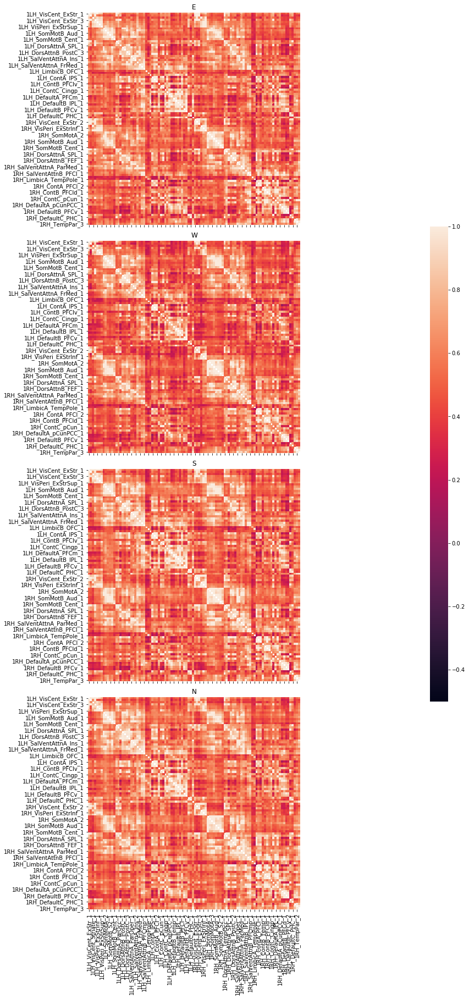

In [19]:
%matplotlib inline

fig, axes = plt.subplots(nrows=4, ncols=1, sharex=True, sharey=True, figsize=(15, 30),
                         gridspec_kw={'wspace': 0.025, 'hspace': 0.075})

cbar_ax = fig.add_axes([.91, .3, .03, .4])
r = 0
for trial_type, df in pd_dict.items():

    g = sns.heatmap(df, ax=axes[r], vmin=-.5, vmax=1., square=True,
                    cbar=True, cbar_ax=cbar_ax)
    axes[r].set_title(trial_type)
    # iterate over rows
    r += 1
plt.tight_layout()

Collect beta map results
========================


In [17]:
nii_dict = {}
for trial_type in trial_types:
    fname = filename_template.format(trial_type=trial_type, suffix='betaseries', ext='nii.gz')
    file_path = os.path.join(output_path, fname)
    nii_dict[trial_type] = nib.load(file_path)

# view east beta_maps
nib.viewers.OrthoSlicer3D(nii_dict['E'].get_fdata(),
                          title="East Betas").set_position(28, -14, -10)



FileNotFoundError: No such file or no access: '/mnt/chrastil/lab/users/lily/path_direction/localizer_beta_series_all_run_exploration/derivatives/nibetaseries/sub-*/func/sub-*_task-boldRun*_run-*_space-MNI152NLin2009cAsym_desc-E_betaseries.nii.gz'

Graph beta map standard deviation
=================================
We can find where the betas have the highest standard deviation for each trial type.
Unsuprisingly, the largest deviations are near the edge of the brain mask and
the subcortical regions.


In [ ]:
# standard deviations for each trial type
# std_dict = {tt: nib.Nifti1Image(img.get_fdata().std(axis=-1), img.affine, img.header)
#             for tt, img in nii_dict.items()}

# fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(10, 20))

# for idx, (trial_type, nii) in enumerate(std_dict.items()):
#     plotting.plot_stat_map(nii, title=trial_type, cut_coords=(0, 0, 0),
#                            threshold=5, vmax=20, axes=axes[idx])